# Convolutional Neural Network on Vegetables Classifier

## Objectives

- We are to implement a **multi-class image classifier** using CNNs
- Original images of **224 \* 224 pixel**, **15 different classes** (of vegetables)

- We should consider **2 input sizes** (grayscale images):
  - **31 \* 31 Pixels** - labelled `"a"` throughout this notebook
  - **128 \* 128 Pixels** - labelled `"b"` throughout this notebook

## Background Research

### Botanical families of the 15 different vegetables

Here are the 15 vegetables categorized into their respective families:

1. **Legume Family (Fabaceae)**:

   - Bean

2. **Cucurbitaceae Family**:

   - Bitter Gourd
   - Bottle Gourd
   - Cucumber
   - Pumpkin

3. **Nightshade Family (Solanaceae)**:

   - Brinjal
   - Capsicum
   - Tomato

4. **Cruciferous Family (Brassicaceae)**:

   - Broccoli
   - Cabbage
   - Cauliflower

5. **Other Families**:
   - Carrot (Umbelliferae)
   - Papaya (Caricaceae)
   - Potato (Solanaceae)
   - Radish (Brassicaceae)

- Based on this info, we could expect our model to **misclassify vegetables** that are of similar families, especially for **Broccoli and Cauliflower** as their **color tone** is the easiest way to distinguish them.
- Since we have to convert our input images to **grayscale images**, this could make the **classification more challenging**


In [1]:
import tensorflow as tf

gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        # Set memory growth configuration for each GPU
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
        # Proceed with other TensorFlow operations here
        logical_gpus = tf.config.list_logical_devices('GPU')
        print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
    except RuntimeError as e:
        print(e)

1 Physical GPUs, 1 Logical GPUs


## Loading Necessary Libraries

In [2]:
#Numpy, pandas, seaborn, matplotlib
import numpy as np
from numpy import asarray
import pandas as pd
import seaborn as sns
import tensorflow as tf
import matplotlib.pyplot as plt

#Tensorflow , Keras related
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential,clone_model
from tensorflow.keras.backend import clear_session
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import applications
from keras.utils.vis_utils import plot_model
from keras.layers import LeakyReLU
from kerastuner.tuners import RandomSearch
from kerastuner.engine.hyperparameters import HyperParameters
from tensorflow.keras import backend as K
from keras.regularizers import l1,l2,L1L2


from tensorflow.keras.callbacks import ModelCheckpoint,EarlyStopping
from tensorflow.keras.models import load_model

#Sklearn, imblearn
from imblearn.over_sampling import RandomOverSampler
from imblearn.over_sampling import SMOTE
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import confusion_matrix, classification_report

#Other libs
import os
from PIL import Image
import visualkeras
from skimage import color
from skimage import io


#To track performance of the CNN models (weights and biases)
import wandb
from wandb.keras import WandbCallback
from wandb.keras import WandbMetricsLogger

#Set default plot style using seaborn 'white' style
sns.set_style("white")

C:\Users\wilfr\AppData\Local\Temp\ipykernel_6504\3330672784.py:19: DeprecationWarning: `import kerastuner` is deprecated, please use `import keras_tuner`.
  from kerastuner.tuners import RandomSearch


# Data Exploration


### Loading and Converting Images


- Just to get a sense of how we would load our data later on


JPEG
(224, 224)
RGB
None
None
(224, 224)
L
None


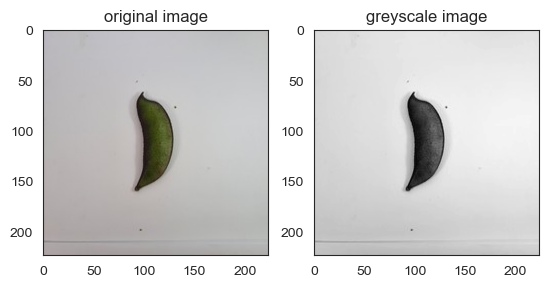

In [2]:

image = Image.open('Dataset for CA1 part A/train/Bean/0026.jpg')
image_gray = image.convert('L')
image_gray_2 = io.imread(
    "Dataset for CA1 part A/train/Bean/0026.jpg", as_gray=True)


numpy_image = asarray(image)
numpy_image_gray = asarray(image_gray)
numpy_image_gray_2 = asarray(image_gray_2)
# image_gray.show()

fig, ax = plt.subplots(nrows=1, ncols=2)

ax[0].set_title('original image')
ax[0].imshow(image)

print(image.format)
print(image.size)
print(image.mode)
print(image.palette)

ax[1].set_title('greyscale image')
ax[1].imshow(image_gray,cmap='gray')

print(image_gray.format)
print(image_gray.size)
print(image_gray.mode)
print(image_gray.palette)



### Resizing Images
- We can see that the 'resolution' of the 2 images defers quite a lot which is expected since the __img on the right(128 x 128)__ is made out of __> 4 times__ pixels vs the __left img(31 x 31)__ , overall __left img__ contains __less information__
- However, this could imply a __lower computational complexity__ for the __lower resolution img__ , leading to __faster training__

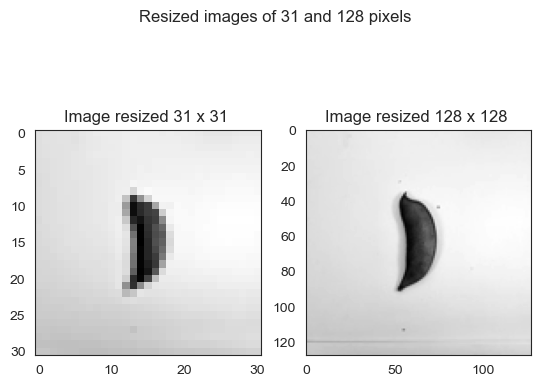

In [6]:

fig, ax = plt.subplots(nrows=1, ncols=2)


image_a = image_gray.resize((31, 31))
ax[0].imshow(image_a,cmap='gray')
ax[0].set_title('Image resized 31 x 31 ')

image_b = image_gray.resize((128, 128))
ax[1].imshow(image_b,cmap='gray')
ax[1].set_title('Image resized 128 x 128 ')

plt.suptitle('Resized images of 31 and 128 pixels')
plt.show()

## Loading images
- Here, we're manually __loading the dataset__ while performing conversion to of images to __grayscale__, __normalizing between 0 & 1__, and reshaping to required shape 
for later on



In [3]:


def load_images_from_directory(directory, target_size, grayscale=False):
    images = []
    labels = []
    for class_name in os.listdir(directory):
        class_directory = os.path.join(directory, class_name)
        if os.path.isdir(class_directory):
            for filename in os.listdir(class_directory):
                if filename.endswith(".jpg") or filename.endswith(".png"):
                    img_path = os.path.join(class_directory, filename)
                    image = Image.open(img_path)
                    image = image.resize(target_size)
                    if grayscale:
                        image = image.convert('L')  # Convert to grayscale
                        image = np.expand_dims(
                            np.array(image), axis=-1)  # Expand dimensions
                    image = np.array(image)
                    image = image.astype('float32')
                    image = image / 255.0  # Normalization step
                    images.append(image)
                    labels.append(class_name)
    images = np.array(images)
    labels = np.array(labels)
    return images, labels

## Loading Train, Test and Validation data

- __a__ represents the train/test/validation dataset with input size of __31 by 31 pixels__
- __b__ represents the train/test/validation dataset with input size input size of __128 by 128 pixels__


In [4]:

num_classes = 15

# Directory where images are stored
train_directory = 'Dataset for CA1 part A/train/'
test_directory = 'Dataset for CA1 part A/test/'
validation_directory = 'Dataset for CA1 part A/validation/'


# Input size a
images_a_train, labels_a_train = load_images_from_directory(
    train_directory, (31, 31), grayscale=True)

# Input size b
images_b_train, labels_b_train = load_images_from_directory(
    train_directory, (128, 128), grayscale=True)

# Input size a
images_a_val, labels_a_val = load_images_from_directory(
    test_directory, (31, 31), grayscale=True)

# Input size b
images_b_val, labels_b_val = load_images_from_directory(
    test_directory, (128, 128), grayscale=True)

# Input size a
images_a_test, labels_a_test = load_images_from_directory(
    test_directory, (31, 31), grayscale=True)

# Input size b
images_b_test, labels_b_test = load_images_from_directory(
    test_directory, (128, 128), grayscale=True)


# Check the shape of the imported images
print("Shape of train images(a) array:", images_a_train.shape[1:])
print("Shape of labels array:", labels_a_train.shape)
print(" ")
print("Shape of train images(b) array:", images_b_train.shape[1:])
print("Shape of labels array:", labels_b_train.shape)

Shape of train images(a) array: (31, 31, 1)
Shape of labels array: (9028,)
 
Shape of train images(b) array: (128, 128, 1)
Shape of labels array: (9028,)


## Looking At Classes




### Class Names
- we have 15 classes of vegetables as seen below


In [5]:
print(np.unique(labels_a_train))

['Bean' 'Bitter_Gourd' 'Bottle_Gourd' 'Brinjal' 'Broccoli' 'Cabbage'
 'Capsicum' 'Carrot' 'Cauliflower' 'Cucumber' 'Papaya' 'Potato' 'Pumpkin'
 'Radish' 'Tomato']


### Taking A Look at Training Examples (31 x 31 pixels)


In [5]:
#Function to plot one image from each of the 15 classes

def plot_example_imgs(labels,dataset):
    # Visualizing one image per class
    unique_labels = np.unique(labels)
    #num_classes = len(unique_labels)

    plt.figure(figsize=(10, 15))

    for i, label in enumerate(unique_labels):
        # Find the first image with the current label
        index = np.where(labels == label)[0][0]
        
        plt.subplot(5, 3, i + 1)  
        plt.imshow(dataset[index].squeeze(), cmap='gray')  
        plt.title(f"Class: {label}")
        plt.axis('off')

    plt.show()

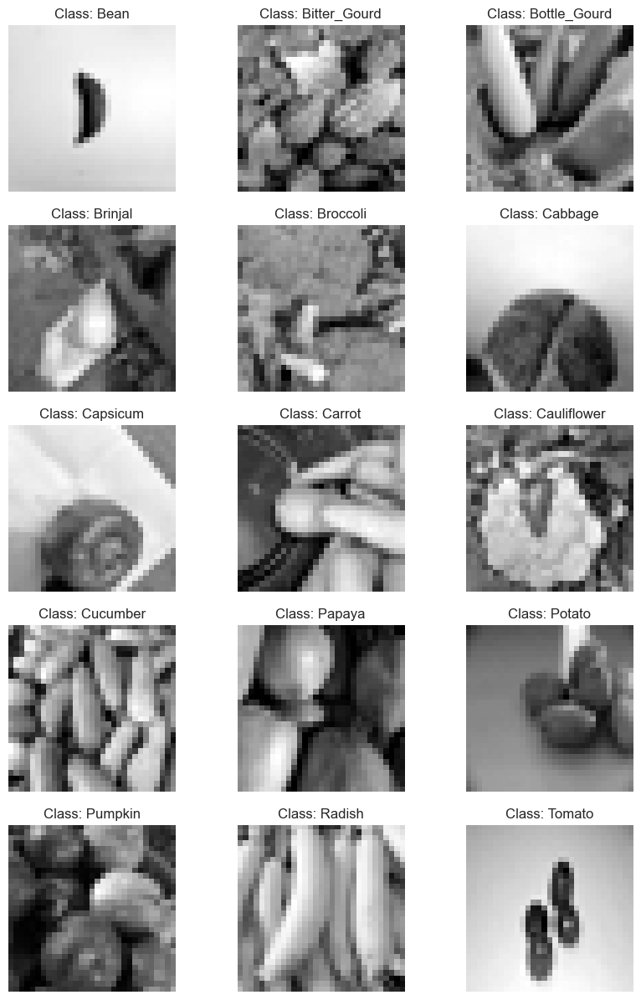

In [6]:
plot_example_imgs(labels_a_train,images_a_train)

### Taking A Look at Training Examples for class Beans (128 x 128 pixels)


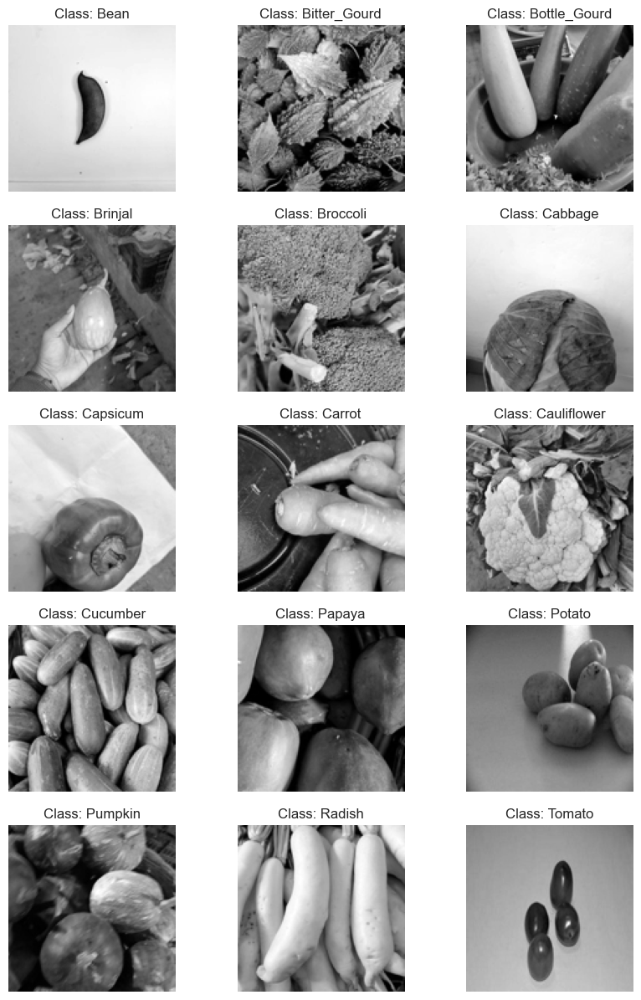

In [7]:
plot_example_imgs(labels_b_train,images_b_train)

## Check for class imbalance

- we just look at __labels & train set for a__ since both __a & b inputs__ would have the same __count__ anyways
- we can notice that classes in **train dataset** are **imbalanced**, while __test and validation dataset__ are __balanced__
- this suggests a need for methods like __modifying class weights__ ,__oversampling/undersampling__ which we explore later on


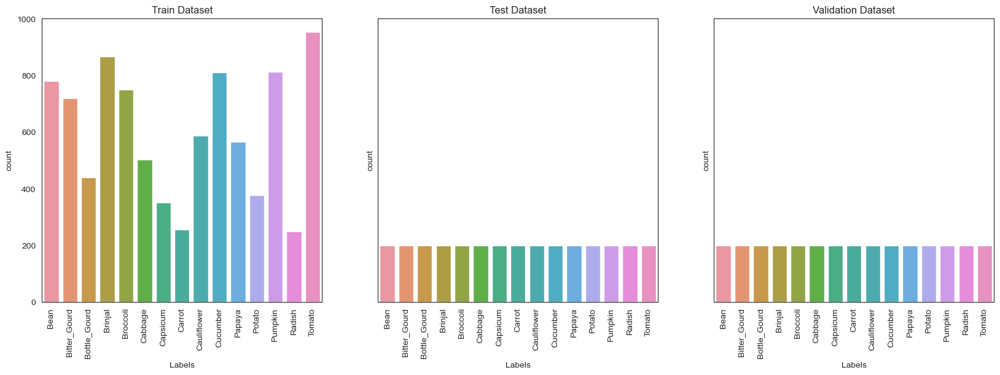

In [8]:
datasets = [labels_a_train, labels_a_test, labels_a_val]
titles = ["Train Dataset", "Test Dataset", "Validation Dataset"]

fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(20, 6),sharey=True,sharex=True)

for i, dataset in enumerate(datasets):
    df = pd.DataFrame(dataset, columns=["Labels"])
    ax = sns.countplot(x="Labels", data=df, ax=axes[i])
    ax.set_title(titles[i])
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90)  # Set rotation for x labels

plt.show()


## Convert Labels to Categorical
- This is more so if we want to use the labels for __model building__ later on which requires some preprocessing
- However, most likely using flow/load from directory along with __ImageDataGenerator__ 

In [5]:
from sklearn.preprocessing import LabelEncoder
from keras.utils import to_categorical

# Perform Label Encoding first
label_encoder = LabelEncoder()

labels_a_train = label_encoder.fit_transform(labels_a_train)
labels_a_val = label_encoder.fit_transform(labels_a_val)
labels_a_test = label_encoder.fit_transform(labels_a_test)

labels_b_train = label_encoder.fit_transform(labels_b_train)
labels_b_val = label_encoder.fit_transform(labels_b_val)
labels_b_test = label_encoder.fit_transform(labels_b_test)

# Converting to Categorical using keras
labels_a_train = to_categorical(labels_a_train)
labels_b_train = to_categorical(labels_b_train)

labels_a_test = to_categorical(labels_a_test)
labels_b_test = to_categorical(labels_b_test)

labels_a_val = to_categorical(labels_a_val)
labels_b_val = to_categorical(labels_b_val)

## Feature Engineering and Data Augmentation


## Data Augmentation
- There are 2 main methods for Data Augmentation.
    1. ImageDataGenerator 
    2. Augmentation Layer in the Sequential Model 

- Based on our dataset, we have __~9000 train images , 3000 validation and test images__, which can be argued to be __quite limited__, given that __each class would contain +-600 images on average__
- - - 

- I will be using Keras's __ImageDataGenerator__ for Augmentation on our __train data__
- Decided to use __flow_from_directory__ instead of flow since we are dealing with quite a large dataset and is way quick than __flow__

### Augmentation Techniques Applied:
- Width and Height shifting with a value of 0.2
- Random image rotation between -45 degrees to 45 degrees
- Random image zoom from 75% to 125%


## Looking at a sample of train image after augmentation

### 31 by 31 Train img

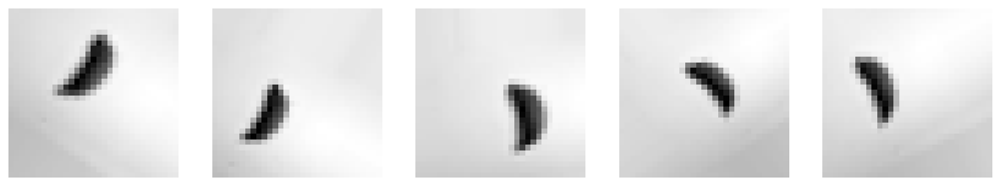

In [17]:

# ImageDataGenerator rotation
datagen = ImageDataGenerator(
    width_shift_range=0.2,
    height_shift_range=0.2,
    rotation_range = 45,
    zoom_range = [0.75,1.25]
    
)

img = images_a_train[0]


aug_iter = datagen.flow(img.reshape((1,img.shape[0],img.shape[1],1)), batch_size=1)

# generate samples and plot
fig, ax = plt.subplots(nrows=1, ncols=5, figsize=(15, 15))

# generate batch of images
for i in range(5):
    # convert to unsigned integers
    image = next(aug_iter)[0]
 
    # plot image
    ax[i].imshow(image.squeeze(), cmap='gray')  # Squeeze the dimensions for display
    ax[i].axis('off')

plt.show()


### 128 by 128 Train img

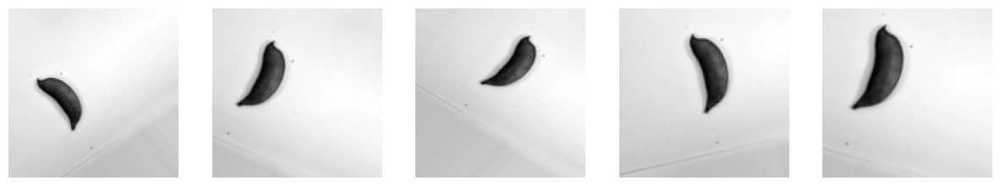

In [18]:


img = images_b_train[0]


aug_iter = datagen.flow(img.reshape((1,img.shape[0],img.shape[1],1)), batch_size=1)

# generate samples and plot
fig, ax = plt.subplots(nrows=1, ncols=5, figsize=(15, 15))

# generate batch of images
for i in range(5):
    # convert to unsigned integers
    image = next(aug_iter)[0]
 
    # plot image
    ax[i].imshow(image.squeeze(), cmap='gray')  # Squeeze the dimensions for display
    ax[i].axis('off')

plt.show()


### Applying Augmentation to the train datasets

In [83]:
#Directories 

base_directory = "Dataset for CA1 part A/train/"
val_directory = "Dataset for CA1 part A/validation/"
test_directory = "Dataset for CA1 part A/test/"

class_mode = "categorical"  


# Create an ImageDataGenerator with the desired augmentation configurations
train_datagen_aug = ImageDataGenerator(
    rescale = 1.0/255.0,
    width_shift_range=0.2,
    height_shift_range=0.2,
    rotation_range=45,
    zoom_range=[0.75, 1.25],


)

#Loading original data with normalizing pixel values between 0 and 1 
train_datagen = ImageDataGenerator(rescale = 1.0/255.0)

test_datagen = ImageDataGenerator(rescale = 1.0/255.0)

val_datagen = ImageDataGenerator(rescale = 1.0/255.0)

# Create an ImageDataGenerator without rescaling for unnormalized data
train_datagen_unnormalized = ImageDataGenerator()

val_datagen_unnormalized = ImageDataGenerator()


# Use flow_from_directory to generate augmented images for train a and b 
train_generator_a_aug = train_datagen_aug.flow_from_directory(
    
    base_directory,
    target_size=(31, 31),
    batch_size=32,
    class_mode=class_mode,
    color_mode='grayscale'
)

train_generator_b_aug = train_datagen_aug.flow_from_directory(
    base_directory,
    target_size=(128, 128),
    batch_size=32,
    class_mode=class_mode,
    color_mode='grayscale'
)



train_generator_a = train_datagen.flow_from_directory(base_directory,target_size = (31,31),batch_size=32,class_mode = class_mode,color_mode='grayscale')
train_generator_b = train_datagen.flow_from_directory(base_directory,target_size = (128,128),batch_size=32,class_mode = class_mode,color_mode='grayscale')
    
test_generator_a = test_datagen.flow_from_directory(val_directory,target_size = (31,31),batch_size=32,class_mode = class_mode,color_mode='grayscale')
test_generator_b = test_datagen.flow_from_directory(val_directory,target_size = (128,128),batch_size=32,class_mode = class_mode,color_mode='grayscale')

val_generator_a = val_datagen.flow_from_directory(val_directory,target_size = (31,31),batch_size=32,class_mode = class_mode,color_mode='grayscale')
val_generator_b = val_datagen.flow_from_directory(val_directory,target_size = (128,128),batch_size=32,class_mode = class_mode,color_mode='grayscale')

train_generator_b_unnormalized = train_datagen_unnormalized.flow_from_directory(base_directory,target_size = (128,128),batch_size=32,class_mode = class_mode,color_mode='grayscale')
val_generator_b_unnormalized = val_datagen_unnormalized.flow_from_directory(val_directory,target_size = (128,128),batch_size=32,class_mode = class_mode,color_mode='grayscale')

Found 9028 images belonging to 15 classes.
Found 9028 images belonging to 15 classes.
Found 9028 images belonging to 15 classes.
Found 9028 images belonging to 15 classes.
Found 3000 images belonging to 15 classes.
Found 3000 images belonging to 15 classes.
Found 3000 images belonging to 15 classes.
Found 3000 images belonging to 15 classes.
Found 9028 images belonging to 15 classes.
Found 3000 images belonging to 15 classes.


In [8]:
print(train_generator_a_aug.image_shape)
print(train_generator_b_aug.image_shape)
print(test_generator_a.image_shape)
print(test_generator_b.image_shape)
print(val_generator_a.image_shape)
print(val_generator_b.image_shape)
print(train_generator_a.image_shape)
print(train_generator_b.image_shape)
print(test_generator_a.image_shape)
print(test_generator_b.image_shape)
print(val_generator_a.image_shape)
print(val_generator_b.image_shape)

(31, 31, 1)
(128, 128, 1)
(31, 31, 1)
(128, 128, 1)
(31, 31, 1)
(128, 128, 1)
(31, 31, 1)
(128, 128, 1)
(31, 31, 1)
(128, 128, 1)
(31, 31, 1)
(128, 128, 1)


### Looking at sample images from dataset (31 by 31)

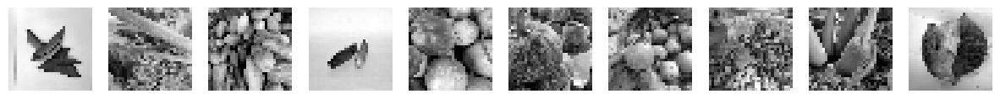

In [14]:
# generate samples and plot
fig, ax = plt.subplots(nrows=1, ncols=10, figsize=(15, 15))

# generate batch of images
for i in range(10):
    # convert to unsigned integers
    img = next(train_generator_a)[0][0] # Access the first element of the batch

    # plot image
    ax[i].imshow(img.squeeze(), cmap='gray')  # Squeeze the dimensions for display
    ax[i].axis('off')

plt.show()


### Looking at sample images from dataset (128 by 128)

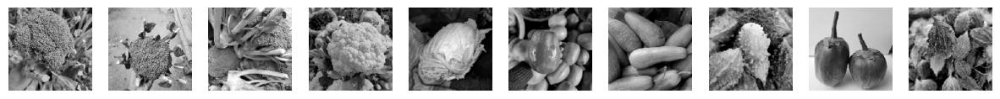

In [15]:
# generate samples and plot
fig, ax = plt.subplots(nrows=1, ncols=10, figsize=(15, 15))

# generate batch of images
for i in range(10):
    # convert to unsigned integers
    image = next(train_generator_b)[0][0]
    
    # plot image
    ax[i].imshow(image.squeeze(), cmap='gray')  # Squeeze the dimensions for display
    ax[i].axis('off')

plt.show()

## Methods to deal with Class Imbalance
- Mainly going to explore __3__ methods:

    - __SMOTE__ (Synthetic Minority Over-sampling Technique ) (imblearn) - generates synthetic samples using interpolation between existing minority samples
    - __Oversampling__ (imblearn) - replicates existing minority samples to balance the dataset.
    - __Class Weights__ (Sklearn) - Estimate class weights for unbalanced datasets.

### SMOTE for minority classes

In [7]:

# Reshaping the images datasets
images_a_train_reshaped = images_a_train.reshape(images_a_train.shape[0], -1)
images_b_train_reshaped = images_b_train.reshape(images_b_train.shape[0], -1)

# Applying SMOTE separately for the two datasets
smote_a = SMOTE(sampling_strategy='auto')
X_SMOTE_a, y_SMOTE_a = smote_a.fit_resample(
    images_a_train_reshaped, labels_a_train)

smote_b = SMOTE(sampling_strategy='auto')
X_SMOTE_b, y_SMOTE_b = smote_b.fit_resample(
    images_b_train_reshaped, labels_b_train)

# Reshaping back to the original shape
images_a_train_SMOTE = X_SMOTE_a.reshape(
    X_SMOTE_a.shape[0], 31, 31, 1)
images_b_train_SMOTE = X_SMOTE_b.reshape(
    X_SMOTE_b.shape[0], 128, 128, 1)

# Corresponding labels
labels_a_train_SMOTE = y_SMOTE_a
labels_b_train_SMOTE = y_SMOTE_b


In [10]:
print(images_a_train_SMOTE.shape)
print(images_b_train_SMOTE.shape)
print(labels_a_train_SMOTE.shape)
print(labels_b_train_SMOTE.shape)

(14325, 31, 31, 1)
(14325, 128, 128, 1)
(14325, 15)
(14325, 15)


### SMOTE + Augmentation 

In [8]:
# Create ImageDataGenerator instances for training and validation sets
train_datagen_asd = ImageDataGenerator(  
    width_shift_range=0.2,
    height_shift_range=0.2,
    rotation_range=45,
    zoom_range=[0.75, 1.25])

# Create data generators
train_generator_a_aug_SMOTE= train_datagen_asd.flow(images_a_train_SMOTE, labels_a_train_SMOTE, batch_size=32)
train_generator_b_aug_SMOTE = train_datagen_asd.flow(images_b_train_SMOTE, labels_b_train_SMOTE, batch_size=32)

### Oversampling for minority classes


In [9]:

# Reshaping the images datasets
images_a_train_reshaped = images_a_train.reshape(images_a_train.shape[0], -1)
images_b_train_reshaped = images_b_train.reshape(images_b_train.shape[0], -1)

# Applying oversampling separately for the two datasets
oversample_a = RandomOverSampler(sampling_strategy='auto')
X_resampled_a, y_resampled_a = oversample_a.fit_resample(
    images_a_train_reshaped, labels_a_train)

oversample_b = RandomOverSampler(sampling_strategy='auto')
X_resampled_b, y_resampled_b = oversample_b.fit_resample(
    images_b_train_reshaped, labels_b_train)

# Reshaping back to the original shape
images_a_train_resampled = X_resampled_a.reshape(
    X_resampled_a.shape[0], 31, 31, 1)
images_b_train_resampled = X_resampled_b.reshape(
    X_resampled_b.shape[0], 128, 128, 1)

# Corresponding labels
labels_a_train_resampled = y_resampled_a
labels_b_train_resampled = y_resampled_b

In [10]:
print(images_a_train_resampled.shape)
print(images_b_train_resampled.shape)
print(labels_a_train_resampled.shape)
print(labels_b_train_resampled.shape)

(14325, 31, 31, 1)
(14325, 128, 128, 1)
(14325, 15)
(14325, 15)


### Resampled + Augmentation 
- performing __Augmentation__ (during training) on the resampled train and validation set
- the reason why we want to perform __augmentation__ 

In [11]:
# Create ImageDataGenerator instances for training and validation sets
train_datagen_asd = ImageDataGenerator(  
    width_shift_range=0.2,
    height_shift_range=0.2,
    rotation_range=45,
    zoom_range=[0.75, 1.25])


# Create data generators
train_generator_a_aug_resampled= train_datagen_asd.flow(images_a_train_resampled, labels_a_train_resampled, batch_size=32)
train_generator_b_aug_resampled = train_datagen_asd.flow(images_b_train_resampled, labels_b_train_resampled, batch_size=32)



### Setting Class Weights
- Dealing with the imbalanced train dataset using __Sklearn's compute_class_weight__
- Essentially giving more weight to the minority classes during training

In [12]:


def computeClassWeight(generator):
    # Get class counts from train_generator_b
    class_counts = generator.classes
    class_labels = np.unique(class_counts)

    # Compute class weights
    class_weights = compute_class_weight(class_weight='balanced', classes=class_labels, y=class_counts)

    # Create a dictionary mapping the class labels to their respective weights
    class_weights_dict = dict(zip(class_labels, class_weights))
    
    return class_weights_dict

In [13]:
class_weights_dict = computeClassWeight(train_generator_a)

class_weights_dict



{0: 0.7716239316239316,
 1: 0.835925925925926,
 2: 1.3647770219198792,
 3: 0.693394777265745,
 4: 0.8024888888888889,
 5: 1.1965540092776674,
 6: 1.7147198480531813,
 7: 2.3510416666666667,
 8: 1.0253265190232823,
 9: 0.7412151067323481,
 10: 1.0633686690223794,
 11: 1.5964633068081344,
 12: 0.7393939393939394,
 13: 2.4268817204301074,
 14: 0.6302268760907505}

## Helper Functions

### Function: Plot Accuracies for Baseline CNN models 

In [14]:
def plot_model_accuracy_baseline(histories,training_configurations):

    fig, axes = plt.subplots(2, 2, sharex=True, sharey=True, figsize=(12, 8))
    fig.suptitle("Model Accuracy")

    for history, ax, config in zip(histories, axes.flatten(), training_configurations):
        
        ax.plot(history.history['accuracy'], label='Train')
        ax.plot(history.history['val_accuracy'], label='Validation')
        ax.set_title(config["name"])
        ax.set_xlabel('Epochs')
        ax.set_ylabel('Accuracy')
        ax.legend(loc= 'lower right')

    plt.show()

### Function: Plot Loss for Baseline CNN models Function

In [15]:
def plot_model_loss_baseline(histories,training_configurations):
    fig, axes = plt.subplots(2, 2, sharex=True, sharey=True, figsize=(12, 8))
    fig.suptitle("Model Loss")

    for history, ax, config in zip(histories, axes.flatten(), training_configurations):
        
        ax.plot(history.history['loss'], label='Train')
        ax.plot(history.history['val_loss'], label='Validation')
        ax.set_title(config["name"])
        ax.set_xlabel('Epochs')
        ax.set_ylabel('Loss')
        ax.legend()

    # Show the plot
    plt.show()

### Function for Confusion Matrix & Classification Report
- looking at just __Accuracy__ would not be enough to determine the __model's performance__
- we can use __macro-averaging__ since we have an imbalanced dataset


In [16]:


def Confusion_Matrix_And_Report(model,test,labels):
    # Predict
    y_prediction = np.argmax(model.predict(test), axis=1)
    y_test = labels
    y_test_labels = np.argmax(y_test, axis=1) if len(y_test.shape) > 1 else y_test


    conf_matrix = confusion_matrix(y_test_labels, y_prediction)

    # Plot confusion matrix
    plt.figure(figsize=(10, 8))
    sns.heatmap(conf_matrix, annot=True, cmap='Blues', fmt='d')
    plt.title('Confusion matrix')
    plt.xlabel('Predicted label')
    plt.ylabel('True label')
    plt.show()


    print('Classification Report')
    target_names = ['Bean', 'Bitter_Gourd', 'Bottle_Gourd' ,'Brinjal' ,'Broccoli' ,'Cabbage','Capsicum', 'Carrot','Cauliflower', 'Cucumber', 'Papaya' ,'Potato' ,'Pumpkin', 'Radish' ,'Tomato']
    print(classification_report(y_test_labels, y_prediction, target_names=target_names))


### Function: Plotting mis-classified images of model

In [156]:
def visualize_misclassifications(model, test_images, test_labels,input_size, class_names=['Bean', 'Bitter_Gourd', 'Bottle_Gourd', 'Brinjal', 'Broccoli', 'Cabbage', 'Capsicum', 'Carrot', 'Cauliflower', 'Cucumber', 'Papaya', 'Potato', 'Pumpkin', 'Radish', 'Tomato']):

    predictions = model.predict(test_images)

    predicted_labels = np.argmax(predictions, axis=1)

    true_labels = np.argmax(test_labels, axis=1)

    misclassified_indices = np.where(predicted_labels != true_labels)[0]

    # Display one misclassified image per class, if available
    for class_idx in range(len(class_names)):
        class_indices = np.where(true_labels == class_idx)[0]
        
        # Find the first misclassified index for the current class
        misclass_idx_for_class = next((idx for idx in class_indices if idx in misclassified_indices), None)
        
        if misclass_idx_for_class is not None:
            predicted_class = predicted_labels[misclass_idx_for_class]
            true_class = true_labels[misclass_idx_for_class]
            confidence = predictions[misclass_idx_for_class, predicted_class]

            # Get the class names
            predicted_class_name = class_names[predicted_class]
            true_class_name = class_names[true_class]

            # Plot the misclassified image
            plt.imshow(test_images[misclass_idx_for_class].reshape((input_size,input_size)), cmap='gray')
            plt.title(
                f'True: {true_class_name}, Predicted: {predicted_class_name}\n(Confidence: {confidence:.2f})')
            plt.show()


# Modelling and Evaluation

## Testing Simple CNN Sequential Model
- Using __two__ Convolution and MaxPooling layers first, with __ReLU__ as our activation function for both __inputs a & b__ , __Softmax__ for final layer
- I would also add a __Dense__ layer also at the end of the __layers__
- Optimizer set as __Adam__ , we will also look at __metrics__ like __Accuracy,Precision,Recall & ROC AUC__

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_4 (Conv2D)           (None, 29, 29, 32)        320       
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 14, 14, 32)       0         
 2D)                                                             
                                                                 
 conv2d_5 (Conv2D)           (None, 12, 12, 64)        18496     
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 6, 6, 64)         0         
 2D)                                                             
                                                                 
 flatten_1 (Flatten)         (None, 2304)              0         
                                                                 
 dense_2 (Dense)             (None, 128)              

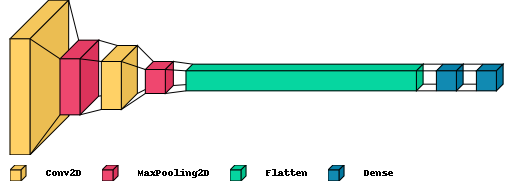

In [180]:
model_base_a = Sequential([
    
    Conv2D(32, kernel_size=(3, 3), activation="relu",input_shape=(31,31 ,1)),
    MaxPooling2D(pool_size=(2, 2)),
    Conv2D(64, kernel_size=(3, 3), activation='relu'),
    MaxPooling2D(pool_size=(2, 2)),
    Flatten(),
    Dense(128, activation='relu'),
    Dense(num_classes, activation="softmax")
])
model_base_b = Sequential([
    
    Conv2D(32, kernel_size=(3, 3), activation="relu",input_shape=(128, 128, 1)),
    MaxPooling2D(pool_size=(2, 2)),
    Conv2D(64, kernel_size=(3, 3), activation='relu'),
    MaxPooling2D(pool_size=(2, 2)),
    Flatten(),
    Dense(128, activation='relu'),
    Dense(num_classes, activation="softmax")
])




model_base_a.summary()
model_base_b.summary()
# Using visualkeras

display(visualkeras.layered_view(model_base_a, spacing=20, legend=True))


## Model A Training


In [38]:

checkpoint_a_orig = ModelCheckpoint("Models/model_base_a_original.h5",
                                     monitor='val_accuracy',  
                                     save_best_only=True,
                                     verbose=1)
wandb.init(project="DELE_CA1_ModelA")
model_a_orig = clone_model(model_base_a)
model_a_orig.compile(optimizer='adam',
                             loss='categorical_crossentropy',
                             metrics=["accuracy", "AUC", "Precision", "Recall"])

history_a_orig = model_a_orig.fit(images_a_train,labels_a_train,
                                     validation_data=(images_a_val, labels_a_val),
                                     validation_split=0.5,
                                     epochs=25,
                                     verbose=0, batch_size=32,33
                                     callbacks=[WandbMetricsLogger(),checkpoint_a_orig])

epoch/accuracy,▁▃▄▅▅▆▆▆▇▇▇▇▇▇▇██████████
epoch/auc,▁▄▆▆▇▇▇▇█████████████████
epoch/epoch,▁▁▂▂▂▂▃▃▃▄▄▄▅▅▅▅▆▆▆▇▇▇▇██
epoch/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/loss,█▆▅▅▄▄▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁
epoch/precision,▁▂▃▃▄▄▅▅▆▆▆▆▇▇▇▇▇████████
epoch/recall,▁▂▃▄▅▅▆▆▆▇▇▇▇▇▇██████████
epoch/val_accuracy,▁▂▃▄▅▆▇▆▇▇▆▇█▇█████▇█████
epoch/val_auc,▁▃▄▅▇▇█▇██▇██▇█████▇███▇█
epoch/val_loss,█▇▆▅▃▂▂▂▂▁▂▁▁▂▁▁▂▁▂▃▂▂▂▂▂
epoch/val_precision,▂▁▃▅▆██▇▇█▆██▆█▇▇██▆███▇▇



Epoch 1: val_accuracy improved from -inf to 0.33200, saving model to Models\model_base_a_original.h5

Epoch 2: val_accuracy improved from 0.33200 to 0.44900, saving model to Models\model_base_a_original.h5

Epoch 3: val_accuracy improved from 0.44900 to 0.55867, saving model to Models\model_base_a_original.h5

Epoch 4: val_accuracy improved from 0.55867 to 0.57100, saving model to Models\model_base_a_original.h5

Epoch 5: val_accuracy improved from 0.57100 to 0.64800, saving model to Models\model_base_a_original.h5

Epoch 6: val_accuracy improved from 0.64800 to 0.69033, saving model to Models\model_base_a_original.h5

Epoch 7: val_accuracy did not improve from 0.69033

Epoch 8: val_accuracy improved from 0.69033 to 0.71667, saving model to Models\model_base_a_original.h5

Epoch 9: val_accuracy improved from 0.71667 to 0.75767, saving model to Models\model_base_a_original.h5

Epoch 10: val_accuracy did not improve from 0.75767

Epoch 11: val_accuracy improved from 0.75767 to 0.77900, 

## Testing on Resampled Train set + Augmentation for 128 by 128 Images

In [223]:

# checkpoint_a_aug_resampled = ModelCheckpoint("Models/checkpoint_a_aug_resampled.h5",
#                                      monitor='val_accuracy',  
#                                      save_best_only=True,
#                                      verbose=1)
model_a_orig_aug2 = clone_model(model_b_aug)
model_a_orig_aug2.compile(optimizer='adam',
                             loss='categorical_crossentropy',
                             metrics=["accuracy", "AUC", "Precision", "Recall"])
history_a_aug_resampled = model_a_orig_aug2.fit(train_generator_b_aug_resampled,
                                     validation_data=(val_generator_b),
                                     epochs=50,
                                     verbose=1, batch_size=32,
                                     )

Epoch 1/50
448/448 [==============================] - 139s 305ms/step - loss: 2.4791 - accuracy: 0.1846 - auc: 0.7102 - precision: 0.5836 - recall: 0.0124 - val_loss: 2.0867 - val_accuracy: 0.3213 - val_auc: 0.8286 - val_precision: 0.7010 - val_recall: 0.0907
Epoch 2/50
448/448 [==============================] - 134s 300ms/step - loss: 1.7760 - accuracy: 0.4454 - auc: 0.8888 - precision: 0.7161 - recall: 0.2075 - val_loss: 1.5748 - val_accuracy: 0.5307 - val_auc: 0.9193 - val_precision: 0.6709 - val_recall: 0.4037
Epoch 3/50
448/448 [==============================] - 135s 301ms/step - loss: 1.3141 - accuracy: 0.6177 - auc: 0.9471 - precision: 0.7713 - recall: 0.4535 - val_loss: 1.1488 - val_accuracy: 0.6783 - val_auc: 0.9594 - val_precision: 0.7681 - val_recall: 0.6073
Epoch 4/50
448/448 [==============================] - 138s 308ms/step - loss: 1.0720 - accuracy: 0.7069 - auc: 0.9675 - precision: 0.8147 - recall: 0.5943 - val_loss: 1.5091 - val_accuracy: 0.6137 - val_auc: 0.9324 - val

### Train and Validation Accuracies

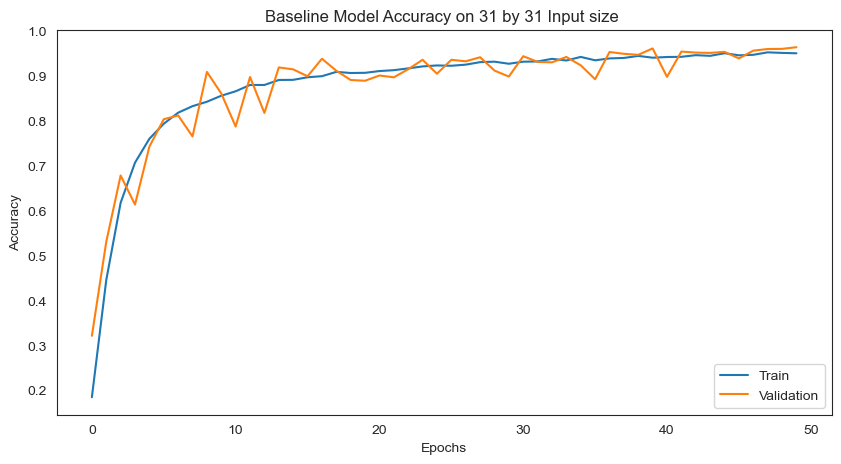

In [227]:

plt.figure(figsize=(10,5))

plt.title("Baseline Model Accuracy on 31 by 31 Input size ")
plt.plot(history_a_aug_resampled.history['accuracy'], label='Train')
plt.plot(history_a_aug_resampled.history['val_accuracy'], label='Validation')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend(loc= 'lower right')
plt.show()

In [228]:
model_a_orig_aug2.evaluate(images_b_test,labels_b_test)

94/94 [==============================] - 9s 100ms/step - loss: 0.2918 - accuracy: 0.9710 - auc: 0.9974 - precision: 0.9768 - recall: 0.9687


[0.2918008863925934,
 0.9710000157356262,
 0.9974493384361267,
 0.9768067002296448,
 0.968666672706604]

94/94 [==============================] - 9s 99ms/step


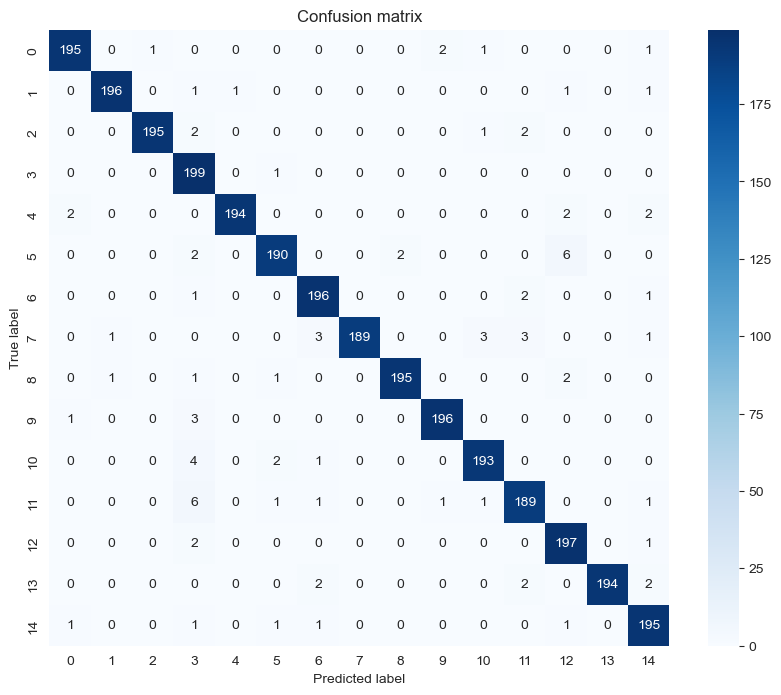

Classification Report
              precision    recall  f1-score   support

        Bean       0.98      0.97      0.98       200
Bitter_Gourd       0.99      0.98      0.98       200
Bottle_Gourd       0.99      0.97      0.98       200
     Brinjal       0.90      0.99      0.94       200
    Broccoli       0.99      0.97      0.98       200
     Cabbage       0.97      0.95      0.96       200
    Capsicum       0.96      0.98      0.97       200
      Carrot       1.00      0.94      0.97       200
 Cauliflower       0.99      0.97      0.98       200
    Cucumber       0.98      0.98      0.98       200
      Papaya       0.97      0.96      0.97       200
      Potato       0.95      0.94      0.95       200
     Pumpkin       0.94      0.98      0.96       200
      Radish       1.00      0.97      0.98       200
      Tomato       0.95      0.97      0.96       200

    accuracy                           0.97      3000
   macro avg       0.97      0.97      0.97      3000
weig

In [226]:
Confusion_Matrix_And_Report(model_a_orig_aug2,images_b_test,labels_b_test)

## Looking at Train and Validation Accuracies & Loss
- we do see the model __Overfitting__ as the __train & val__ accuracies differ quite alot (train ~ 100% , val ~ 0.75 - 0.8)

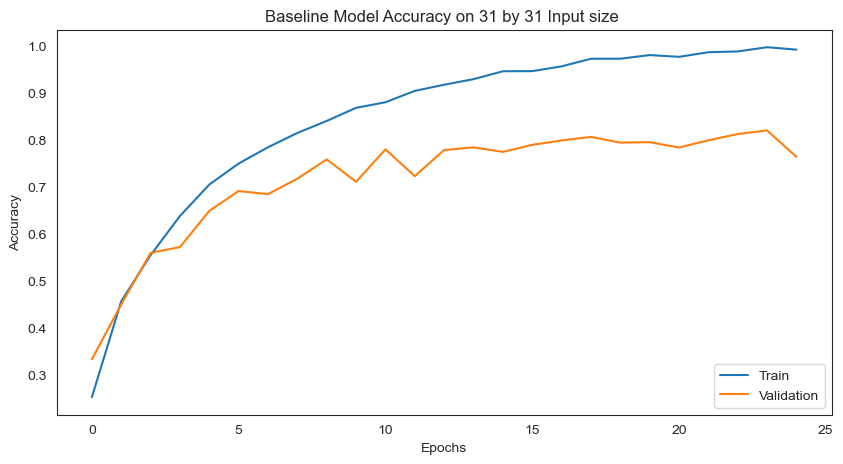

In [39]:

plt.figure(figsize=(10,5))

plt.title("Baseline Model Accuracy on 31 by 31 Input size ")
plt.plot(history_a_orig.history['accuracy'], label='Train')
plt.plot(history_a_orig.history['val_accuracy'], label='Validation')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend(loc= 'lower right')
plt.show()

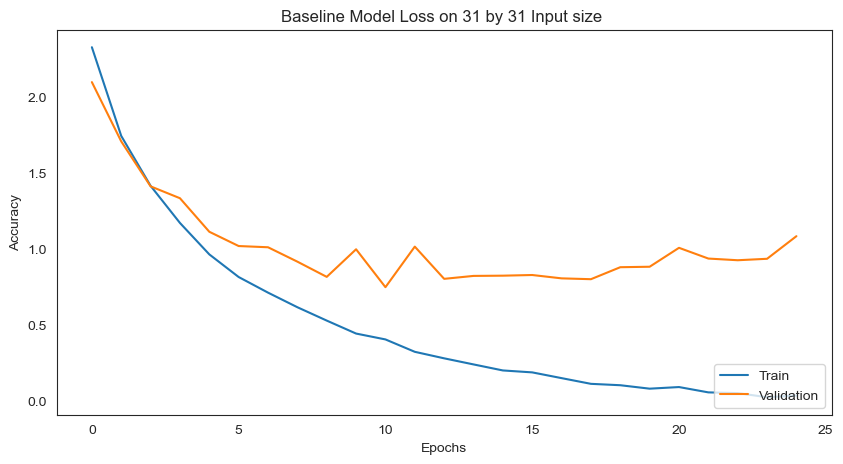

In [40]:
plt.figure(figsize=(10,5))

plt.title("Baseline Model Loss on 31 by 31 Input size ")
plt.plot(history_a_orig.history['loss'], label='Train')
plt.plot(history_a_orig.history['val_loss'], label='Validation')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend(loc= 'lower right')
plt.show()

In [47]:
# Initializing a new run
wandb.init(project="DELE_CA1_ModelA", entity='sugarwaffles-test')

# Compile the model
model_base_a.compile(optimizer='adam',
                     loss='categorical_crossentropy',
                     metrics=["accuracy", "AUC", "Precision", "Recall"])

# List to store history objects
all_histories = []

# List of training configurations
training_configs = [
    {"data": (images_a_train, labels_a_train),
     "name": "Original unbalanced train dataset"},
    {"data": (images_a_train_SMOTE, labels_a_train_SMOTE),
     "name": "Train dataset with SMOTE"},
    {"data": (images_a_train_resampled, labels_a_train_resampled),
     "name": "Train dataset with oversampling"},
    {"data": (images_a_train, labels_a_train),
     "name": "Original train dataset with class weights",
     "class_weight": class_weights_dict}
]

for config in training_configs:
    # Allows model_base_a weights to start from fresh again whenever a new iteration is being performed
    model_instance = clone_model(model_base_a)
    model_instance.compile(optimizer='adam',
                           loss='categorical_crossentropy',
                           metrics=["accuracy", "AUC", "Precision", "Recall"])

    data, data_name = config["data"], config["name"]
    print(f"Training model for: {data_name}")

    class_weight = config.get("class_weight", None)
    
    # Define a ModelCheckpoint callback for the original unbalanced train dataset

    history = model_instance.fit(*data,
                                 validation_data=(images_a_val, labels_a_val),
                                 validation_split=0.5,
                                 epochs=25,
                                 verbose=0, batch_size=32,
                                 class_weight=class_weight,
                                 callbacks=[WandbMetricsLogger()])

    all_histories.append(history)

    # Clear GPU memory
    clear_session()

wandb.finish()


epoch/accuracy,▁▃▄▅▆▆▆▇▇▇▇▇█████████████
epoch/auc,▁▅▆▇▇▇███████████████████
epoch/epoch,▁▁▂▂▂▂▃▃▃▄▄▄▅▅▅▅▆▆▆▇▇▇▇██
epoch/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/loss,█▆▅▄▄▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁
epoch/precision,▁▃▃▄▅▅▆▆▆▇▇▇▇▇▇███▇██▇███
epoch/recall,▁▂▄▅▅▆▆▇▇▇▇▇▇████████████
epoch/val_accuracy,▁▃▅▅▆▅▇▇▇▇█▇▇▇▇████▇█████
epoch/val_auc,▁▅▆▇▇▇███████████████████
epoch/val_loss,█▅▄▃▂▄▂▂▁▁▁▁▂▁▂▁▂▁▁▂▂▁▂▁▂
epoch/val_precision,▁▅▆▆▇▃▇▇███▇▆▇▇▇▇▇█▇▇████


Training model for: Original unbalanced train dataset
Training model for: Train dataset with SMOTE
Training model for: Train dataset with oversampling
Training model for: Original train dataset with class weights


epoch/accuracy,▁▄▆▆▇▇████▁▅▇▇▇█████▁▆▇███████▃▄▆▇▇▇████
epoch/auc,▁▆▇███████▂▇████████▂▇████████▄▆▇███████
epoch/epoch,▁▂▂▃▄▅▅▆▇▇▁▂▂▃▄▅▅▆▇█▁▂▂▃▄▅▆▆▇█▁▂▃▃▄▅▆▆▇█
epoch/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/loss,█▅▄▃▂▂▂▁▁▁█▄▂▂▂▁▁▁▁▁█▃▂▁▁▁▁▁▁▁▆▅▃▂▂▂▁▁▁▁
epoch/precision,▁▃▅▅▆▇▇▇██▃▄▆▇▇█████▃▆▇▇██████▃▄▅▆▇▇▇▇▇█
epoch/recall,▁▃▅▆▇▇████▁▅▇▇██████▁▆▇███████▂▄▆▆▇▇████
epoch/val_accuracy,▁▃▆▇▇▇████▂▅▇▇▇▇▇███▂▇▇▇▇█████▃▅▆▇▇█████
epoch/val_auc,▁▅▇███████▃▆█▇▇▇▇▇▇▇▃███▇▇▇▇▇▇▄▆▇█████▇▇
epoch/val_loss,█▅▃▂▁▁▁▂▂▂▇▄▂▂▂▃▄▃▃▄▇▂▂▂▂▂▃▃▃▃▆▄▃▂▂▁▂▂▂▃
epoch/val_precision,▇▃▆▇█▇█▇▇▇▅▄▆▅▆▆▅▆▆▆▁█▆▇▆▇▆▇▆▆▅▅▆▇▇█▇▇▇▆


## Evaluate Model A on Test set
- We can see that the __Simple CNN__ model performed not as bad even just on the __Original Train Set__, with __macro avg__ accuracies, f1-score, recall & precision scores of __0.82__

In [41]:
from tensorflow.keras.models import load_model

# Loading from checkpoint
model_base_a_orig= load_model("Models/model_base_a_original.h5")

94/94 [==============================] - 0s 2ms/step


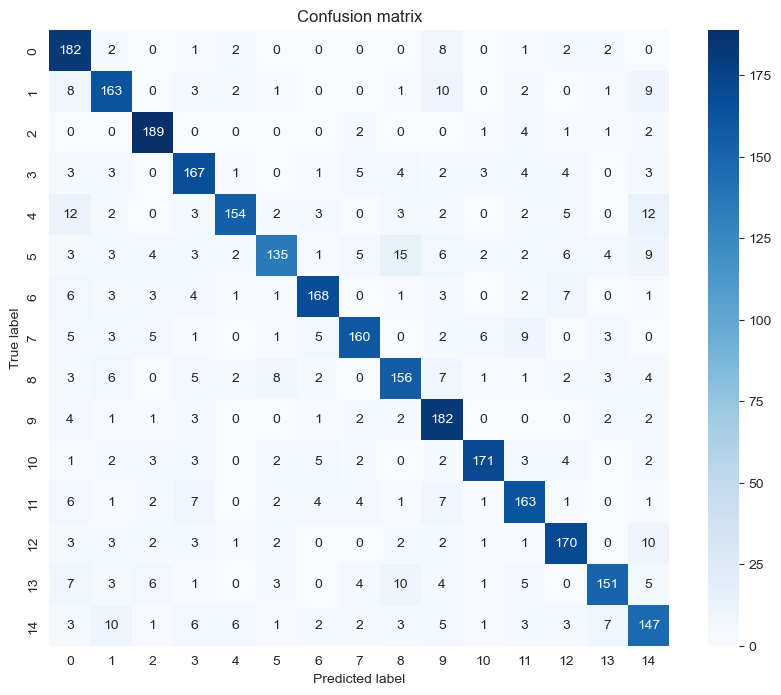

Classification Report
              precision    recall  f1-score   support

        Bean       0.74      0.91      0.82       200
Bitter_Gourd       0.80      0.81      0.80       200
Bottle_Gourd       0.88      0.94      0.91       200
     Brinjal       0.80      0.83      0.81       200
    Broccoli       0.90      0.77      0.83       200
     Cabbage       0.85      0.68      0.75       200
    Capsicum       0.88      0.84      0.86       200
      Carrot       0.86      0.80      0.83       200
 Cauliflower       0.79      0.78      0.78       200
    Cucumber       0.75      0.91      0.82       200
      Papaya       0.91      0.85      0.88       200
      Potato       0.81      0.81      0.81       200
     Pumpkin       0.83      0.85      0.84       200
      Radish       0.87      0.76      0.81       200
      Tomato       0.71      0.73      0.72       200

    accuracy                           0.82      3000
   macro avg       0.82      0.82      0.82      3000
weig

In [42]:
Confusion_Matrix_And_Report(model_base_a_orig,images_a_test,labels_a_test)

## Model A Train & Validation Accuracies
- Overall, the Model seems to be __overfitting__ on all of the __train__ set regardless of __configurations to deal with class imbalance__
- Both __SMOTE__ & __Oversampling__ gave __quite similar__ results, while __Class weights__ cld be seen trying to __close the gap__ between __train & val__ accuracies

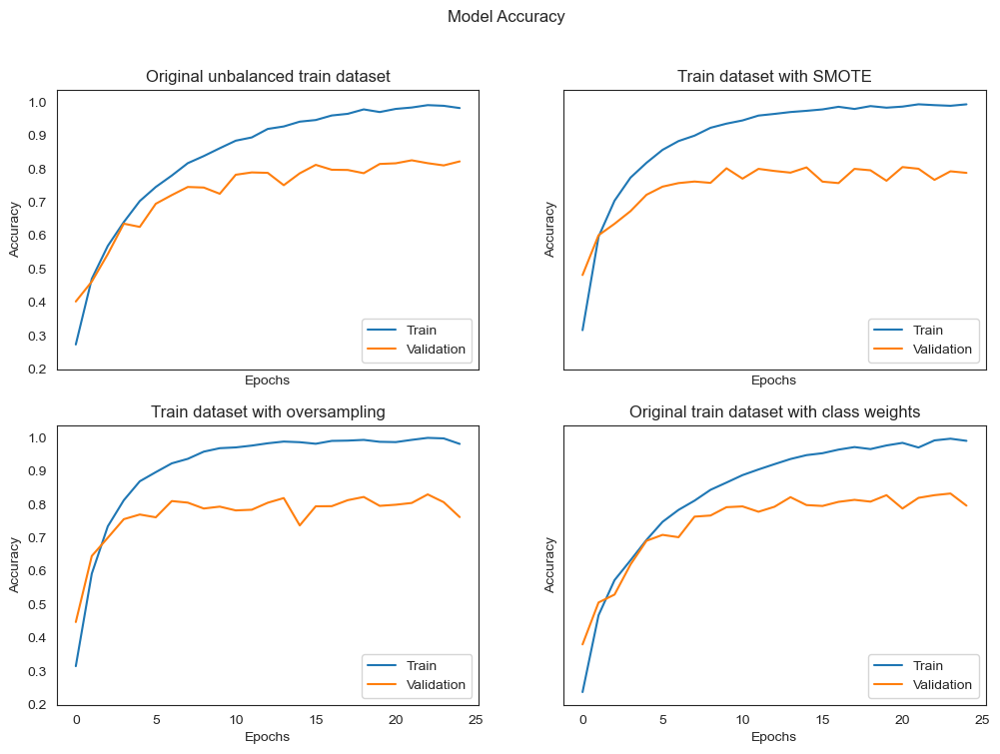

In [50]:
plot_model_accuracy_baseline(all_histories,training_configs)

## Model A Train & Validation Loss
- We can see that all __3 class imbalance methods__ tends to have a __higher validation loss__ compared to the original set
- Generally lead to poorer performance


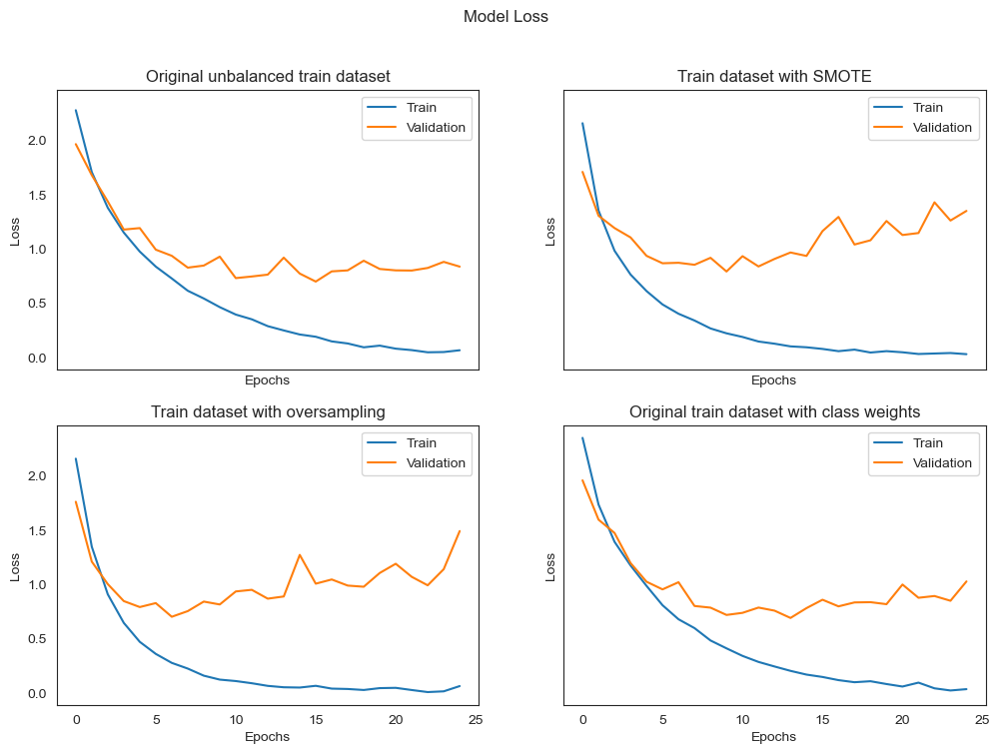

In [51]:
plot_model_loss_baseline(all_histories,training_configs)

## Model B Training
- we will be repeating what we did for __Model A__ on the __2nd input size 128 by 128__



### Fitting with Original Train Set without any configs

In [202]:

checkpoint_b_orig = ModelCheckpoint("Models/model_base_b_original.h5",
                                     monitor='val_accuracy',  
                                     save_best_only=True,
                                     verbose=1)
wandb.init(project="CA1")
model_b_orig = clone_model(model_base_b)
model_b_orig.compile(optimizer='adam',
                             loss='categorical_crossentropy',
                             metrics=["accuracy", "AUC", "Precision", "Recall"])

history_b_orig = model_b_orig.fit(images_b_train,labels_b_train,
                                     validation_data=(images_b_val, labels_b_val),
                                     validation_split=0.5,
                                     epochs=25,
                                     verbose=0, batch_size=32,
                                     callbacks=[WandbMetricsLogger(),checkpoint_b_orig])

epoch/accuracy,▁▄▅▆▇▇███████████████████
epoch/auc,▁▆▇██████████████████████
epoch/epoch,▁▁▂▂▂▂▃▃▃▄▄▄▅▅▅▅▆▆▆▇▇▇▇██
epoch/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/loss,█▅▄▃▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/precision,▁▃▅▆▇▇███████████████████
epoch/recall,▁▄▅▆▇▇███████████████████
epoch/val_accuracy,▁▃▆▅▆▆▇▇▇▇▆▇▇▇▄▆█████████
epoch/val_auc,▂▆█▆▆▆▆▆▆▅▄▅▅▅▁▃▅▅▅▅▅▅▅▅▅
epoch/val_loss,▄▂▁▂▂▃▃▂▃▃▄▃▄▄█▅▄▄▄▄▄▄▅▅▅
epoch/val_precision,▆▅█▅▅▄▅▆▅▅▄▅▅▅▁▄▆▆▆▆▆▆▆▆▆



Epoch 1: val_accuracy improved from -inf to 0.50533, saving model to Models\model_base_b_original.h5

Epoch 2: val_accuracy improved from 0.50533 to 0.68467, saving model to Models\model_base_b_original.h5

Epoch 3: val_accuracy improved from 0.68467 to 0.74100, saving model to Models\model_base_b_original.h5

Epoch 4: val_accuracy did not improve from 0.74100

Epoch 5: val_accuracy improved from 0.74100 to 0.76233, saving model to Models\model_base_b_original.h5

Epoch 6: val_accuracy improved from 0.76233 to 0.76533, saving model to Models\model_base_b_original.h5

Epoch 7: val_accuracy did not improve from 0.76533

Epoch 8: val_accuracy did not improve from 0.76533

Epoch 9: val_accuracy did not improve from 0.76533

Epoch 10: val_accuracy did not improve from 0.76533

Epoch 11: val_accuracy improved from 0.76533 to 0.77933, saving model to Models\model_base_b_original.h5

Epoch 12: val_accuracy improved from 0.77933 to 0.78267, saving model to Models\model_base_b_original.h5

Epoc

## Looking at Train and Validation Accuracies & Loss
- As compared to the Model performance on __Input images of 31 by 31__, we see a worse performance in general
- we do see the model __Overfitting__ again as the __train & val__ accuracies differ quite alot (train ~ 0.98 , val ~ 0.7)

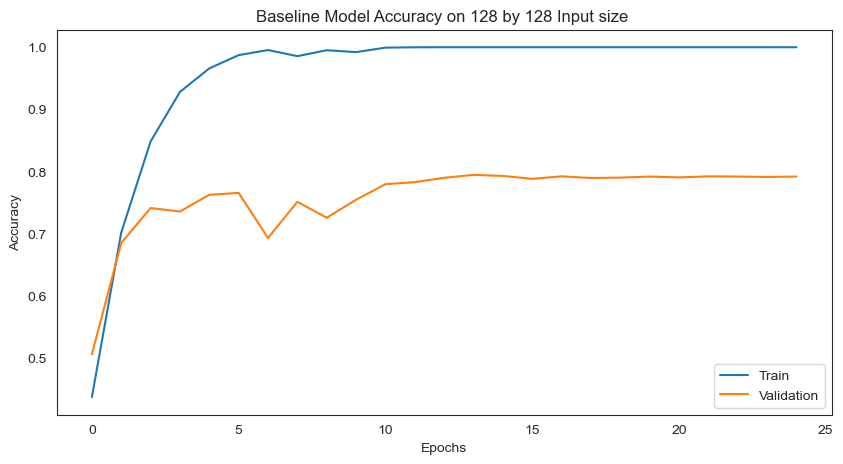

In [203]:

plt.figure(figsize=(10,5))

plt.title("Baseline Model Accuracy on 128 by 128 Input size ")
plt.plot(history_b_orig.history['accuracy'], label='Train')
plt.plot(history_b_orig.history['val_accuracy'], label='Validation')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend(loc= 'lower right')
plt.show()

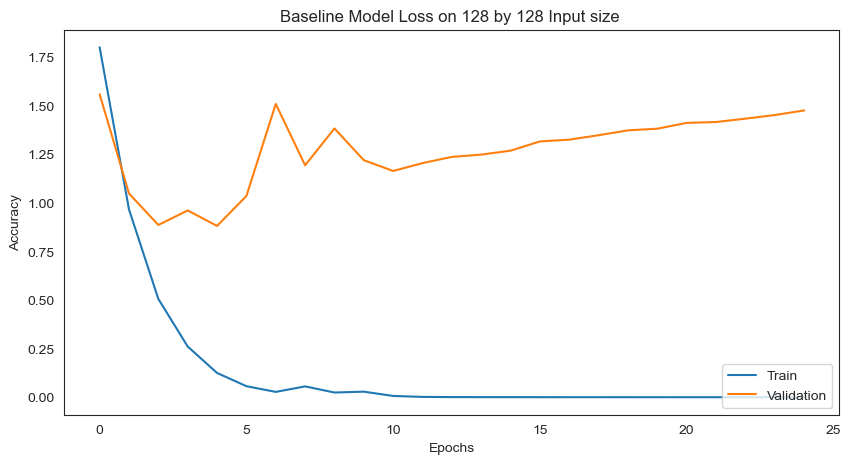

In [204]:
plt.figure(figsize=(10,5))

plt.title("Baseline Model Loss on 128 by 128 Input size ")
plt.plot(history_b_orig.history['loss'], label='Train')
plt.plot(history_b_orig.history['val_loss'], label='Validation')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend(loc= 'lower right')
plt.show()

### Fitting on 3 Different configs (methods of class imbalance)

In [198]:
# Initializing a new run
wandb.init(project="CA1")
model_b_class_weights = clone_model(model_base_b)
model_b_class_weights.compile(optimizer='adam',
                             loss='categorical_crossentropy',
                             metrics=["accuracy", "AUC", "Precision", "Recall"])
history_b_class_weights = model_b_class_weights.fit(images_b_train,labels_b_train,
                                     validation_data=(images_b_val, labels_b_val),
                                     validation_split=0.5,
                                     epochs=25,
                                     verbose=0, batch_size=32,
                                     class_weight=class_weights_dict,
                                     callbacks=[WandbMetricsLogger()])

Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Currently logged in as: wilfreddj (sugarwaffles-test). Use `wandb login --relogin` to force relogin


In [216]:
# Initializing a new run
wandb.init(project="CA1")

# List to store history objects
all_histories_b = []

#Append the original history model b first
all_histories_b.append(history_b_orig)

# List of training configurations
training_configs_b = [

    {"data": (images_b_train_SMOTE, labels_b_train_SMOTE), "name": "Train dataset with SMOTE"},
    {"data": (images_b_train_resampled, labels_b_train_resampled), "name": "Train dataset with oversampling"},
]

for config in training_configs_b:
    model_instance_b = clone_model(model_base_b)
    model_instance_b.compile(optimizer='adam',
                             loss='categorical_crossentropy',
                             metrics=["accuracy", "AUC", "Precision", "Recall"])

    data, data_name = config["data"], config["name"]
    print(f"Training model_b for: {data_name}")

    #class_weight = config.get("class_weight", None)
    

    history_b = model_instance_b.fit(*data,
                                     validation_data=(images_b_val, labels_b_val),
                                     validation_split=0.5,
                                     epochs=25,
                                     verbose=0, batch_size=32,
                                     #class_weight=class_weight,
                                     callbacks=[WandbMetricsLogger()])

    
    all_histories_b.append(history_b)
    
    # Clear GPU memory
    tf.keras.backend.clear_session()

wandb.finish()

all_histories_b.append(history_b_class_weights)


Training model_b for: Train dataset with oversampling


epoch/accuracy,▁▆▇██████████████████████
epoch/auc,▁▇███████████████████████
epoch/epoch,▁▁▂▂▂▂▃▃▃▄▄▄▅▅▅▅▆▆▆▇▇▇▇██
epoch/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/loss,█▃▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/precision,▁▅▇▇█████████████████████
epoch/recall,▁▆▇██████████████████████
epoch/val_accuracy,▁▆▆▃▇▅▄▇▄▆▇██████████████
epoch/val_auc,▅█▇▃▆▅▃▅▁▄▅▄▄▄▄▄▄▄▄▄▄▄▄▄▃
epoch/val_loss,▃▁▂▅▃▄▅▄█▅▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇
epoch/val_precision,▅█▅▁▅▃▂▅▁▃▅▅▅▅▅▆▅▆▅▅▅▅▆▆▆


## Model B Train & Validation Accuracies
- Overall, the Model seems to be __overfitting__ on all of the __train__ set regardless of __configurations to deal with class imbalance__
- Both __SMOTE__ & __Oversampling__ gave __quite similar__ results, while __Class weights__ cld be seen trying to __close the gap__ between __train & val__ accuracies

In [217]:
training_configs_b = [
    {"data": (images_b_train, labels_b_train), "name": "Original Train "},
    {"data": (images_b_train_SMOTE, labels_b_train_SMOTE), "name": "Train dataset with SMOTE"},
    {"data": (images_b_train_resampled, labels_b_train_resampled), "name": "Train dataset with oversampling"},
    {"data": (images_b_train, labels_b_train), "name": "Original train dataset with class weights", "class_weight": class_weights_dict}
]

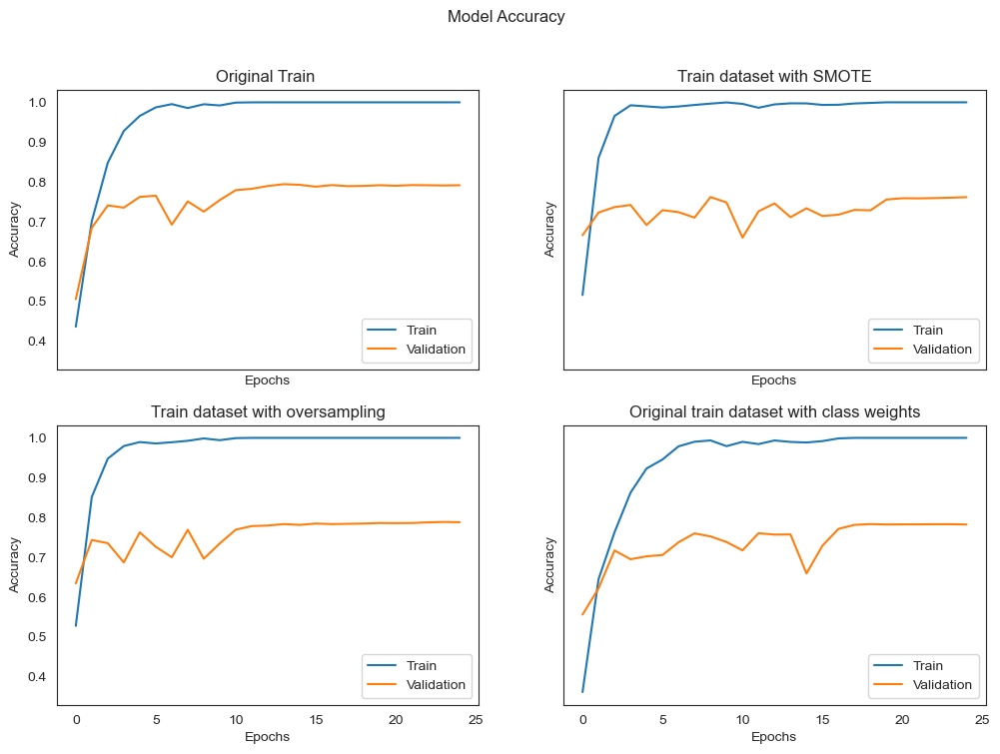

In [218]:
plot_model_accuracy_baseline(all_histories_b,training_configs_b)

## Model B Train & Validation Loss
- We can see that all __3 class imbalance methods__ tends to have a __higher validation loss__ compared to the original set
- Generally lead to poorer performance


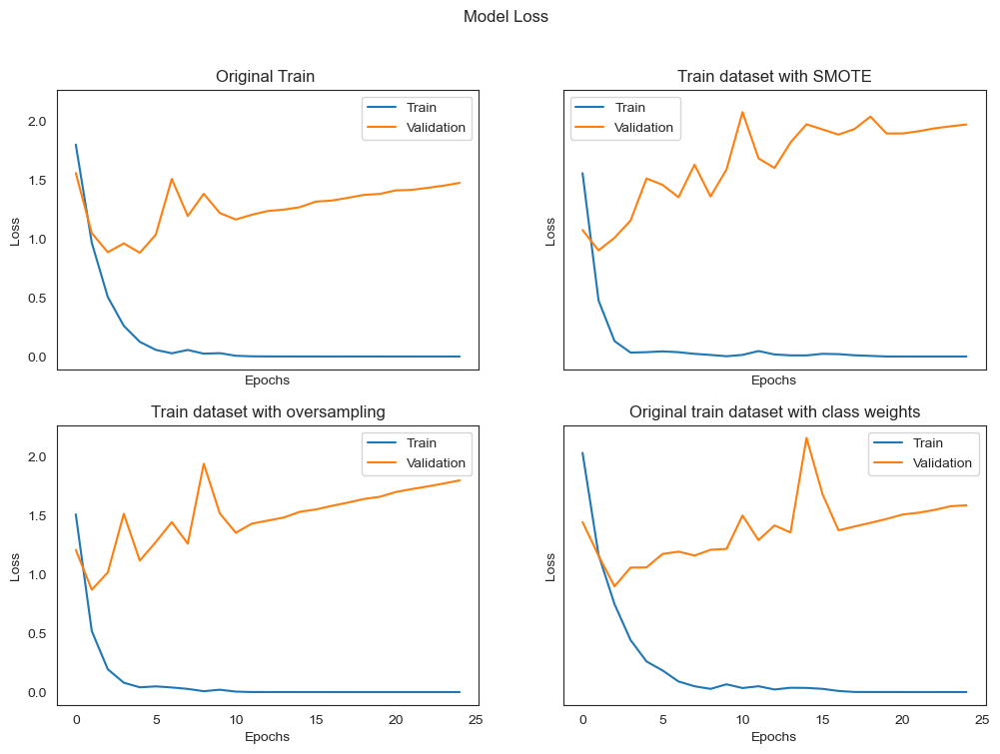

In [219]:
plot_model_loss_baseline(all_histories_b,training_configs_b)

## Evaluate Model B on Test set
- We can see that the __Simple CNN__ model performed not as bad even just on the __Original Train Set__, with __macro avg__ accuracies, f1-score, recall & precision scores of __0.78__

In [51]:


# Loading from checkpoint
model_base_b_orig= load_model("Models/model_base_b_original.h5")

94/94 [==============================] - 1s 6ms/step


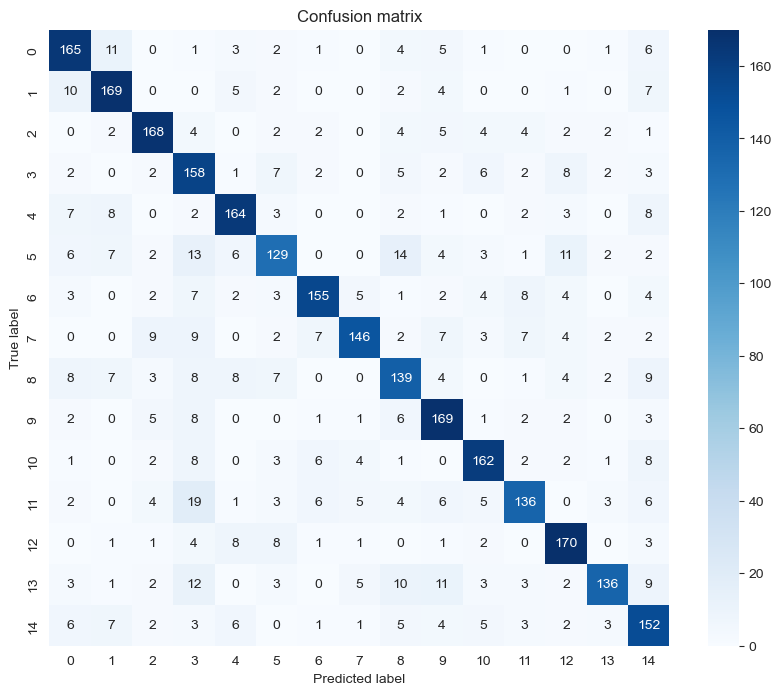

Classification Report
              precision    recall  f1-score   support

        Bean       0.77      0.82      0.80       200
Bitter_Gourd       0.79      0.84      0.82       200
Bottle_Gourd       0.83      0.84      0.84       200
     Brinjal       0.62      0.79      0.69       200
    Broccoli       0.80      0.82      0.81       200
     Cabbage       0.74      0.65      0.69       200
    Capsicum       0.85      0.78      0.81       200
      Carrot       0.87      0.73      0.79       200
 Cauliflower       0.70      0.69      0.70       200
    Cucumber       0.75      0.84      0.80       200
      Papaya       0.81      0.81      0.81       200
      Potato       0.80      0.68      0.73       200
     Pumpkin       0.79      0.85      0.82       200
      Radish       0.88      0.68      0.77       200
      Tomato       0.68      0.76      0.72       200

    accuracy                           0.77      3000
   macro avg       0.78      0.77      0.77      3000
weig

In [52]:
Confusion_Matrix_And_Report(model_base_b_orig,images_b_test,labels_b_test)

## Conclusions on Base CNN Model On Inputs A & B

### Improvements to be made
1. Add in __dropout__ layers / __Regularization__, which helps reduce __overfitting__ of the Model
2. More Layers could be added (Con2D , MaxPooling2D)
3. Try out different __Activation functions__, __optimizers__
4. Try out __Data Augmentation__ , as it provides more __training samples__ to the Model, which helps it __generalize better__ to unseen images/data
5. Use one of the methods to deal with __Class Imbalance__, __SMOTE, Oversampling, Class Weights__
<!-- - For the later parts, i would use __Class Weights__ as the main method to deal with __class imbalance__, as they __directly modify the loss function__ , by giving a penalty to the classes with __different weights__ -->

--- 

# Adding Drop-Out layers to CNN
- Added additional __Conv2D and MaxPooling__ layer for __Input size A__ to see if it improves model performance
- Added 2 additional __Conv2D and MaxPooling__ layers for __Input size B__
- initially i tried __dropout__ layers of 0.3 after each __Convolution and Max Pooling layers__ , except last dropout layer which was 0.2
- We would also evaluate the different methods to deal with __class imbalance__ 



Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 29, 29, 32)        320       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 14, 14, 32)       0         
 )                                                               
                                                                 
 dropout (Dropout)           (None, 14, 14, 32)        0         
                                                                 
 conv2d_1 (Conv2D)           (None, 12, 12, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 6, 6, 64)         0         
 2D)                                                             
                                                                 
 dropout_1 (Dropout)         (None, 6, 6, 64)          0

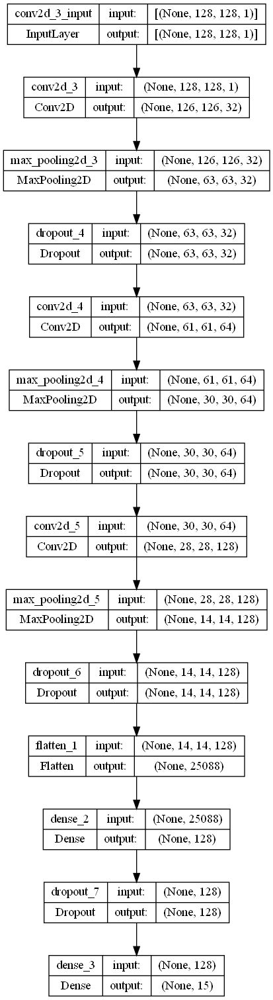

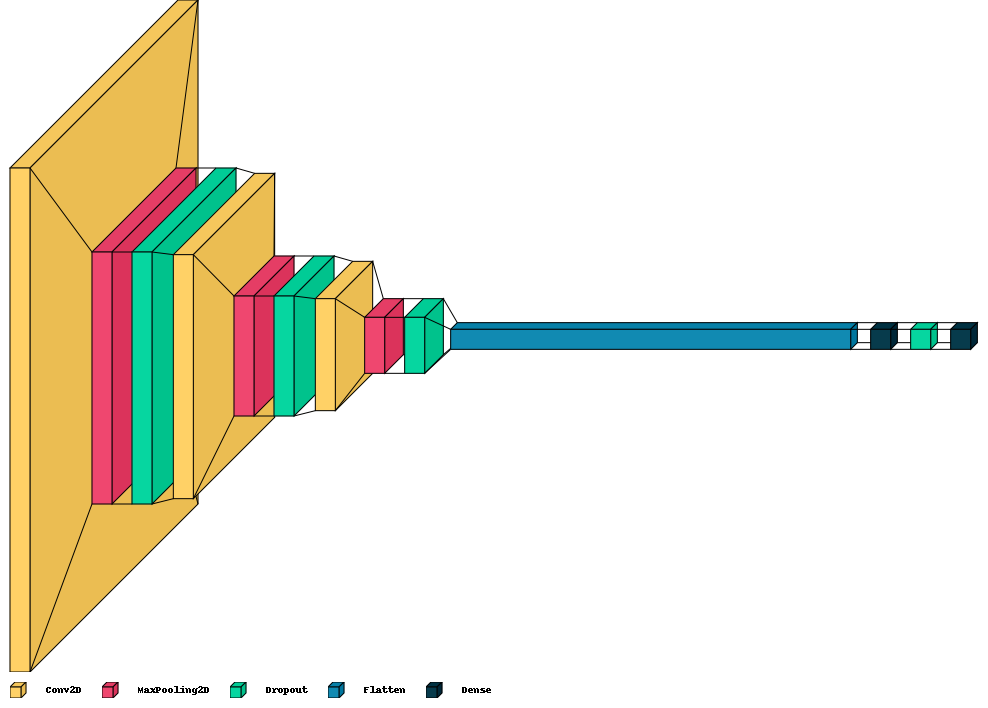

In [84]:
num_classes = 15
model_a = Sequential([
    
    Conv2D(32, kernel_size=(3, 3), activation="relu",
           input_shape=(31, 31, 1)),
    # BatchNormalization(),
    MaxPooling2D(pool_size=(2, 2)),
    Dropout(0.3),
    Conv2D(64, kernel_size=(3, 3), activation='relu'),
    # BatchNormalization(),
    MaxPooling2D(pool_size=(2, 2)),
    Dropout(0.3),
    Conv2D(128, kernel_size=(3, 3), activation='relu'),
    # BatchNormalization(),
    MaxPooling2D(pool_size=(2, 2)),
    Dropout(0.3),
    Flatten(),
    Dense(128, activation='relu'),
    Dropout(0.2),
    Dense(num_classes, activation="softmax")
])


model_b = Sequential([
    
    Conv2D(32, kernel_size=(3, 3), activation="relu",
           input_shape=(128, 128, 1)),
    # BatchNormalization(),
    MaxPooling2D(pool_size=(2, 2)),
    Dropout(0.3),
    Conv2D(64, kernel_size=(3, 3), activation='relu'),
    # BatchNormalization(),
    MaxPooling2D(pool_size=(2, 2)),
    Dropout(0.3),
    Conv2D(128, kernel_size=(3, 3), activation='relu'),
    # BatchNormalization(),
    MaxPooling2D(pool_size=(2, 2)),
    Dropout(0.3),
    Flatten(),
    Dense(128, activation='relu'),
    Dropout(0.2),
    Dense(num_classes, activation="softmax")
])
model_a.summary()
model_b.summary()

# Visualizing layers of Neural Network using plot_model
display(plot_model(model_b, show_shapes=True, show_layer_names=True))

# Using visualkeras

display(visualkeras.layered_view(model_b, spacing=20, legend=True))

In [72]:
# Initializing a new run
wandb.init(project="DELE_CA1_ModelA", entity='sugarwaffles-test')

# Compile the model
model_a.compile(optimizer='adam',
                     loss='categorical_crossentropy',
                     metrics=["accuracy", "AUC", "Precision", "Recall"])

# List to store history objects
all_histories = []

# List of training configurations
training_configs = [
    {"data": (images_a_train, labels_a_train),
     "name": "Original unbalanced train dataset"},
    {"data": (images_a_train_SMOTE, labels_a_train_SMOTE),
     "name": "Train dataset with SMOTE"},
    {"data": (images_a_train_resampled, labels_a_train_resampled),
     "name": "Train dataset with oversampling"},
    {"data": (images_a_train, labels_a_train),
     "name": "Original train dataset with class weights",
     "class_weight": class_weights_dict}
]

for config in training_configs:
    # Allows model_base_a weights to start from fresh again whenever a new iteration is being performed
    model_instance = clone_model(model_a)
    model_instance.compile(optimizer='adam',
                           loss='categorical_crossentropy',
                           metrics=["accuracy", "AUC", "Precision", "Recall"])

    data, data_name = config["data"], config["name"]
    print(f"Training model for: {data_name}")

    class_weight = config.get("class_weight", None)
    
    # Define a ModelCheckpoint callback for the original unbalanced train dataset

    history = model_instance.fit(*data,
                                 validation_data=(images_a_val, labels_a_val),
                                 validation_split=0.5,
                                 epochs=25,
                                 verbose=0, batch_size=32,
                                 class_weight=class_weight,
                                 callbacks=[WandbMetricsLogger()])

    all_histories.append(history)

    # Clear GPU memory
    clear_session()

wandb.finish()

Training model for: Original unbalanced train dataset
Training model for: Train dataset with SMOTE
Training model for: Train dataset with oversampling
Training model for: Original train dataset with class weights


epoch/accuracy,▁▄▅▆▇▇▇▇▇█▁▅▆▇▇█████▁▅▆▇▇█████▂▄▅▆▆▇▇▇▇▇
epoch/auc,▁▅▇▇██████▁▆▇███████▂▇▇███████▄▆▇▇▇█████
epoch/epoch,▁▂▂▃▄▅▅▆▇▇▁▂▂▃▄▅▅▆▇█▁▂▂▃▄▅▆▆▇█▁▂▃▃▄▅▆▆▇█
epoch/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/loss,█▅▄▃▃▂▂▂▂▁█▄▃▂▂▁▁▁▁▁█▄▃▂▂▂▁▁▁▁▇▅▄▃▃▂▂▂▂▁
epoch/precision,▁▅▆▇▇▇▇███▂▆▇▇▇█████▄▆▇▇██████▃▅▆▆▇▇▇▇▇█
epoch/recall,▁▃▅▅▆▇▇▇▇▇▁▄▆▇▇▇████▁▅▆▇▇▇████▁▃▅▅▆▆▇▇▇▇
epoch/val_accuracy,▁▄▆▆▇▇▇███▂▅▇▇▇█████▃▆▇▇▇▇████▃▄▆▇▇▇████
epoch/val_auc,▁▆▇▇██████▄▇████████▄▇████████▅▆▇▇██████
epoch/val_loss,█▅▃▃▂▂▂▁▁▁▇▄▂▂▂▁▁▁▁▁▆▃▂▂▂▂▁▁▁▁▆▅▃▃▂▂▁▁▁▁
epoch/val_precision,▁▇▇▇██▇███▆▇████████▇▇████████▅▆▇▇██████


In [75]:
# Define the checkpoint callback

model_checkpoint_callback_dropout_a= ModelCheckpoint(
    filepath='Models/model_checkpoint_a_dropout.h5',
    save_best_only=True)

model_checkpoint_callback_dropout_a_cw = ModelCheckpoint(
    filepath='Models/model_checkpoint_a_dropout_cw.h5',
    save_best_only=True)

# model_checkpoint_callback_aug_dropout_a = ModelCheckpoint(
#     filepath='Models/model_checkpoint_aug_a_dropout.h5',
#     save_best_only=True)
model_a_orig = clone_model(model_a)
model_a_orig_cw = clone_model(model_a)

model_a_orig.compile(loss="categorical_crossentropy",
                optimizer="adam", metrics=["accuracy", "AUC", "Precision", "Recall"])

model_a_orig_cw.compile(loss="categorical_crossentropy",
                optimizer="adam", metrics=["accuracy", "AUC", "Precision", "Recall"])

wandb.init(project='DELE_CA1_modelA',entity='sugarwaffles-test')

# Original train dataset without class weights
history_dropout_orig_a = model_a_orig.fit(images_a_train,labels_a_train,
                              validation_data=(images_a_val,labels_a_val),
                              validation_split = 0.5,
                              epochs=25,
                              verbose=0,batch_size = 32 ,callbacks=[WandbMetricsLogger(),model_checkpoint_callback_dropout_a])


# wandb.init(project='DELE_CA1_modelA',entity='sugarwaffles-test')

# # Original train dataset with class weights
# history_dropout_orig_a_cw = model_a_orig_cw.fit(images_a_train,labels_a_train,
#                               validation_data=(images_a_val,labels_a_val),
#                               validation_split = 0.5,
#                               epochs=25,
#                               verbose=0,batch_size = 32 ,class_weight = class_weights_dict,callbacks=[WandbMetricsLogger(),model_checkpoint_callback_dropout_a_cw])

# wandb.finish()

## Looking at Train & Validation Accuracy
- Compared to our earlier __Simple CNN model__, we now see __less over-fitting__ of the __new model__, with relatively close __train & val__ accuracies of about __0.85 - 0.9__
- However, we can see that in all training configs, __validation accuracy__ seems to be __higher__ than the __train accuracy__ at least when Model is trained on __Original train set__ & __Original train set + class weights__, which could have resulted from the __Dropout layers__
- For the __SMOTE and Over-sampled__ train sets, both __val and train acc__ seem to '__converge__' right about __20 epochs__

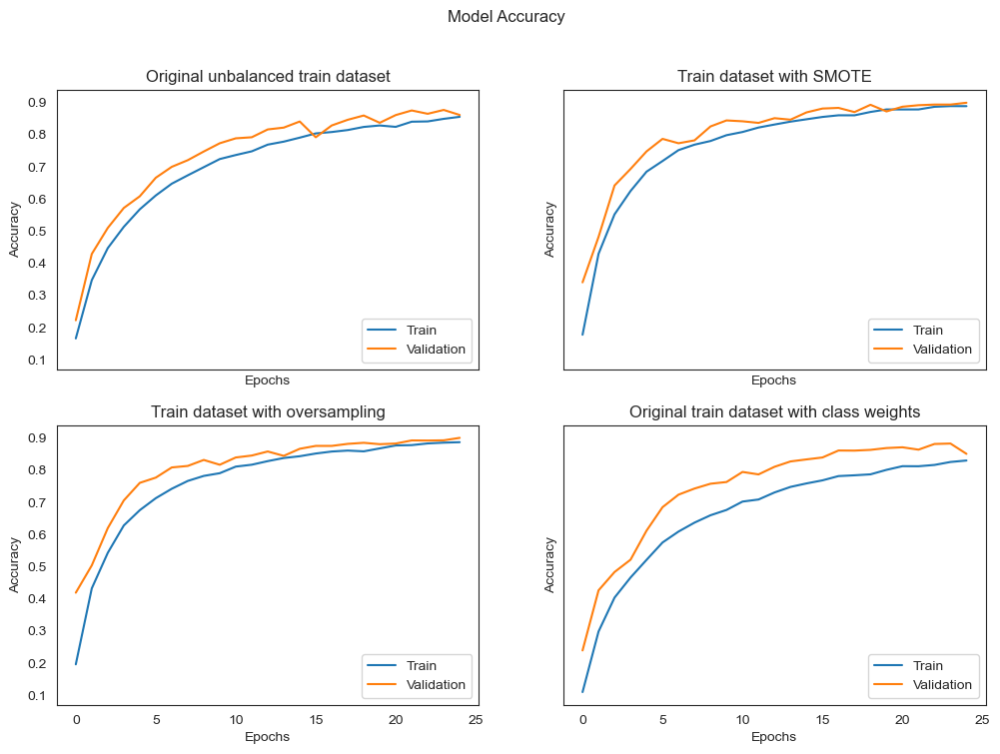

In [73]:
plot_model_accuracy_baseline(all_histories,training_configs)

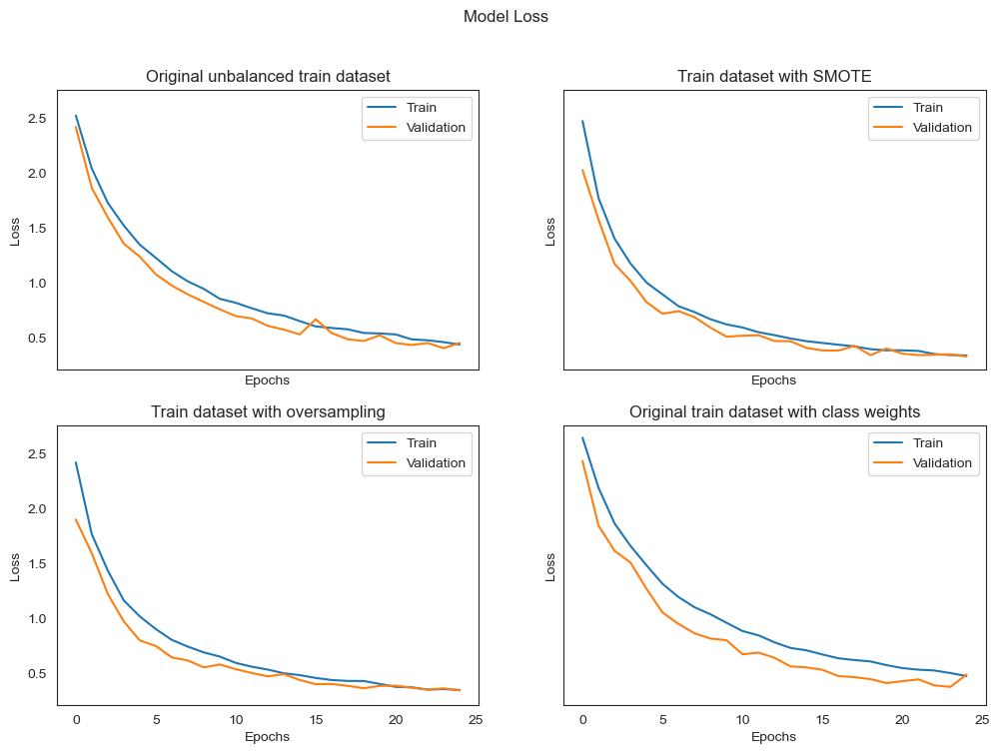

In [76]:
plot_model_loss_baseline(all_histories,training_configs)


## Evaluating Improved Model on Original Train set
- The new Model is able to achieve a __test accuracy__ of about __0.8850__, and loss of __0.3960__, which is about a __6%__ increase in __accuracy__ compared to our __baseline CNN model__


In [104]:
model_a = load_model('Models/model_checkpoint_a_dropout.h5')
#model_a_cw = load_model('Models/model_checkpoint_a_dropout_cw.h5')

In [105]:
model_a.evaluate(images_a_test,labels_a_test,batch_size=32)
#model_a_cw.evaluate(images_a_test,labels_a_test,batch_size=32)

94/94 [==============================] - 1s 5ms/step - loss: 0.3960 - accuracy: 0.8850 - auc: 0.9930 - precision: 0.9304 - recall: 0.8293


[0.39604830741882324,
 0.8849999904632568,
 0.9930234551429749,
 0.9304412603378296,
 0.8293333053588867]

94/94 [==============================] - 0s 2ms/step


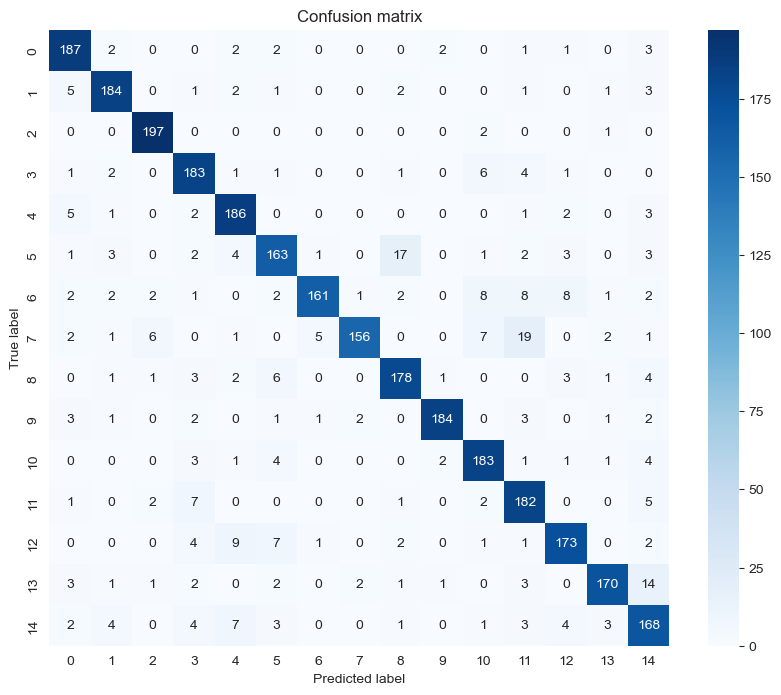

Classification Report
              precision    recall  f1-score   support

        Bean       0.88      0.94      0.91       200
Bitter_Gourd       0.91      0.92      0.92       200
Bottle_Gourd       0.94      0.98      0.96       200
     Brinjal       0.86      0.92      0.88       200
    Broccoli       0.87      0.93      0.90       200
     Cabbage       0.85      0.81      0.83       200
    Capsicum       0.95      0.81      0.87       200
      Carrot       0.97      0.78      0.86       200
 Cauliflower       0.87      0.89      0.88       200
    Cucumber       0.97      0.92      0.94       200
      Papaya       0.87      0.92      0.89       200
      Potato       0.79      0.91      0.85       200
     Pumpkin       0.88      0.86      0.87       200
      Radish       0.94      0.85      0.89       200
      Tomato       0.79      0.84      0.81       200

    accuracy                           0.89      3000
   macro avg       0.89      0.88      0.88      3000
weig

In [18]:
Confusion_Matrix_And_Report(model_a,images_a_test,labels_a_test)

## Train Model (128 by 128 input size)

_here i had to train the 4 configs separately (2 by 2) as i kept into DST Tensor error or smt_

In [65]:
# Define the checkpoint callback

model_checkpoint_callback_dropout_b= ModelCheckpoint(
    filepath='Models/model_checkpoint_b_dropout.h5',
    save_best_only=True)

model_checkpoint_callback_dropout_b_cw = ModelCheckpoint(
    filepath='Models/model_checkpoint_b_dropout_cw.h5',
    save_best_only=True)

# model_checkpoint_callback_aug_dropout_a = ModelCheckpoint(
#     filepath='Models/model_checkpoint_aug_a_dropout.h5',
#     save_best_only=True)
model_b_orig = clone_model(model_b)
model_b_orig_cw = clone_model(model_b)

model_b_orig.compile(loss="categorical_crossentropy",
                optimizer="adam", metrics=["accuracy", "AUC", "Precision", "Recall"])

model_b_orig_cw.compile(loss="categorical_crossentropy",
                optimizer="adam", metrics=["accuracy", "AUC", "Precision", "Recall"])

wandb.init(project='CA1',entity='sugarwaffles-test')

# Original train dataset without class weights
history_dropout_orig_b = model_b_orig.fit(images_b_train,labels_b_train,
                              validation_data=(images_b_val,labels_b_val),
                              validation_split = 0.5,
                              epochs=25,
                              verbose=0,batch_size = 32 ,callbacks=[WandbMetricsLogger(),model_checkpoint_callback_dropout_b])


wandb.init(project='CA1',entity='sugarwaffles-test')

# Original train dataset with class weights
history_dropout_orig_b_cw = model_b_orig_cw.fit(images_b_train,labels_b_train,
                              validation_data=(images_b_val,labels_b_val),
                              validation_split = 0.5,
                              epochs=25,
                              verbose=0,batch_size = 32 ,class_weight = class_weights_dict,callbacks=[WandbMetricsLogger(),model_checkpoint_callback_dropout_b_cw])

clear_session()
gc.collect()

wandb.finish()



epoch/accuracy,▁▄▅▆▇▇▇██████████████████
epoch/auc,▁▆▇██████████████████████
epoch/epoch,▁▁▂▂▂▂▃▃▃▄▄▄▅▅▅▅▆▆▆▇▇▇▇██
epoch/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/loss,█▅▄▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/precision,▁▃▅▆▆▇▇▇▇████████████████
epoch/recall,▁▃▅▆▇▇▇██████████████████
epoch/val_accuracy,▁▄▆▆▇▇▇▇▇█▇██████▇██▇████
epoch/val_auc,▁▆▇▇█▇███████████▇███████
epoch/val_loss,█▅▄▃▂▂▂▂▂▂▂▁▁▁▁▁▂▂▁▁▂▁▁▁▁
epoch/val_precision,▁▄▅▆▆▆▇▇▆▇▇██▇█▇▇▆█▇▇██▇█


epoch/accuracy,▁▃▄▅▆▆▇▇▇▇███████████████
epoch/auc,▁▅▆▇█████████████████████
epoch/epoch,▁▁▂▂▂▂▃▃▃▄▄▄▅▅▅▅▆▆▆▇▇▇▇██
epoch/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/loss,█▇▅▄▃▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/precision,▁▅▆▆▇▇▇▇▇████████████████
epoch/recall,▁▁▃▄▅▆▇▇▇▇███████████████
epoch/val_accuracy,▁▄▅▆▇▇▇▇▇███▇████████████
epoch/val_auc,▁▆▇▇████████▇████████████
epoch/val_loss,█▆▅▃▂▂▂▂▂▁▁▁▃▁▁▂▁▁▁▁▁▁▁▁▁
epoch/val_precision,▁▇▆████▇▇███▇████████████


In [92]:
# Initializing a new run
wandb.init(project="CA1")

# List to store history objects
all_histories_b_improved= []

#Append the original history model b first
all_histories_b_improved.append(history_dropout_orig_b)

# List of training configurations
training_configs_b_improved = [
    {"data": (images_b_train_SMOTE, labels_b_train_SMOTE), "name": "Train dataset with SMOTE"},
    {"data": (images_b_train_resampled, labels_b_train_resampled), "name": "Train dataset with oversampling"},
]

for config in training_configs_b_improved:
    model_instance_b = clone_model(model_b)
    model_instance_b.compile(optimizer='adam',
                             loss='categorical_crossentropy',
                             metrics=["accuracy", "AUC", "Precision", "Recall"])

    data, data_name = config["data"], config["name"]
    print(f"Training model_b for: {data_name}")

    class_weight = config.get("class_weight", None)
    

    history_b = model_instance_b.fit(*data,
                                     validation_data=(images_b_val, labels_b_val),
                                     validation_split=0.5,
                                     epochs=25,
                                     verbose=0, batch_size=32,
                                     callbacks=[WandbMetricsLogger()])

    
    all_histories_b_improved.append(history_b)
    
    # Clear GPU memory
    tf.keras.backend.clear_session()
    gc.collect()

wandb.finish()

all_histories_b_improved.append(history_dropout_orig_b_cw)


Training model_b for: Train dataset with SMOTE
Training model_b for: Train dataset with oversampling


epoch/accuracy,▂▆▆▇▇███████████████▁▄▆▆▇▇▇▇████████████
epoch/auc,▄▇██████████████████▁▆▇█████████████████
epoch/epoch,▁▁▂▂▂▃▃▃▄▄▅▅▅▆▆▆▇▇▇█▁▁▂▂▂▃▃▃▄▄▅▅▅▆▆▆▇▇▇█
epoch/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/loss,▇▄▃▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█▅▃▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁
epoch/precision,▂▅▆▆▇▇▇▇████████████▁▄▅▆▆▇▇▇▇▇▇▇████████
epoch/recall,▂▅▆▇▇███████████████▁▄▅▆▇▇▇▇████████████
epoch/val_accuracy,▃▅▇▆▇▇▇█████████████▁▄▄▆▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇
epoch/val_auc,▄▇█▇█▇███▇██▇▇▇█▇▇▇█▁▆▅▇▇█▇▇▇▇▇▇▇▇▇▇▇▇▆▇
epoch/val_loss,▅▃▂▂▁▂▁▁▁▂▁▁▁▁▂▁▂▂▂▁█▄▄▂▂▂▂▂▂▂▂▂▂▂▂▂▃▂▃▂
epoch/val_precision,▁▅▇▅▇▆▆▇█▇███▇▇█▆▆██▆▅▁▆▅▆▅▅▆▆▆▅▆▆▆▅▅▆▅▆


## Looking at Train & Validation Accuracy
- Compared to our earlier __Simple CNN model__, we now see __less over-fitting__ of the __new model__, but it is still __prevalent__, which we need to address
- Both __SMOTE__ & __Oversampling__ yield quite similar results (quite constant val and train acc after 5 epochs), while __class-weights__ seems to have more __fluctuations__ in __val accuracy__ in the initial __15 epochs__
- Using __class weights__ seem to lead to __fluctuations__ in __validation accuracy__, while both __SMOTE &  oversampling__ was more "stable"

In [94]:
training_configs_b = [
    {"data": (images_b_train, labels_b_train), "name": "Original Train "},
    {"data": (images_b_train_SMOTE, labels_b_train_SMOTE), "name": "Train dataset with SMOTE"},
    {"data": (images_b_train_resampled, labels_b_train_resampled), "name": "Train dataset with oversampling"},
    {"data": (images_b_train, labels_b_train), "name": "Original train dataset with class weights", "class_weight": class_weights_dict}
]

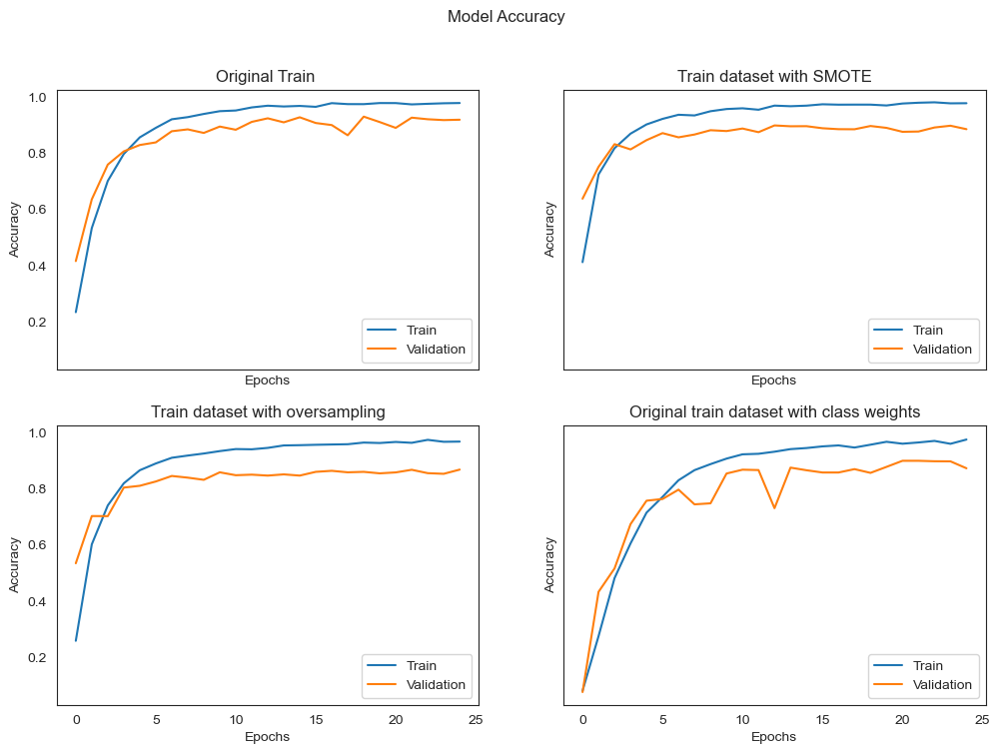

In [95]:
plot_model_accuracy_baseline(all_histories_b_improved,training_configs_b)

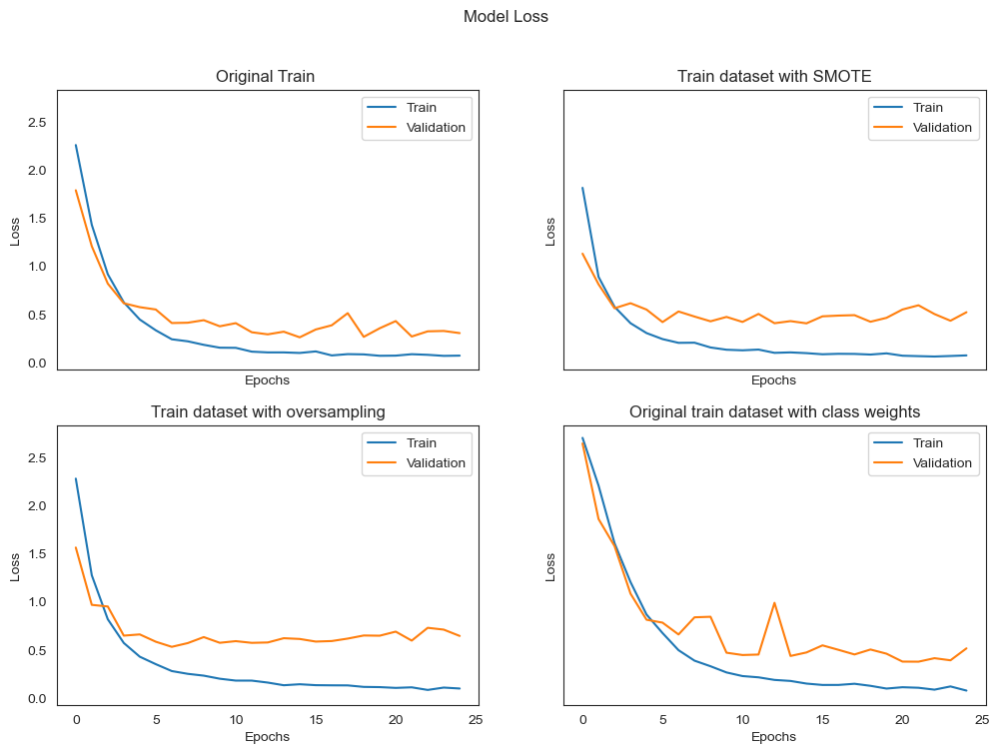

In [97]:
plot_model_loss_baseline(all_histories_b_improved,training_configs_b)

## Evaluate Improved Model on Test set
- The new Model is able to achieve a __test accuracy__ of about __0.9270__, and loss of __0.2611__, which is about a __15%__ increase in __accuracy__ compared to our __baseline CNN model__
- We can look at the __confusion matrix__ of the Model predictions on the __Test set__, and we indeed seem most predictions being correct which is a good sign

In [239]:
model_b = load_model('Models/model_checkpoint_b_dropout.h5')
model_b_cw = load_model('Models/model_checkpoint_b_dropout_cw.h5')

In [240]:
model_b.evaluate(images_b_test,labels_b_test,batch_size=32)
model_b_cw.evaluate(images_b_test,labels_b_test,batch_size=32)

94/94 [==============================] - 6s 61ms/step - loss: 0.3774 - accuracy: 0.8987 - auc: 0.9886 - precision: 0.9247 - recall: 0.8763


[0.37735846638679504,
 0.8986666798591614,
 0.9886230826377869,
 0.9247273802757263,
 0.8763333559036255]

94/94 [==============================] - 1s 5ms/step


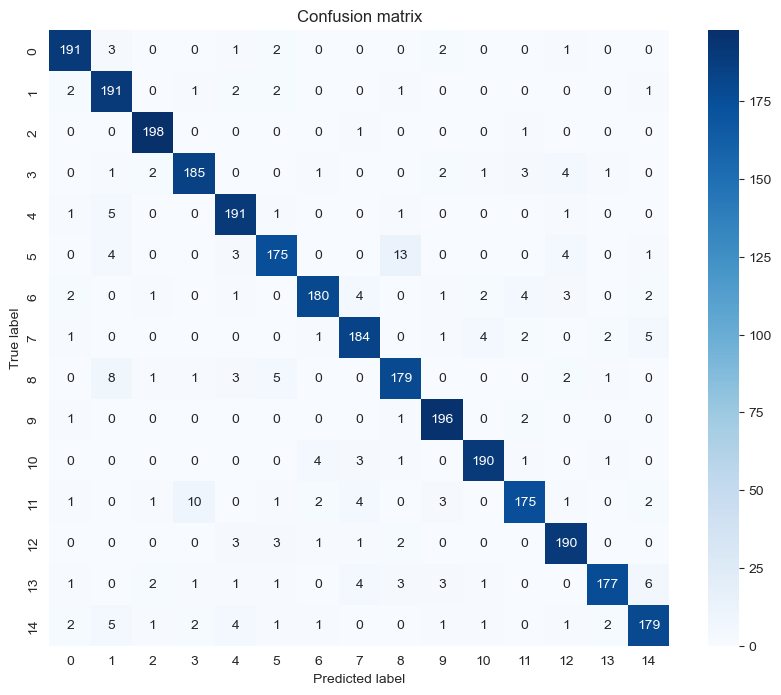

Classification Report
              precision    recall  f1-score   support

        Bean       0.95      0.95      0.95       200
Bitter_Gourd       0.88      0.95      0.92       200
Bottle_Gourd       0.96      0.99      0.98       200
     Brinjal       0.93      0.93      0.93       200
    Broccoli       0.91      0.95      0.93       200
     Cabbage       0.92      0.88      0.90       200
    Capsicum       0.95      0.90      0.92       200
      Carrot       0.92      0.92      0.92       200
 Cauliflower       0.89      0.90      0.89       200
    Cucumber       0.94      0.98      0.96       200
      Papaya       0.95      0.95      0.95       200
      Potato       0.93      0.88      0.90       200
     Pumpkin       0.92      0.95      0.93       200
      Radish       0.96      0.89      0.92       200
      Tomato       0.91      0.90      0.90       200

    accuracy                           0.93      3000
   macro avg       0.93      0.93      0.93      3000
weig

In [21]:
Confusion_Matrix_And_Report(model_b,images_b_test,labels_b_test)

94/94 [==============================] - 1s 5ms/step


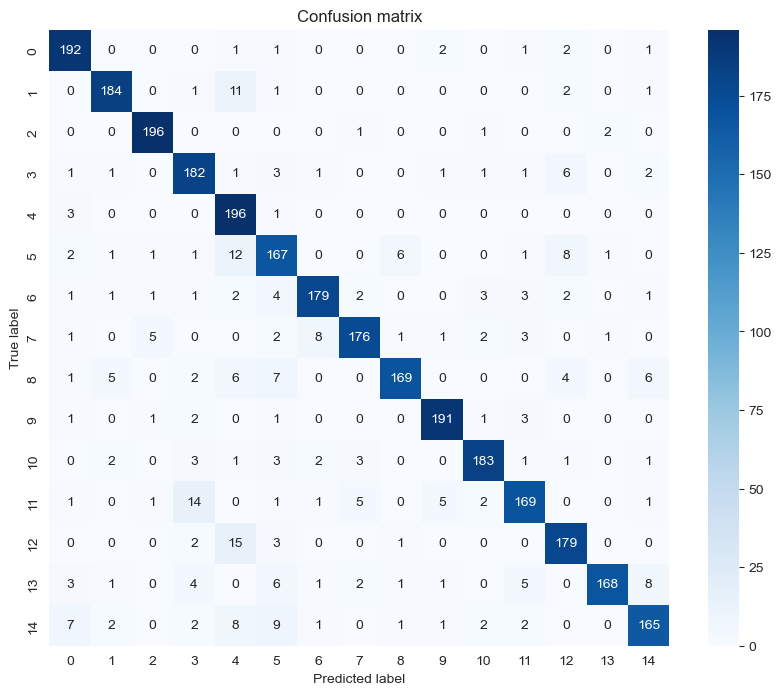

Classification Report
              precision    recall  f1-score   support

        Bean       0.90      0.96      0.93       200
Bitter_Gourd       0.93      0.92      0.93       200
Bottle_Gourd       0.96      0.98      0.97       200
     Brinjal       0.85      0.91      0.88       200
    Broccoli       0.77      0.98      0.87       200
     Cabbage       0.80      0.83      0.82       200
    Capsicum       0.93      0.90      0.91       200
      Carrot       0.93      0.88      0.90       200
 Cauliflower       0.94      0.84      0.89       200
    Cucumber       0.95      0.95      0.95       200
      Papaya       0.94      0.92      0.93       200
      Potato       0.89      0.84      0.87       200
     Pumpkin       0.88      0.90      0.89       200
      Radish       0.98      0.84      0.90       200
      Tomato       0.89      0.82      0.85       200

    accuracy                           0.90      3000
   macro avg       0.90      0.90      0.90      3000
weig

In [22]:
Confusion_Matrix_And_Report(model_b_cw,images_b_test,labels_b_test)

## Looking at Misclassified Images


94/94 [==============================] - 9s 95ms/step


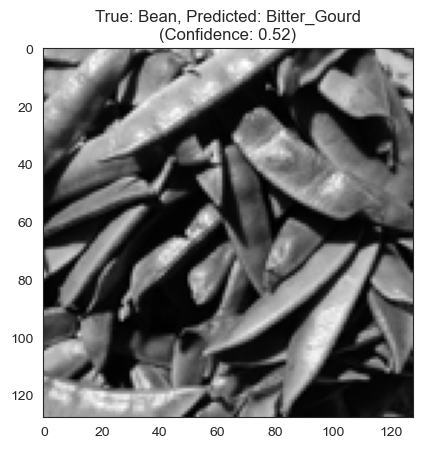

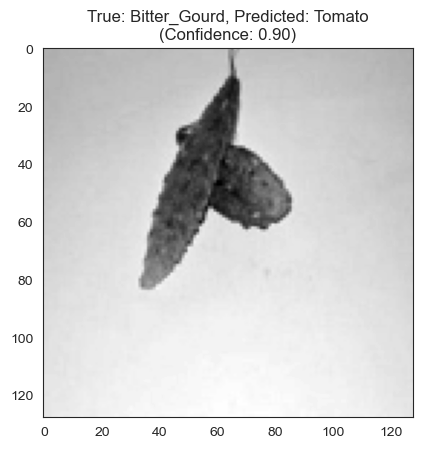

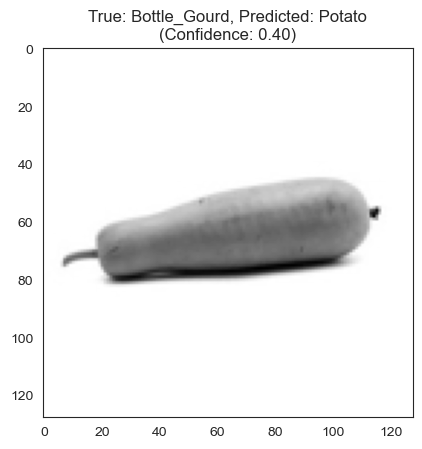

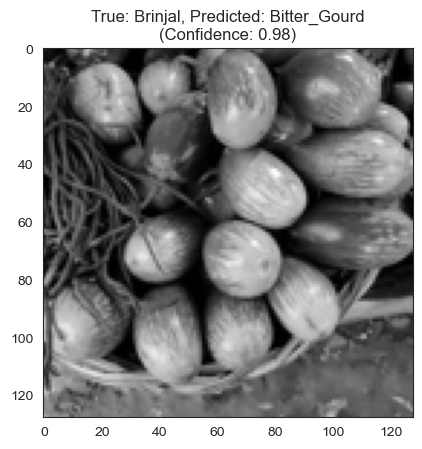

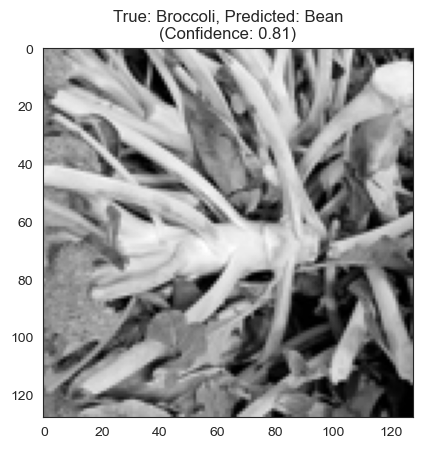

...

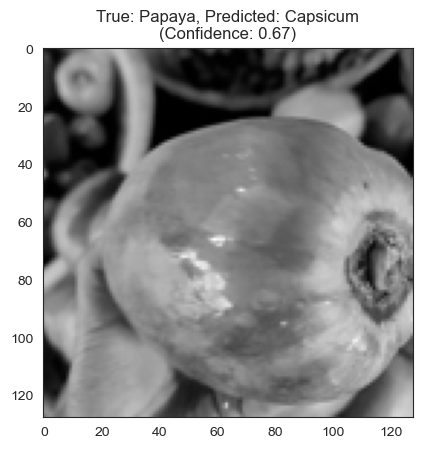

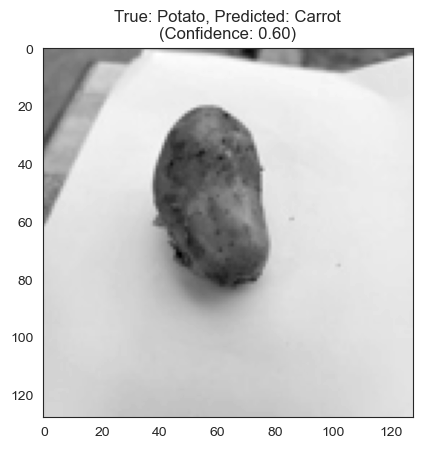

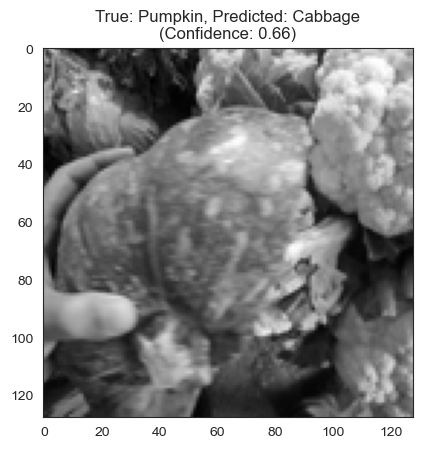

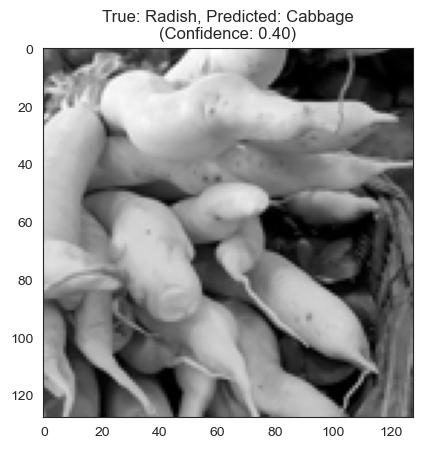

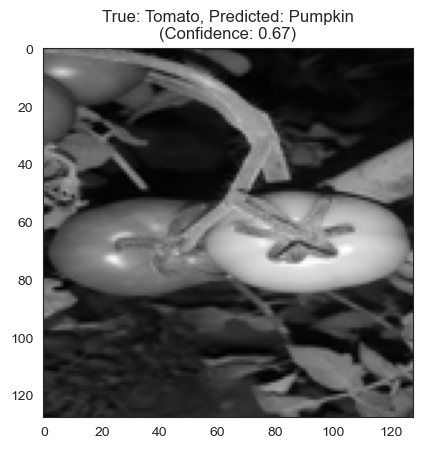

In [245]:
visualize_misclassifications(model_b,images_b_test,labels_b_test)

## Conclusions On Improved Model for Inputs A & B
- Overall, just by adding __Dropout__ layers in between each __Conv2D and MaxPooling2D__ layers, and an additional pair of __Conv2D and Maxpooling2D__, we were able to see quite a huge __improvement__, at least for the Model performance on the __Images with input size 31 by 31__, as the __overfitting__ was reduced quite alot
- Regarding our Model with input size __128 by 128__, we also saw improvements in terms of __overfitting__, but that is not to say that __both models__ cannot be improved
- We could try fitting the Models on train set with __Data Augmentation__, and use __different activation functions__


# Comparing Activation Functions and Optimizers

- Interested in trying out the **Leaky Relu** activation function
- Trying __Adam vs SGD__ to see which works best
- We would use the __Over-sampled__ train set for this

## Model A 

In [ ]:
from keras.layers import LeakyReLU




def get_model_a(act_function):

    if act_function == 'LeakyReLU':
        act_function = LeakyReLU(0.05)

    model = Sequential()
    model.add(Conv2D(32, input_shape=(31, 31, 1), kernel_size=(3, 3)))
    # model.add(BatchNormalization())
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(0.4))
    model.add(Conv2D(64, kernel_size=(3, 3), activation=act_function))
    # model.add(BatchNormalization())
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(0.4))
    model.add(Conv2D(128, kernel_size=(3, 3), activation=act_function))
    # model.add(BatchNormalization())
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(0.4))
    model.add(Flatten())
    model.add(Dense(128, activation=act_function))
    model.add(Dropout(0.2))
    model.add(Dense(num_classes, activation="softmax"))

    return model

In [ ]:
import gc  # apparently solves a memory error when trying to use LeakyReLU


activations = ['LeakyReLU', 'relu']
optimizers = ['adam', 'SGD']
activation_results = {}
for funct in activations:
    for optimizer in optimizers:

        wandb.init(project="CNN_Vegetables")
        model = get_model_a(funct)
        model.compile(loss="categorical_crossentropy",
                      optimizer=optimizer, metrics=['accuracy','Precision','Recall','AUC'])
        history = model.fit(images_a_train_resampled, labels_a_train_resampled, validation_data=(
            images_a_val, labels_a_val), epochs=30, verbose=0, batch_size=32, callbacks=[WandbMetricsLogger()])
        activation_results[(funct, optimizer)] = history
        gc.collect()
        # plt.figure()
        # plt.plot(history.history['accuracy'])
        # plt.plot(history.history['val_accuracy'])

epoch/accuracy,▁▄▅▆▆▆▇▇▇▇▇▇▇█████████████████
epoch/auc,▁▆▇▇▇█████████████████████████
epoch/epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
epoch/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/loss,█▅▄▃▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/precision,▁▄▅▆▆▇▇▇▇▇▇▇▇█▇███████████████
epoch/recall,▁▃▄▅▆▆▇▇▇▇▇▇▇█████████████████
epoch/val_accuracy,▁▄▅▅▆▆▇▇▇▇▇▇▇████▇█▇██████████
epoch/val_auc,▁▅▆▇▇▇████████████████████████
epoch/val_loss,█▅▄▄▃▃▂▂▂▂▂▂▂▁▁▁▁▂▁▂▁▁▁▁▁▁▁▁▁▁
epoch/val_precision,▁▃▃▄▆▅▆▇▆▆▇▆▆▇▇█▇▆▇▆▇█▇███████


epoch/accuracy,▁▁▂▂▂▃▃▃▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇████
epoch/auc,▁▂▂▃▄▄▅▅▅▆▆▆▆▇▇▇▇▇▇▇▇▇████████
epoch/epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
epoch/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/loss,████▇▇▇▆▆▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▂▂▁▁▁▁
epoch/precision,▁▁▁▁▁▄▄▅▅▆▆▇▇▇▇▇▇▇▇▇██████████
epoch/recall,▁▁▁▁▁▁▁▁▁▁▂▂▂▂▃▃▄▄▄▅▅▅▆▆▆▇▇▇██
epoch/val_accuracy,▁▂▂▂▃▃▃▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇██
epoch/val_auc,▁▂▄▄▄▅▅▅▆▆▆▆▆▇▇▇▇▇▇▇▇▇████████
epoch/val_loss,███▇▇▇▆▆▆▅▅▅▅▄▄▄▃▃▃▃▃▃▂▂▂▂▂▂▁▁
epoch/val_precision,▁▁▁▁▁▁▁█▆▆▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇


epoch/accuracy,▁▄▅▆▆▆▇▇▇▇▇▇▇▇████████████████
epoch/auc,▁▅▇▇▇▇████████████████████████
epoch/epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
epoch/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/loss,█▅▄▄▃▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/precision,▁▄▅▆▆▇▇▇▇▇▇▇▇▇▇███████████████
epoch/recall,▁▃▄▅▆▆▆▇▇▇▇▇▇▇▇███████████████
epoch/val_accuracy,▁▄▅▅▆▇▇▇▇▇▇▇▇█████████████████
epoch/val_auc,▁▅▆▇▇▇▇███████████████████████
epoch/val_loss,█▅▄▄▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_precision,▁▂▄▅▆▆▆▇█▇▇▇▇█▇▇█▇███▇█████▇▇█


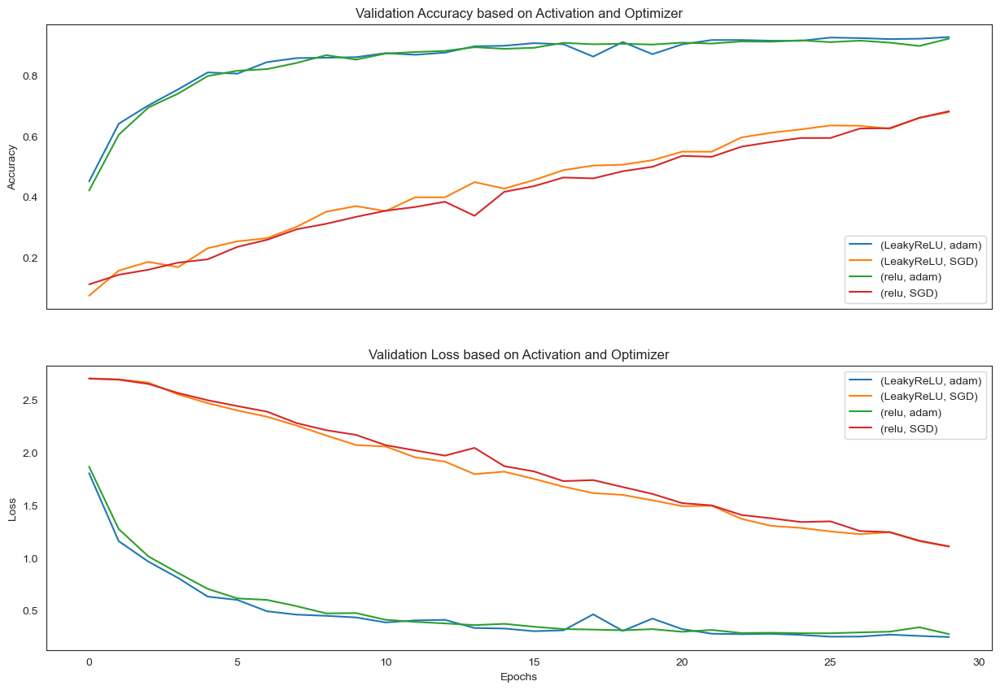

In [ ]:
val_loss_per_function = {k: v.history['val_loss']
                         for k, v in activation_results.items()}
val_acc_per_function = {k: v.history['val_accuracy']
                        for k, v in activation_results.items()}

val_loss_curves = pd.DataFrame(val_loss_per_function)
val_acc_curves = pd.DataFrame(val_acc_per_function)

fig, (ax1, ax2) = plt.subplots(2, ncols=1,
                               figsize=(15, 10), sharex=True, squeeze=True)

# Plot the accuracy curves
val_acc_curves.plot(ax=ax1)
ax1.set_title('Validation Accuracy based on Activation and Optimizer')
ax1.set_ylabel('Accuracy')
ax1.legend(loc='lower right')

# Plot the loss curves
val_loss_curves.plot(ax=ax2)
ax2.set_title('Validation Loss based on Activation and Optimizer')
ax2.set_xlabel('Epochs')
ax2.set_ylabel('Loss')
ax2.legend(loc='upper right')


plt.show()

## Model B

In [ ]:
from keras.layers import LeakyReLU

np.random.seed(1)


def get_model(act_function):

    if act_function == 'LeakyReLU':
        act_function = LeakyReLU(0.05)

    model = Sequential()
    model.add(Conv2D(32, input_shape=(128, 128, 1), kernel_size=(3, 3)))
    # model.add(BatchNormalization())
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(0.4))
    model.add(Conv2D(64, kernel_size=(3, 3), activation=act_function))
    # model.add(BatchNormalization())
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(0.4))
    model.add(Conv2D(128, kernel_size=(3, 3), activation=act_function))
    # model.add(BatchNormalization())
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(0.4))
    model.add(Conv2D(256, kernel_size=(3, 3), activation=act_function))
    # model.add(BatchNormalization())
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(0.4))
    model.add(Flatten())
    model.add(Dense(256, activation=act_function))
    model.add(Dropout(0.2))
    model.add(Dense(num_classes, activation="softmax"))

    return model

In [ ]:
import gc  # apparently solves a memory error when trying to use LeakyReLU


activations = ['LeakyReLU', 'relu']
optimizers = ['adam', 'SGD']
activation_results = {}
for funct in activations:
    for optimizer in optimizers:

        wandb.init(project="CNN_Vegetables")
        model = get_model(funct)
        model.compile(loss="categorical_crossentropy",
                      optimizer=optimizer, metrics=['accuracy','Precision','Recall','AUC'])
        history = model.fit(images_b_train_resampled, labels_b_train_resampled, validation_data=(
            images_b_val, labels_b_val), epochs=30, verbose=0, batch_size=32, callbacks=[WandbMetricsLogger()])
        activation_results[(funct, optimizer)] = history
        gc.collect()
        # plt.figure()
        # plt.plot(history.history['accuracy'])
        # plt.plot(history.history['val_accuracy'])

epoch/accuracy,▁▅▇▇██████████████████████████
epoch/auc,▁▇████████████████████████████
epoch/epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
epoch/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/loss,█▄▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/precision,▁▄▆▇▇▇▇███████████████████████
epoch/recall,▁▅▇▇██████████████████████████
epoch/val_accuracy,▁▆▆█▇▇▇▇█▇██████▇█████████████
epoch/val_auc,▁▇▇████▇██▇▇▇█▇█▇▇▇▇▇▇▇▇▆▇▇▇▇▇
epoch/val_loss,█▃▃▁▁▁▁▁▁▁▂▂▁▁▂▁▂▁▁▂▁▁▁▁▂▂▂▂▁▂
epoch/val_precision,▁▆▅█▇▇▇▇█▇▇▇██▇█▆██▇████▇▇▇▇██


epoch/accuracy,▁▂▂▃▃▄▄▅▅▆▆▆▆▇▇▇▇▇▇▇██████████
epoch/auc,▁▃▄▅▅▆▆▇▇▇▇███████████████████
epoch/epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
epoch/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/loss,██▇▇▆▆▅▄▄▄▃▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁
epoch/precision,▁▄▄▅▆▆▆▆▇▇▇▇▇▇▇▇██████████████
epoch/recall,▁▁▁▁▂▂▃▄▄▅▅▆▆▆▇▇▇▇▇▇▇█████████
epoch/val_accuracy,▁▁▃▃▃▃▂▅▅▄▅▆▆▆▇▇▇▇▇▇▇█████████
epoch/val_auc,▁▂▄▄▅▅▄▇▇▆▆▇▇▇████████████████
epoch/val_loss,██▇▇▆▆▇▄▄▅▅▃▃▃▂▂▂▂▂▂▃▁▁▁▁▁▁▁▁▁
epoch/val_precision,▁▁▁█▆▆▅▇▇▇▆▇▇▇▇▇▇▇▇▇▇█████████


epoch/accuracy,▁▄▆▇▇▇▇▇██████████████████████
epoch/auc,▁▆▇███████████████████████████
epoch/epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
epoch/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/loss,█▅▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/precision,▁▄▅▆▇▇▇▇▇█████████████████████
epoch/recall,▁▃▆▇▇▇▇▇██████████████████████
epoch/val_accuracy,▁▄▇▇█▇▇█████▇█████████████████
epoch/val_auc,▁▆████████████████████████████
epoch/val_loss,█▅▃▂▁▂▂▁▁▁▁▁▂▁▁▁▁▁▂▁▁▁▁▁▁▁▁▁▁▁
epoch/val_precision,▁▅▇██▇▇█████▇█████████████████


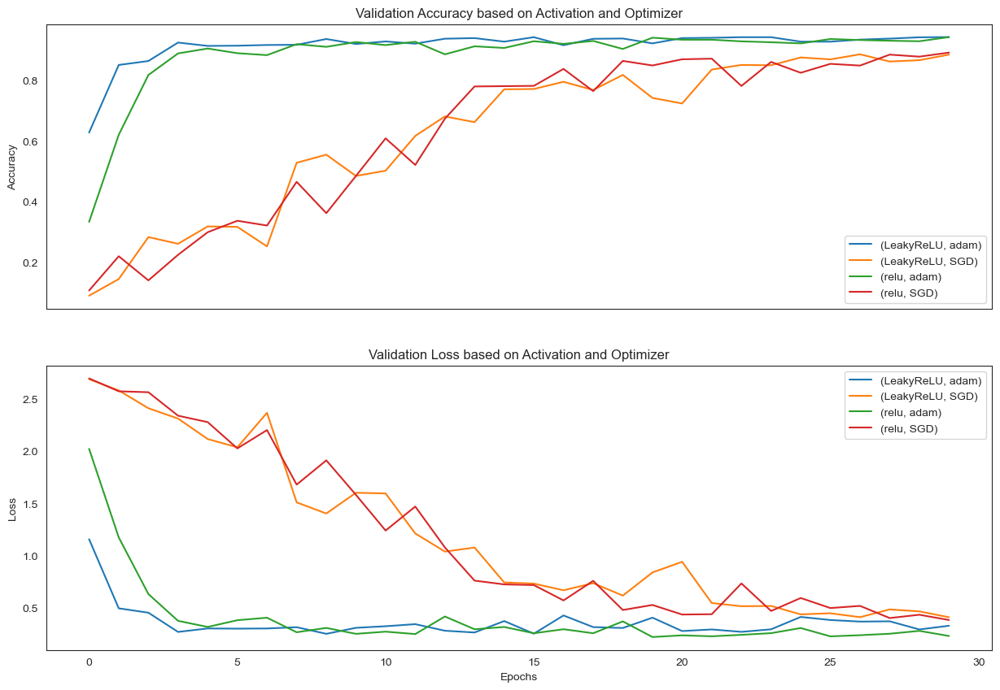

In [ ]:
val_loss_per_function = {k: v.history['val_loss']
                         for k, v in activation_results.items()}
val_acc_per_function = {k: v.history['val_accuracy']
                        for k, v in activation_results.items()}

val_loss_curves = pd.DataFrame(val_loss_per_function)
val_acc_curves = pd.DataFrame(val_acc_per_function)

fig, (ax1, ax2) = plt.subplots(2, ncols=1,
                               figsize=(15, 10), sharex=True, squeeze=True)

# Plot the accuracy curves
val_acc_curves.plot(ax=ax1)
ax1.set_title('Validation Accuracy based on Activation and Optimizer')
ax1.set_ylabel('Accuracy')
ax1.legend(loc='lower right')

# Plot the loss curves
val_loss_curves.plot(ax=ax2)
ax2.set_title('Validation Loss based on Activation and Optimizer')
ax2.set_xlabel('Epochs')
ax2.set_ylabel('Loss')
ax2.legend(loc='upper right')


plt.show()

# Cross Validation
- We will be using the similar configs as the model(s) we __trained earlier__, but using __LeakyReLU__  this time
- For Input A, i decided to use __10 epochs__ for __cross-validation__, since from earlier, we have seen that out model in the earlier stages tend to have __higher validation accuracy__
- For Input B, i decided to use __6 epochs__ for __cross-validation__


_Cross validation helps in estimating the performance of a model by training and testing it on different subsets of the available data_

In [ ]:

from sklearn.model_selection import cross_val_score
from scikeras.wrappers import KerasClassifier
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import train_test_split
import wandb
from sklearn.model_selection import RandomizedSearchCV
from scikeras.wrappers import KerasClassifier
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Dropout, Flatten, Dense
from keras.optimizers import Adam, SGD
from keras.activations import relu, sigmoid
import gc

### Create Model for Input size A

In [ ]:

from keras.layers import LeakyReLU


def create_model_a():


    model = Sequential()

    model.add(Conv2D(32, input_shape=(31,31, 1), kernel_size=(3, 3)))

    # model.add(BatchNormalization())

    model.add(MaxPooling2D(pool_size=(2, 2)))

    model.add(Dropout(0.3))

    model.add(Conv2D(64, kernel_size=(3, 3), activation=LeakyReLU(0.05)))

    # model.add(BatchNormalization())

    model.add(MaxPooling2D(pool_size=(2, 2)))

    model.add(Dropout(0.3))

    model.add(Conv2D(128, kernel_size=(3, 3), activation=LeakyReLU(0.05)))

    # model.add(BatchNormalization())

    model.add(MaxPooling2D(pool_size=(2, 2)))

    model.add(Dropout(0.3))

    model.add(Flatten())

    model.add(Dense(128, activation=LeakyReLU(0.05)))

    model.add(Dropout(0.2))

    model.add(Dense(num_classes, activation="softmax"))

    model.compile(loss="categorical_crossentropy",
                  optimizer='adam', metrics=['accuracy'])


    return model

### Create model for Input size B

In [ ]:

from keras.layers import LeakyReLU


def create_model_b():


    model = Sequential()

    model.add(Conv2D(32, input_shape=(128, 128, 1), kernel_size=(3, 3)))

    # model.add(BatchNormalization())

    model.add(MaxPooling2D(pool_size=(2, 2)))

    model.add(Dropout(0.4))

    model.add(Conv2D(64, kernel_size=(3, 3), activation=LeakyReLU(0.05)))

    # model.add(BatchNormalization())

    model.add(MaxPooling2D(pool_size=(2, 2)))

    model.add(Dropout(0.4))

    model.add(Conv2D(128, kernel_size=(3, 3), activation=LeakyReLU(0.05)))

    # model.add(BatchNormalization())

    model.add(MaxPooling2D(pool_size=(2, 2)))

    model.add(Dropout(0.4))
    
    model.add(Conv2D(256, kernel_size=(3, 3), activation=LeakyReLU(0.05)))

    # model.add(BatchNormalization())

    model.add(MaxPooling2D(pool_size=(2, 2)))

    model.add(Dropout(0.4))

    model.add(Flatten())

    model.add(Dense(256, activation=LeakyReLU(0.05)))

    model.add(Dropout(0.2))

    model.add(Dense(num_classes, activation="softmax"))

    model.compile(loss="categorical_crossentropy",
                  optimizer='adam', metrics=['accuracy'])


    return model

### Function: Fitting and Evaluating Model

In [ ]:


def fit_and_evaluate_a(t_x, val_x, t_y, val_y, epochs, batch_size):
    model = create_model_a()
    # Add your model layers here
    
    # Compile your model
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    
    # Set early stopping criteria
    patience = 5
    early_stopping = EarlyStopping(monitor='val_loss', patience=patience, verbose=1)
    model_checkpoint_cv_a = ModelCheckpoint('model_checkpoint_cv_a.h5', verbose=0, save_best_only=True)
    
    # Train your model
    history = model.fit(t_x, t_y, epochs=epochs, batch_size=batch_size,
                        callbacks=[early_stopping,model_checkpoint_cv_a],
                        validation_data=(val_x, val_y),
                        verbose=1)
    
    # Evaluate the model on the validation set
    val_score = model.evaluate(val_x, val_y)
    print("Val Score: ", val_score)
    
    return history



def fit_and_evaluate_b(t_x, val_x, t_y, val_y, epochs, batch_size):
    model = create_model_b()
    # Add your model layers here
    
    # Compile your model
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    
    # Set early stopping criteria
    patience = 5
    early_stopping = EarlyStopping(monitor='val_loss', patience=patience, verbose=1)
    model_checkpoint_cv_b = ModelCheckpoint('model_checkpoint_cv_b.h5', verbose=0, save_best_only=True)
    # Train your model
    history = model.fit(t_x, t_y, epochs=epochs, batch_size=batch_size,
                        callbacks=[early_stopping,model_checkpoint_cv_b],
                        validation_data=(val_x, val_y),
                        verbose=1)
    
    # Evaluate the model on the validation set
    val_score = model.evaluate(val_x, val_y)
    print("Val Score: ", val_score)
    
    return history

## Cross-Validation Input A (31 by 31)

In [ ]:

n_folds = 5
epochs = 10
batch_size = 8

# Save the model history in a list after fitting so that we can plot later
model_history_a = [] 

for i in range(n_folds):
    print("Training on Fold: ", i+1)
    
    # Split the data into training and validation sets for this fold
    t_x, val_x, t_y, val_y = train_test_split(images_a_train_resampled, labels_a_train_resampled, test_size=0.1, 
                                             random_state=np.random.randint(1, 1000, 1)[0])
    
    # Train and evaluate the model for this fold
    history = fit_and_evaluate_a(t_x, val_x, t_y, val_y, epochs, batch_size)
    
    # Append the model history to the list
    model_history_a.append(history)
    
    print("=======" * 12, end="\n\n\n")
    
    #Memory Cleanup 
    gc.collect()
    clear_session()

Training on Fold:  1
Epoch 1/10
1612/1612 [==============================] - 10s 6ms/step - loss: 2.1425 - accuracy: 0.2976 - val_loss: 1.5330 - val_accuracy: 0.5178
Epoch 2/10
1612/1612 [==============================] - 8s 5ms/step - loss: 1.3161 - accuracy: 0.5848 - val_loss: 0.9399 - val_accuracy: 0.7251
Epoch 3/10
1612/1612 [==============================] - 8s 5ms/step - loss: 0.9683 - accuracy: 0.6924 - val_loss: 0.6840 - val_accuracy: 0.7913
Epoch 4/10
1612/1612 [==============================] - 8s 5ms/step - loss: 0.7965 - accuracy: 0.7446 - val_loss: 0.5053 - val_accuracy: 0.8548
Epoch 5/10
1612/1612 [==============================] - 8s 5ms/step - loss: 0.6849 - accuracy: 0.7809 - val_loss: 0.4687 - val_accuracy: 0.8667
Epoch 6/10
1612/1612 [==============================] - 8s 5ms/step - loss: 0.6067 - accuracy: 0.8036 - val_loss: 0.3922 - val_accuracy: 0.8856
Epoch 7/10
1612/1612 [==============================] - 8s 5ms/step - loss: 0.5469 - accuracy: 0.8217 - val_loss: 

## Looking At Fold Accuracies
- we can see that for each of the __5 folds__, the __Accuracies__ are __relatively consistent__ throughout

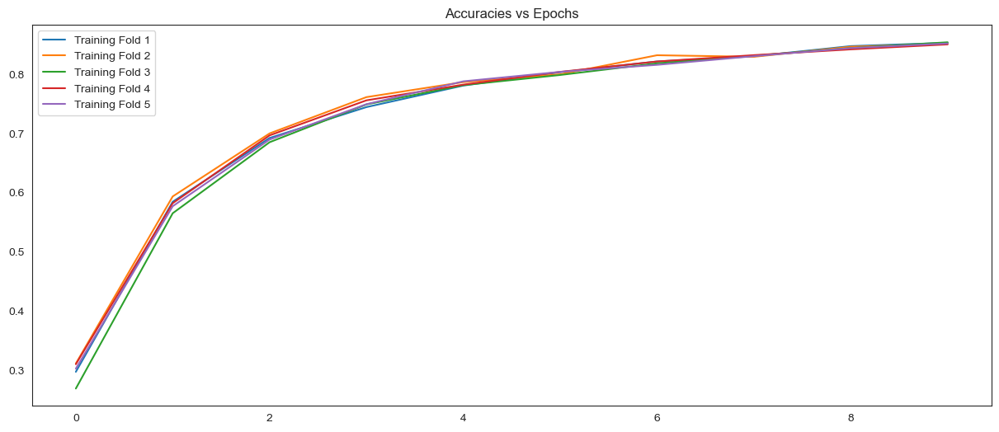

In [ ]:
plt.figure(figsize=(15,6))
plt.title('Accuracies vs Epochs')
plt.plot(model_history_a[0].history['accuracy'], label='Training Fold 1')
plt.plot(model_history_a[1].history['accuracy'], label='Training Fold 2')
plt.plot(model_history_a[2].history['accuracy'], label='Training Fold 3')
plt.plot(model_history_a[3].history['accuracy'], label='Training Fold 4')
plt.plot(model_history_a[4].history['accuracy'], label='Training Fold 5')
plt.legend()
plt.show()

## Looking At Fold Train Accuracies vs Validation Accuracies
- The __Validation Accuracies__ seem to be higher than the __Train Accuracies__, which again could be caused by the __Dropout__ layers, and usually after __more epochs__, they tend to __'converge'__ as seen earlier 

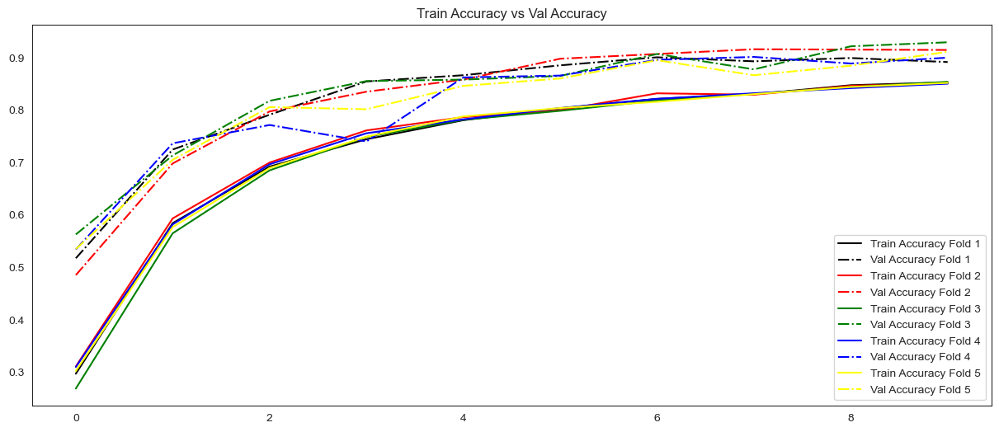

In [ ]:
plt.figure(figsize=(15, 6))
plt.title('Train Accuracy vs Val Accuracy')

colors = ['black', 'red', 'green', 'blue', 'yellow']
linestyles = ['solid', 'dashdot', 'solid', 'dashdot', 'solid']

for i, history in enumerate(model_history_a):
    plt.plot(history.history['accuracy'], label=f'Train Accuracy Fold {i+1}', color=colors[i], linestyle='solid')
    plt.plot(history.history['val_accuracy'], label=f'Val Accuracy Fold {i+1}', color=colors[i], linestyle='dashdot')

plt.legend()
plt.show()


## Evaluate the best model from CV
- Best accuracy of __0.8710__, loss of __0.4308__


In [ ]:
#Load the model that was saved by ModelCheckpoint
model_a_cv = load_model('model_checkpoint_cv_a.h5')

In [ ]:
model_a_cv.evaluate(images_a_test,labels_a_test)

94/94 [==============================] - 1s 4ms/step - loss: 0.4308 - accuracy: 0.8710


[0.43080583214759827, 0.8709999918937683]

 1/94 [..............................] - ETA: 5s

94/94 [==============================] - 0s 2ms/step


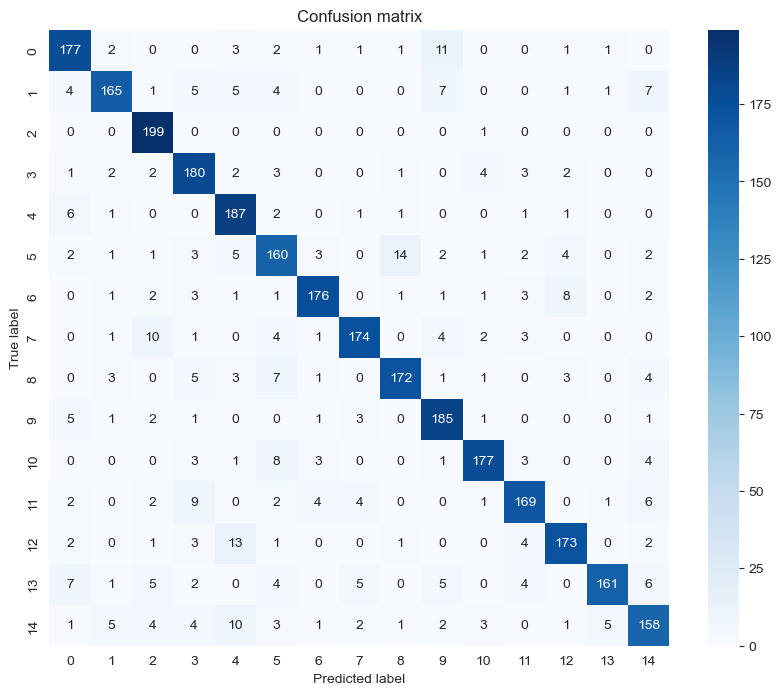

Classification Report
              precision    recall  f1-score   support

        Bean       0.86      0.89      0.87       200
Bitter_Gourd       0.90      0.82      0.86       200
Bottle_Gourd       0.87      0.99      0.93       200
     Brinjal       0.82      0.90      0.86       200
    Broccoli       0.81      0.94      0.87       200
     Cabbage       0.80      0.80      0.80       200
    Capsicum       0.92      0.88      0.90       200
      Carrot       0.92      0.87      0.89       200
 Cauliflower       0.90      0.86      0.88       200
    Cucumber       0.84      0.93      0.88       200
      Papaya       0.92      0.89      0.90       200
      Potato       0.88      0.84      0.86       200
     Pumpkin       0.89      0.86      0.88       200
      Radish       0.95      0.81      0.87       200
      Tomato       0.82      0.79      0.81       200

    accuracy                           0.87      3000
   macro avg       0.87      0.87      0.87      3000
weig

In [ ]:
Confusion_Matrix_And_Report(model_a_cv,images_a_test,labels_a_test)

## Cross-Validation (Input  B)


In [ ]:




n_folds = 5
epochs = 6
batch_size = 8

# Save the model history in a list after fitting so that we can plot later
model_history = [] 

for i in range(n_folds):
    print("Training on Fold: ", i+1)
    
    # Split the data into training and validation sets for this fold
    t_x, val_x, t_y, val_y = train_test_split(images_b_train_resampled, labels_b_train_resampled, test_size=0.1, 
                                             random_state=np.random.randint(1, 1000, 1)[0])
    
    # Train and evaluate the model for this fold
    history = fit_and_evaluate_b(t_x, val_x, t_y, val_y, epochs, batch_size)
    
    # Append the model history to the list
    model_history.append(history)
    
    print("=======" * 12, end="\n\n\n")
    
    #Memory Cleanup 
    gc.collect()
    clear_session()

Training on Fold:  1
Epoch 1/6
1612/1612 [==============================] - 14s 8ms/step - loss: 1.6532 - accuracy: 0.4616 - val_loss: 0.7596 - val_accuracy: 0.7641
Epoch 2/6
1612/1612 [==============================] - 14s 8ms/step - loss: 0.6609 - accuracy: 0.7889 - val_loss: 0.3615 - val_accuracy: 0.8828
Epoch 3/6
1612/1612 [==============================] - 13s 8ms/step - loss: 0.4227 - accuracy: 0.8700 - val_loss: 0.3021 - val_accuracy: 0.9065
Epoch 4/6
1612/1612 [==============================] - 14s 8ms/step - loss: 0.3291 - accuracy: 0.8956 - val_loss: 0.2624 - val_accuracy: 0.9288
Epoch 5/6
1612/1612 [==============================] - 14s 9ms/step - loss: 0.2801 - accuracy: 0.9126 - val_loss: 0.2787 - val_accuracy: 0.9274
Epoch 6/6
45/45 [==============================] - 0s 8ms/step - loss: 0.2752 - accuracy: 0.9204
Val Score:  [0.2752303183078766, 0.9204466342926025]


Training on Fold:  2
Epoch 1/6
1612/1612 [==============================] - 14s 9ms/step - loss: 1.7947 - a

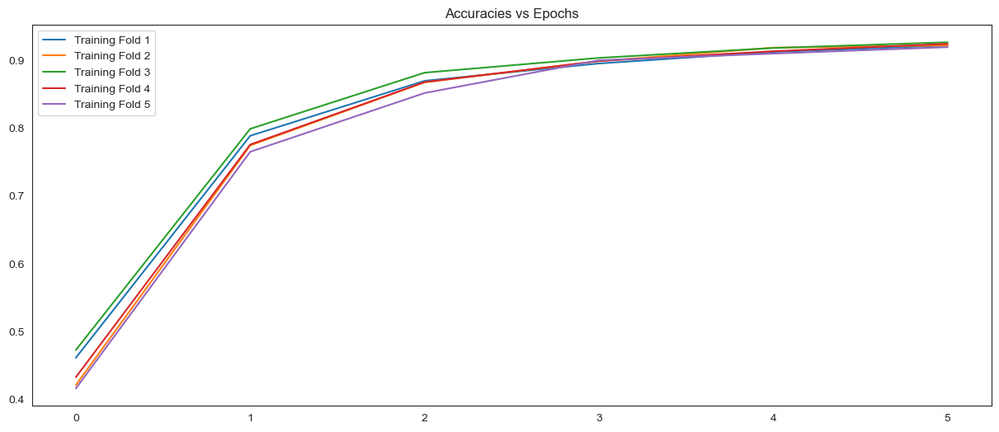

In [ ]:
plt.figure(figsize=(15,6))
plt.title('Accuracies vs Epochs')
plt.plot(model_history[0].history['accuracy'], label='Training Fold 1')
plt.plot(model_history[1].history['accuracy'], label='Training Fold 2')
plt.plot(model_history[2].history['accuracy'], label='Training Fold 3')
plt.plot(model_history[3].history['accuracy'], label='Training Fold 4')
plt.plot(model_history[4].history['accuracy'], label='Training Fold 5')
plt.legend()
plt.show()

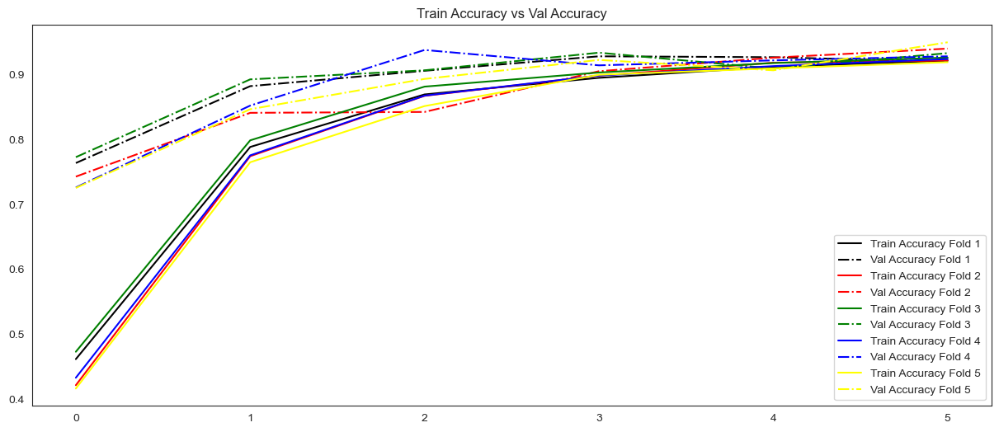

In [ ]:
plt.figure(figsize=(15, 6))
plt.title('Train Accuracy vs Val Accuracy')

colors = ['black', 'red', 'green', 'blue', 'yellow']
linestyles = ['solid', 'dashdot', 'solid', 'dashdot', 'solid']

for i, history in enumerate(model_history):
    plt.plot(history.history['accuracy'], label=f'Train Accuracy Fold {i+1}', color=colors[i], linestyle='solid')
    plt.plot(history.history['val_accuracy'], label=f'Val Accuracy Fold {i+1}', color=colors[i], linestyle='dashdot')

plt.legend()
plt.show()


## Evaluate the best model from CV
- Best accuracy of __0.8953__, loss of __0.3483__


In [ ]:
#Load the model that was saved by ModelCheckpoint
model_b_cv = load_model('model_checkpoint_cv_b.h5')

In [ ]:
model_b_cv.evaluate(images_b_test,labels_b_test)

94/94 [==============================] - 9s 9ms/step - loss: 0.3483 - accuracy: 0.8953


[0.34831473231315613, 0.8953333497047424]

94/94 [==============================] - 1s 8ms/step


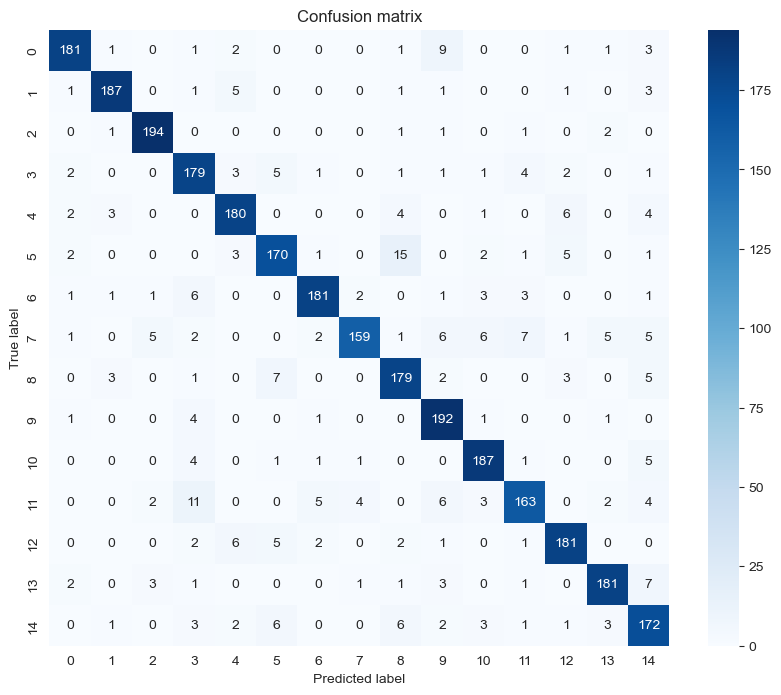

Classification Report
              precision    recall  f1-score   support

        Bean       0.94      0.91      0.92       200
Bitter_Gourd       0.95      0.94      0.94       200
Bottle_Gourd       0.95      0.97      0.96       200
     Brinjal       0.83      0.90      0.86       200
    Broccoli       0.90      0.90      0.90       200
     Cabbage       0.88      0.85      0.86       200
    Capsicum       0.93      0.91      0.92       200
      Carrot       0.95      0.80      0.87       200
 Cauliflower       0.84      0.90      0.87       200
    Cucumber       0.85      0.96      0.90       200
      Papaya       0.90      0.94      0.92       200
      Potato       0.89      0.81      0.85       200
     Pumpkin       0.90      0.91      0.90       200
      Radish       0.93      0.91      0.92       200
      Tomato       0.82      0.86      0.84       200

    accuracy                           0.90      3000
   macro avg       0.90      0.90      0.90      3000
weig

In [ ]:
Confusion_Matrix_And_Report(model_b_cv,images_b_test,labels_b_test)

##  Model Performance on Data Augmented Train set

- For this part, we would be using the __Train , Val and Test Generators__ generated using __flow_from_directory__ + __ImageDataGenerator__, which performs __Data Augmentation__ on the fly


# Model Training Input Size 31 by 31 with augmentation


In [221]:
from keras.regularizers import l1,l2,L1L2

In [22]:
model_a_aug = Sequential([
    
    Conv2D(32, kernel_size=(3, 3), activation="relu",input_shape=(31, 31, 1)),
    MaxPooling2D(pool_size=(2, 2)),
    Dropout(0.3),
    Conv2D(64, kernel_size=(3, 3), activation='relu'),
    MaxPooling2D(pool_size=(2, 2)),
    Dropout(0.3),
    Conv2D(128, kernel_size=(3, 3), activation='relu'),
    MaxPooling2D(pool_size=(2, 2)),
    Dropout(0.3),
    Flatten(),
    Dense(256, activation='relu'),
    Dropout(0.2),
    Dense(num_classes, activation="softmax")
])

In [58]:
# Define the checkpoint callback



model_checkpoint_callback_dropout_a = ModelCheckpoint(
    filepath='Models/model_checkpoint_aug_a_dropout.h5',
    save_best_only=True)

model_checkpoint_callback_aug_dropout_cw_a = ModelCheckpoint(
    filepath='Models/model_checkpoint_aug_a_dropout_cw.h5',
    save_best_only=True)


model_a_aug.compile(loss="categorical_crossentropy",
                optimizer="adam", metrics=["accuracy","AUC","Precision","Recall"])

wandb.init(project='DELE_CA1_modelA',entity='sugarwaffles-test')
# Augmented train dataset with class weights
history_orig = model_a_aug.fit(train_generator_a_aug,
                              validation_data=val_generator_a,
                              validation_split = 0.5,
                              epochs=25,
                              verbose=0,batch_size = 32 ,callbacks=[WandbMetricsLogger(),model_checkpoint_callback_dropout_a])

wandb.init(project='DELE_CA1_modelA',entity='sugarwaffles-test')

# Augmented train dataset with class weights
history_dropout = model_a_aug.fit(train_generator_a_aug,
                              validation_data=val_generator_a,
                              validation_split = 0.5,
                              epochs=25,
                              verbose=0,batch_size = 32 ,class_weight = class_weights_dict,callbacks=[WandbMetricsLogger(),model_checkpoint_callback_aug_dropout_cw_a])

wandb.finish()

epoch/accuracy,▁▂▂▂▃▄▄▅▅▅▆▆▆▇▇▇▇▇▇▇██████████
epoch/auc,▁▃▄▄▅▆▆▇▇▇▇▇██████████████████
epoch/epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
epoch/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/loss,██▇▇▆▆▅▅▄▄▃▃▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁
epoch/precision,▁▅▄▅▆▆▆▆▇▇▇▇▇▇▇▇▇█████████████
epoch/recall,▁▁▁▁▁▂▃▃▄▅▅▅▆▆▆▇▇▇▇▇▇█████████
epoch/val_accuracy,▁▂▁▂▃▃▃▄▃▄▅▅▆▇▇▇█▇████▇█▇█████
epoch/val_auc,▁▃▂▄▄▅▅▆▆▇▇▇▇█████████████████
epoch/val_loss,███▇▇▆▇▅▆▅▄▄▃▂▂▂▂▂▁▁▁▁▂▁▂▁▁▁▁▁
epoch/val_precision,▁▁▁▁█▇▅▇▅▆▇▆▇████▇████▇███████


epoch/accuracy,▁▃▄▄▅▅▆▆▆▆▇▇▇▇▇▇▇▇███████
epoch/auc,▁▄▅▆▆▆▇▇▇▇▇▇▇████████████
epoch/epoch,▁▁▂▂▂▂▃▃▃▄▄▄▅▅▅▅▆▆▆▇▇▇▇██
epoch/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/loss,█▇▆▅▄▄▄▃▃▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁
epoch/precision,▁▅▆▇▇▇▇▇▇▇▇██████████████
epoch/recall,▁▁▂▂▃▄▄▄▅▅▆▆▆▆▇▇▇▇▇▇█████
epoch/val_accuracy,▁▂▃▄▃▆▅▅▅▆▅▅▇▅▅▇▇▆▇▇▇█▇▇▇
epoch/val_auc,▁▁▃▅▄▆▆▆▆▇▆▆█▆▆▇█▆▇▇▇███▇
epoch/val_loss,▇█▆▄▇▃▄▃▅▃▄▄▂▄▄▂▂▄▂▂▃▁▂▂▂
epoch/val_precision,▁▄▆▆▅▇▆▇▆▇▆▆█▆▆▇█▆▇▇▇█▇█▇


epoch/accuracy,▁▁▂▃▂▂▃▄▅▄▄▅▅▄▆▅▆▆▇▇▇▆▇██
epoch/auc,▂▁▃▃▃▂▄▄▅▄▄▆▅▅▅▆▆▆▇█▇▆▇██
epoch/epoch,▁▁▂▂▂▂▃▃▃▄▄▄▅▅▅▅▆▆▆▇▇▇▇██
epoch/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/loss,██▇▇▆▇▆▅▅▅▅▄▄▄▄▄▄▃▂▂▂▂▃▁▂
epoch/precision,▁▂▂▃▃▃▃▄▅▄▄▄▅▃▆▄▇▇▇▆█▇██▇
epoch/recall,▁▁▂▃▃▂▃▄▄▄▃▅▅▄▅▅▆▆▇▇▇▇▇██
epoch/val_accuracy,▄▅▁▁▂▅▇▇▅▅▄▇▄▄███▄▅▇▇▅▄▅▇
epoch/val_auc,▅▅▂▁▃▆▇█▅▆▄█▄▄███▄▆▇▇▆▄▅▇
epoch/val_loss,▄▄▇█▆▃▂▂▄▄▅▁▅▅▁▁▁▅▃▂▂▄▅▄▂
epoch/val_precision,▅▅▂▁▃▅█▇▆▅▅▇▄▄███▄▆▇▇▅▅▅▇


### Accuracies of model on train and val without class weights

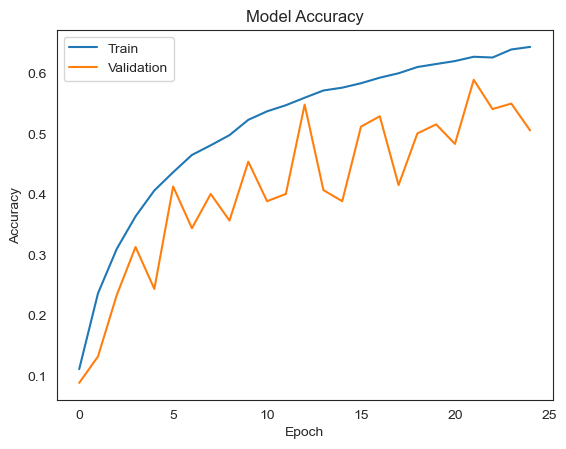

In [59]:
plt.figure()

plt.plot(history_orig.history['accuracy'])
plt.plot(history_orig.history['val_accuracy'])

plt.title("Model Accuracy")
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'])
plt.show()

### Accuracies on train and val with class weights

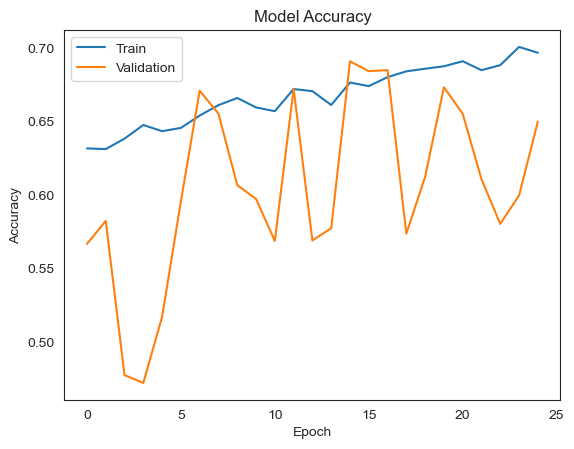

In [60]:
plt.figure()

plt.plot(history_dropout.history['accuracy'])
plt.plot(history_dropout.history['val_accuracy'])

plt.title("Model Accuracy")
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'])
plt.show()

### Looking At Confusion Matrix & Other Metrics

In [229]:
model_a_aug = load_model('Models/model_checkpoint_aug_a_dropout.h5')
model_a_aug_cw = load_model('Models/model_checkpoint_aug_a_dropout_cw.h5')


In [230]:
model_a_aug.evaluate(images_a_test,labels_a_test,batch_size=32)
model_a_aug_cw.evaluate(images_a_test,labels_a_test,batch_size=32)

94/94 [==============================] - 1s 6ms/step - loss: 0.6726 - accuracy: 0.8030 - auc: 0.9813 - precision: 0.8990 - recall: 0.7060


[0.6726256608963013,
 0.8029999732971191,
 0.981306254863739,
 0.8989813327789307,
 0.7059999704360962]

## Testing on Oversampled Train set + Augmentation for 31 by 31 Images

In [23]:

model_a_resampled_aug_checkpoint = ModelCheckpoint("Models_CNN/checkpoint_a_aug_resampled.h5",
                                     monitor='val_accuracy',  
                                     save_best_only=True,
                                     verbose=1)
early_stopping = EarlyStopping(patience=5,monitor='validation_loss')
model_a_resampled_aug = clone_model(model_a_aug)
model_a_resampled_aug.compile(optimizer='adam',
                             loss='categorical_crossentropy',
                             metrics=["accuracy", "AUC", "Recall"])
model_a_resampled_aug_history = model_a_resampled_aug.fit(train_generator_a_aug,
                                     validation_data=(val_generator_a),
                                     epochs=50,
                                     verbose=1, batch_size=32,callbacks=[model_a_resampled_aug_checkpoint,early_stopping]
                                     )

Epoch 1/50
283/283 [==============================] - ETA: 0s - loss: 2.5838 - accuracy: 0.1141 - auc: 0.6446 - recall: 0.0000e+00
Epoch 1: val_accuracy improved from -inf to 0.13567, saving model to Models_CNN\checkpoint_a_aug_resampled.h5
283/283 [==============================] - 32s 73ms/step - loss: 2.5838 - accuracy: 0.1141 - auc: 0.6446 - recall: 0.0000e+00 - val_loss: 2.5139 - val_accuracy: 0.1357 - val_auc: 0.6836 - val_recall: 0.0000e+00
Epoch 2/50
282/283 [============================>.] - ETA: 0s - loss: 2.3287 - accuracy: 0.2198 - auc: 0.7556 - recall: 0.0121
Epoch 2: val_accuracy did not improve from 0.13567
283/283 [==============================] - 12s 41ms/step - loss: 2.3282 - accuracy: 0.2201 - auc: 0.7557 - recall: 0.0121 - val_loss: 2.8518 - val_accuracy: 0.1203 - val_auc: 0.6660 - val_recall: 0.0257
Epoch 3/50
282/283 [============================>.] - ETA: 0s - loss: 2.1008 - accuracy: 0.3163 - auc: 0.8135 - recall: 0.0508
Epoch 3: val_accuracy improved from 0.13

### SMOTE + Augmentation

In [29]:

model_a_SMOTE_aug_checkpoint = ModelCheckpoint("Models_CNN/checkpoint_a_aug_SMOTE.h5",
                                     monitor='val_accuracy',  
                                     save_best_only=True,
                                     verbose=1)
early_stopping = EarlyStopping(patience=5,monitor='validation_loss')
model_a_resampled_SMOTE = clone_model(model_a_aug)
model_a_resampled_SMOTE.compile(optimizer='adam',
                             loss='categorical_crossentropy',
                             metrics=["accuracy", "AUC", "Precision", "Recall"])
model_a_resampled_SMOTE_history = model_a_resampled_SMOTE.fit(train_generator_a_aug_SMOTE,
                                     validation_data=(val_generator_a),
                                     epochs=50,
                                     verbose=1, batch_size=32,callbacks=[model_a_SMOTE_aug_checkpoint]
                                     )

Epoch 1/50


446/448 [============================>.] - ETA: 0s - loss: 2.6021 - accuracy: 0.1231 - auc: 0.6290 - precision: 0.1579 - recall: 2.1036e-04
Epoch 1: val_accuracy improved from -inf to 0.17400, saving model to Models_CNN\checkpoint_a_aug_SMOTE.h5
448/448 [==============================] - 13s 27ms/step - loss: 2.6011 - accuracy: 0.1236 - auc: 0.6297 - precision: 0.1579 - recall: 2.0942e-04 - val_loss: 2.4912 - val_accuracy: 0.1740 - val_auc: 0.7041 - val_precision: 0.2000 - val_recall: 0.0010
Epoch 2/50
447/448 [============================>.] - ETA: 0s - loss: 2.2130 - accuracy: 0.2779 - auc: 0.7886 - precision: 0.5452 - recall: 0.0236
Epoch 2: val_accuracy improved from 0.17400 to 0.24767, saving model to Models_CNN\checkpoint_a_aug_SMOTE.h5
448/448 [==============================] - 9s 21ms/step - loss: 2.2124 - accuracy: 0.2779 - auc: 0.7888 - precision: 0.5440 - recall: 0.0237 - val_loss: 2.4234 - val_accuracy: 0.2477 - val_auc: 0.7658 - val_precision: 0.3959 - val_recall: 0.0647
E

### Train and Validation Accuracies

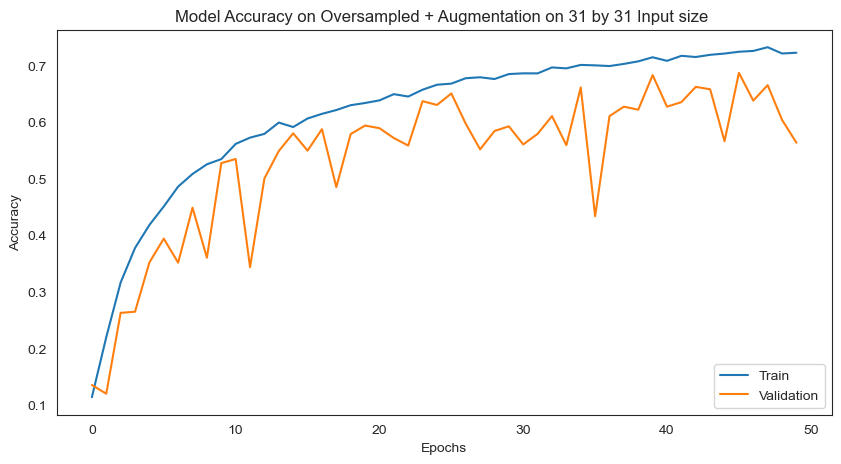

In [33]:

plt.figure(figsize=(10,5))

plt.title("Model Accuracy on Oversampled + Augmentation on 31 by 31 Input size ")
plt.plot(model_a_resampled_aug.history['accuracy'], label='Train')
plt.plot(model_a_resampled_aug.history['val_accuracy'], label='Validation')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend(loc= 'lower right')
plt.show()

### Train and Validation Accuracies

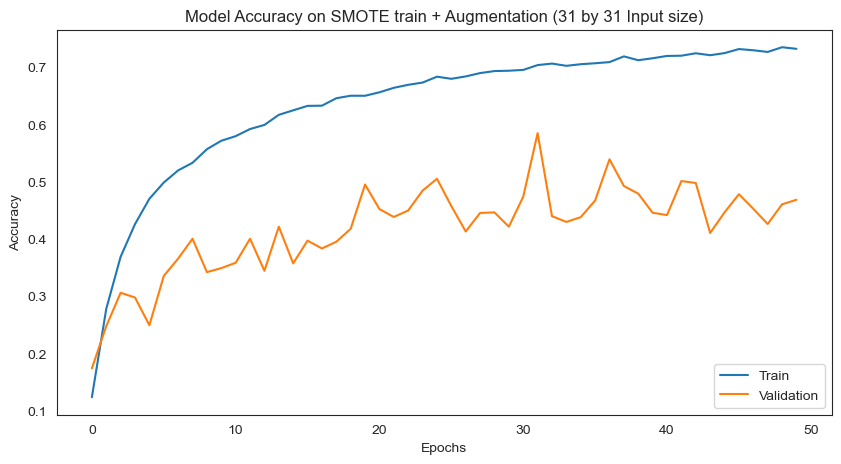

In [32]:

plt.figure(figsize=(10,5))

plt.title("Model Accuracy on SMOTE train + Augmentation (31 by 31 Input size)")
plt.plot(model_a_resampled_SMOTE_history.history['accuracy'], label='Train')
plt.plot(model_a_resampled_SMOTE_history.history['val_accuracy'], label='Validation')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend(loc= 'lower right')
plt.show()

## Conclusions of Data Augmentation on 31 by 31 Inputs
- In general, we can see that __Augmentation__ may not really benefit our __model's performance__, regardless of using __class imbalance__ techniques like __SMOTE , Oversampling , class weights__
- It is possible that our __Augmentation techniques__ performed may not suit the images well, since __31 by 31__ is considered very small images, and may not be as effective than just training model __without augmentation__ , as seen earlier
- We may try hyperparameter tunning to improve this later on

# Model Training Input Size 128 by 128 with augmentation
- for this, after __experimenting__, I decided to use __L2 Regularization__, rather than using __Dropout__ as it seems to work better


In [128]:

model_b_aug = Sequential([
    Conv2D(32, kernel_size=(3, 3), activation="relu", input_shape=(128, 128, 1), kernel_regularizer=l2(0.001)),
    MaxPooling2D(pool_size=(2, 2)),
    Dropout(0.3),
    Conv2D(64, kernel_size=(3, 3), activation='relu', kernel_regularizer=l2(0.001)),
    MaxPooling2D(pool_size=(2, 2)),
    Dropout(0.3),
    Conv2D(128, kernel_size=(3, 3), activation='relu'),
    MaxPooling2D(pool_size=(2, 2)),
    Dropout(0.3),
    Conv2D(256, kernel_size=(3, 3), activation='relu'),
    MaxPooling2D(pool_size=(2, 2)),
    Dropout(0.2),
    Flatten(),
    Dense(512, activation='relu'),

    Dense(num_classes, activation="softmax")
])

In [ ]:
# Define the checkpoint callback



model_checkpoint_callback_dropout = ModelCheckpoint(
    filepath='Models/model_checkpoint_aug_b_dropout.h5',
    save_best_only=True)

model_checkpoint_callback_aug_dropout_cw = ModelCheckpoint(
    filepath='Models/model_checkpoint_aug_b_dropout_cw.h5',
    save_best_only=True)

patience = 5
early_stopping = EarlyStopping(monitor='val_accuracy', patience=patience, verbose=0)
    
model_b_aug.compile(loss="categorical_crossentropy",
                optimizer="adam", metrics=["accuracy","AUC","Precision","Recall"])

wandb.init(project='CA1',entity='sugarwaffles-test')
# Augmented train dataset with class weights
history_orig = model_b_aug.fit(train_generator_b_aug,
                              validation_data=val_generator_b,
                              validation_split = 0.5,
                              epochs=25,
                              verbose=0,batch_size = 32 ,callbacks=[WandbMetricsLogger(),early_stopping,model_checkpoint_callback_dropout])

wandb.init(project='CA1',entity='sugarwaffles-test')

# Augmented train dataset with class weights
history_dropout = model_b_aug.fit(train_generator_b_aug,
                              validation_data=val_generator_b,
                              validation_split = 0.5,
                              epochs=25,
                              verbose=0,batch_size = 32 ,class_weight = class_weights_dict,callbacks=[WandbMetricsLogger(),early_stopping,model_checkpoint_callback_aug_dropout_cw])

wandb.finish()

Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Currently logged in as: wilfreddj (sugarwaffles-test). Use `wandb login --relogin` to force relogin


epoch/accuracy,▁▂▄▅▆▆▇▇▇▇██████
epoch/auc,▁▄▆▇▇▇██████████
epoch/epoch,▁▁▂▂▃▃▄▄▅▅▆▆▇▇██
epoch/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/loss,█▇▅▄▃▃▂▂▂▂▂▁▁▁▁▁
epoch/precision,▁▄▅▆▇▇▇▇▇███████
epoch/recall,▁▁▃▄▅▆▇▇▇▇▇█▇███
epoch/val_accuracy,▁▃▅▆▆▇█▅███▇███▇
epoch/val_auc,▁▄▆▇▇▇█▆████████
epoch/val_loss,█▆▄▃▃▂▂▅▁▁▁▂▁▁▁▂
epoch/val_precision,▁▃▆▅▅▆▇▃███▆▇██▆


epoch/accuracy,▁▃▂▅▅▆▇▇▇▇██
epoch/auc,▁▁▁▆▄▆▅▆▆▆▇█
epoch/epoch,▁▂▂▃▄▄▅▅▆▇▇█
epoch/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁
epoch/loss,█▇▇▄▄▃▂▃▃▃▂▁
epoch/precision,▁▂▃▆▆▆▇█▇▇██
epoch/recall,▁▂▃▅▅▆▇▇▇▇██
epoch/val_accuracy,▄▄▃▄▁▅█▃▅▅▇▂
epoch/val_auc,▅▅▄▅▂▆█▄▆▇▇▁
epoch/val_loss,▅▅▆▅█▃▁▆▄▄▂█
epoch/val_precision,▄▅▃▄▁▅█▄▅▆▇▁


### Looking At Confusion Matrix & Other Metrics

In [ ]:
model_b_aug = load_model('Models/model_checkpoint_aug_b_dropout.h5')
model_b_aug_cw = load_model('Models/model_checkpoint_aug_b_dropout_cw.h5')


In [ ]:
model_b_aug.evaluate(images_b_test,labels_b_test,batch_size=32)
model_b_aug_cw.evaluate(images_b_test,labels_b_test,batch_size=32)

94/94 [==============================] - 1s 7ms/step - loss: 0.1816 - accuracy: 0.9533 - auc: 0.9976 - precision: 0.9600 - recall: 0.9450


[0.18163293600082397,
 0.95333331823349,
 0.997602105140686,
 0.9600406289100647,
 0.9449999928474426]

### Without class weights

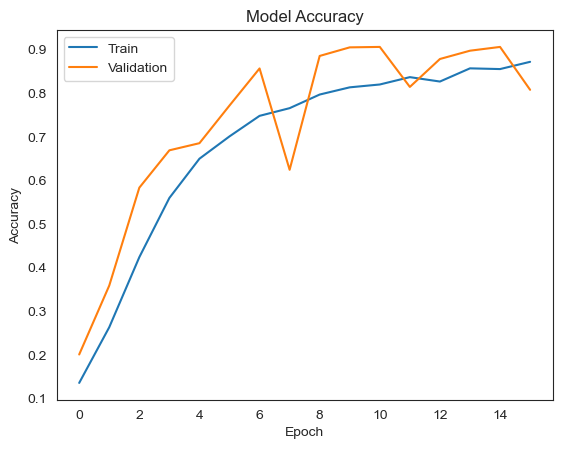

In [ ]:
plt.figure()

plt.plot(history_orig.history['accuracy'])
plt.plot(history_orig.history['val_accuracy'])

plt.title("Model Accuracy")
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'])
plt.show()

### With class weights

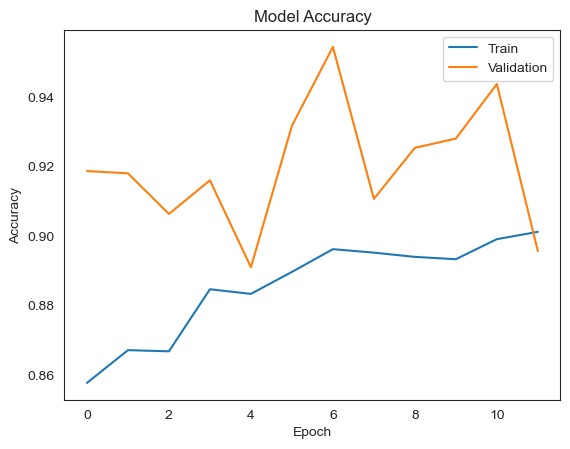

In [ ]:
plt.figure()

plt.plot(history_dropout.history['accuracy'])
plt.plot(history_dropout.history['val_accuracy'])

plt.title("Model Accuracy")
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'])
plt.show()

## Testing on SMOTE set + Augmentation for 128 by 128 Images

In [39]:
model_b_SMOTE_aug_checkpoint = ModelCheckpoint("Models_CNN/model_b_SMOTE_aug_checkpoint.h5",
                                     monitor='val_accuracy',  
                                     save_best_only=True,
                                     verbose=1)
early_stopping = EarlyStopping(patience=5,monitor='validation_loss')
model_b_SMOTE_aug = clone_model(model_b_aug)
model_b_SMOTE_aug.compile(optimizer='adam',
                             loss='categorical_crossentropy',
                             metrics=["accuracy", "AUC", "Precision", "Recall"])
model_b_SMOTE_aug_history = model_b_SMOTE_aug.fit(train_generator_b_aug_SMOTE,
                                     validation_data=(val_generator_b),
                                     epochs=50,
                                     verbose=1, batch_size=32,callbacks=[model_b_SMOTE_aug_checkpoint]
                                     )

Epoch 1/50
448/448 [==============================] - ETA: 0s - loss: 2.6744 - accuracy: 0.0962 - auc: 0.5692 - precision: 0.1000 - recall: 6.9808e-05
Epoch 1: val_accuracy improved from -inf to 0.10567, saving model to Models_CNN\model_b_SMOTE_aug_checkpoint.h5
448/448 [==============================] - 92s 197ms/step - loss: 2.6744 - accuracy: 0.0962 - auc: 0.5692 - precision: 0.1000 - recall: 6.9808e-05 - val_loss: 2.6191 - val_accuracy: 0.1057 - val_auc: 0.6303 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 2/50
448/448 [==============================] - ETA: 0s - loss: 2.2159 - accuracy: 0.2755 - auc: 0.7868 - precision: 0.5764 - recall: 0.0355
Epoch 2: val_accuracy improved from 0.10567 to 0.21200, saving model to Models_CNN\model_b_SMOTE_aug_checkpoint.h5
448/448 [==============================] - 86s 192ms/step - loss: 2.2159 - accuracy: 0.2755 - auc: 0.7868 - precision: 0.5764 - recall: 0.0355 - val_loss: 3.0294 - val_accuracy: 0.2120 - val_auc: 0.6900 - val_precis

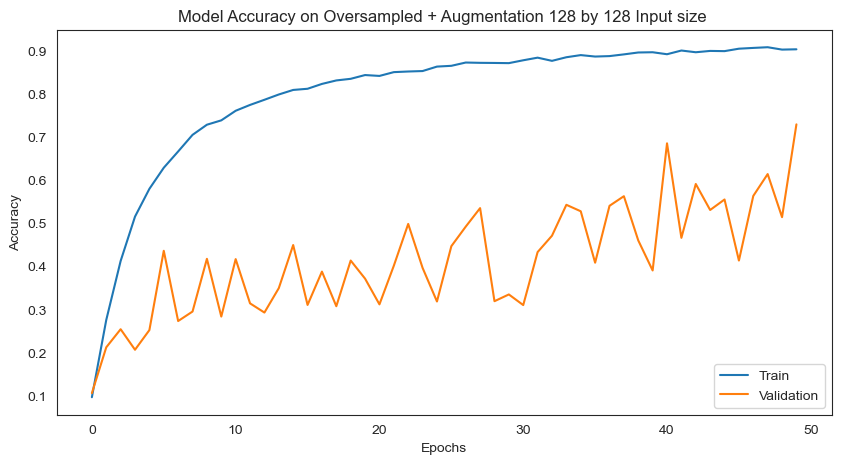

In [42]:

plt.figure(figsize=(10,5))

plt.title("Model Accuracy on Oversampled + Augmentation 128 by 128 Input size ")
plt.plot(model_b_SMOTE_aug_history.history['accuracy'], label='Train')
plt.plot(model_b_SMOTE_aug_history.history['val_accuracy'], label='Validation')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend(loc= 'lower right')
plt.show()

## Testing on Resampled Train set + Augmentation for 128 by 128 Images

In [129]:

model_b_resampled_aug_checkpoint = ModelCheckpoint("Models_CNN/checkpoint_b_aug_resampled.h5",
                                     monitor='val_accuracy',  
                                     save_best_only=True,
                                     verbose=1)
early_stopping = EarlyStopping(patience=5,monitor='validation_loss')
model_b_resampled_aug = clone_model(model_b_aug)
model_b_resampled_aug.compile(optimizer='adam',
                             loss='categorical_crossentropy',
                             metrics=["accuracy", "AUC", "Precision", "Recall"])
history_b_aug_resampled = model_b_resampled_aug.fit(train_generator_b_aug_resampled,
                                     validation_data=(val_generator_b),
                                     epochs=50,
                                     verbose=1, batch_size=32,callbacks=[model_b_resampled_aug_checkpoint]
                                     )

Epoch 1/50
448/448 [==============================] - ETA: 0s - loss: 2.7132 - accuracy: 0.0810 - auc: 0.5313 - precision: 0.2500 - recall: 1.3962e-04
Epoch 1: val_accuracy improved from -inf to 0.16367, saving model to Models_CNN\checkpoint_b_aug_resampled.h5
448/448 [==============================] - 18s 38ms/step - loss: 2.7132 - accuracy: 0.0810 - auc: 0.5313 - precision: 0.2500 - recall: 1.3962e-04 - val_loss: 2.5400 - val_accuracy: 0.1637 - val_auc: 0.6961 - val_precision: 1.0000 - val_recall: 0.0020
Epoch 2/50
447/448 [============================>.] - ETA: 0s - loss: 2.2415 - accuracy: 0.2715 - auc: 0.7794 - precision: 0.5827 - recall: 0.0382
Epoch 2: val_accuracy improved from 0.16367 to 0.33033, saving model to Models_CNN\checkpoint_b_aug_resampled.h5
448/448 [==============================] - 17s 37ms/step - loss: 2.2409 - accuracy: 0.2716 - auc: 0.7796 - precision: 0.5828 - recall: 0.0383 - val_loss: 1.9930 - val_accuracy: 0.3303 - val_auc: 0.8402 - val_precision: 0.5083 - 

### Train and Validation Accuracies
- we do indeed see quite a huge __performance increase__ by using __over-sampled train + augmentation__, as compared to just training the model on __train + augmentation__ 
- test accuracy of __0.95__
- however, we can notice that __validation accuracy__ tends to fluctuate a lot

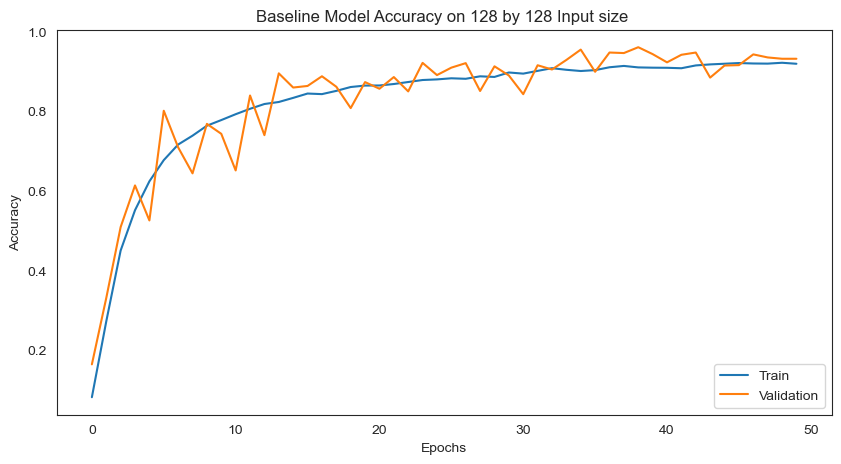

In [130]:

plt.figure(figsize=(10,5))

plt.title("Baseline Model Accuracy on 128 by 128 Input size ")
plt.plot(history_b_aug_resampled.history['accuracy'], label='Train')
plt.plot(history_b_aug_resampled.history['val_accuracy'], label='Validation')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend(loc= 'lower right')
plt.show()

In [132]:
predictions = model_b_resampled_aug.evaluate(images_b_test,labels_b_test)

94/94 [==============================] - 1s 10ms/step - loss: 0.1922 - accuracy: 0.9470 - auc: 0.9966 - precision: 0.9579 - recall: 0.9413


94/94 [==============================] - 1s 6ms/step


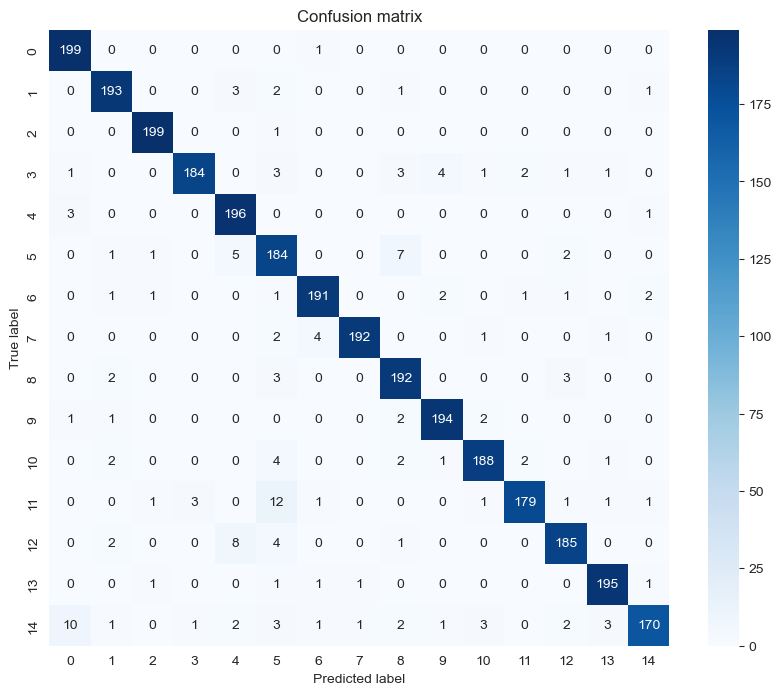

Classification Report
              precision    recall  f1-score   support

        Bean       0.93      0.99      0.96       200
Bitter_Gourd       0.95      0.96      0.96       200
Bottle_Gourd       0.98      0.99      0.99       200
     Brinjal       0.98      0.92      0.95       200
    Broccoli       0.92      0.98      0.95       200
     Cabbage       0.84      0.92      0.88       200
    Capsicum       0.96      0.95      0.96       200
      Carrot       0.99      0.96      0.97       200
 Cauliflower       0.91      0.96      0.94       200
    Cucumber       0.96      0.97      0.97       200
      Papaya       0.96      0.94      0.95       200
      Potato       0.97      0.90      0.93       200
     Pumpkin       0.95      0.93      0.94       200
      Radish       0.97      0.97      0.97       200
      Tomato       0.97      0.85      0.90       200

    accuracy                           0.95      3000
   macro avg       0.95      0.95      0.95      3000
weig

In [133]:
Confusion_Matrix_And_Report(model_b_resampled_aug,images_b_test,labels_b_test)

## Model Misclassification Analysis

94/94 [==============================] - 1s 6ms/step


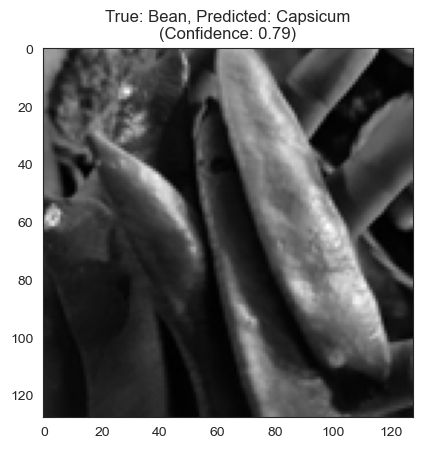

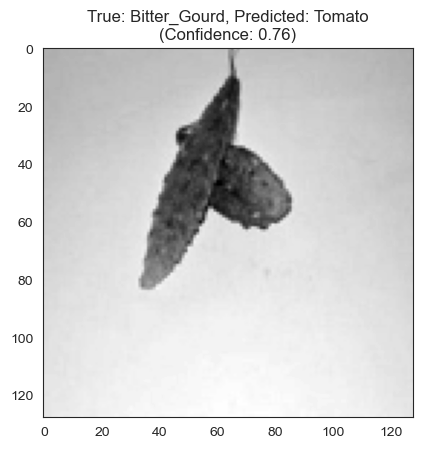

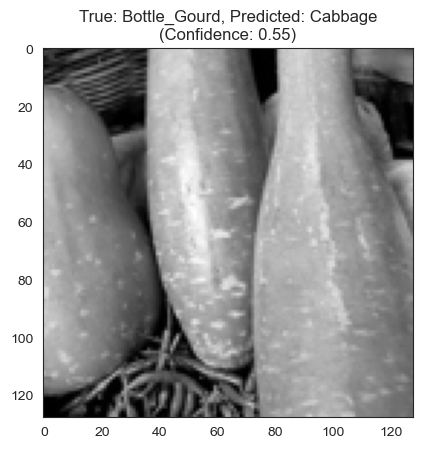

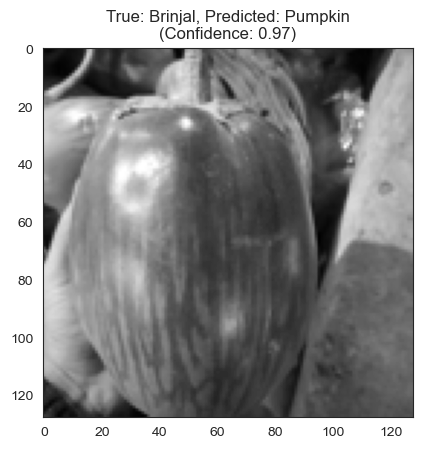

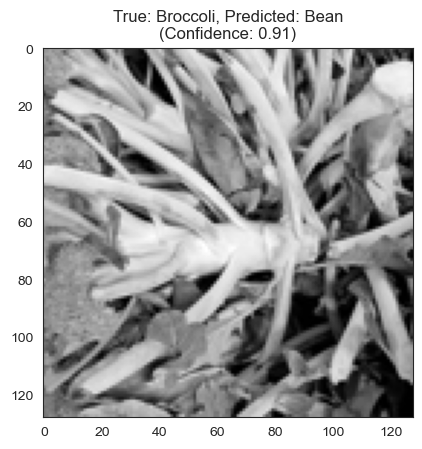

...

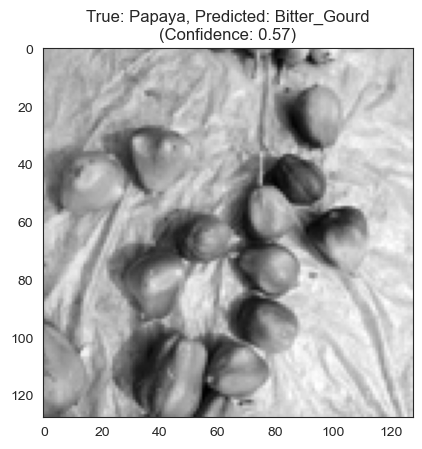

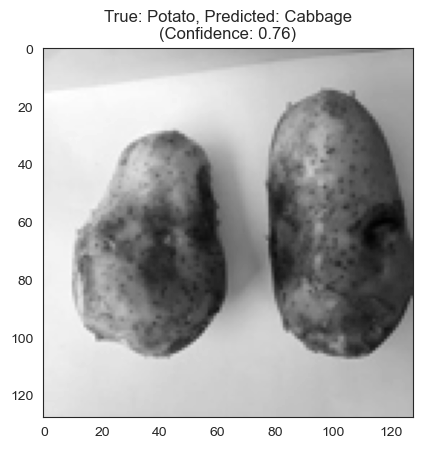

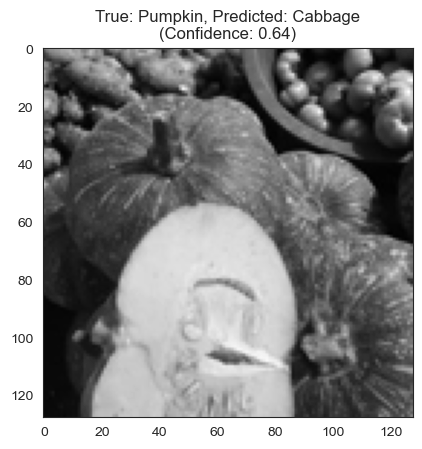

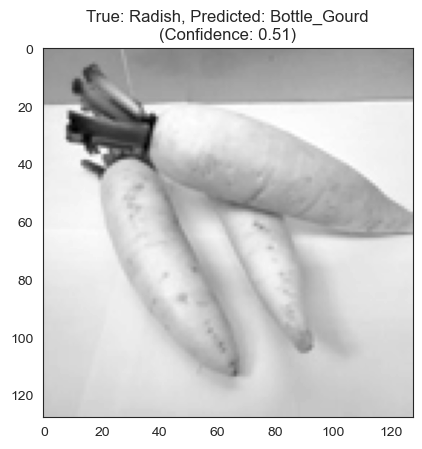

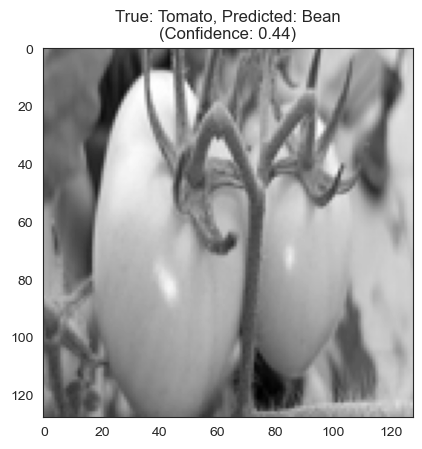

In [134]:

visualize_misclassifications(model_b_resampled_aug, images_b_test, labels_b_test)


## Conclusions of Data Augmentation on 128 by 128 Inputs
- In general, we can see that __Augmentation__ can benefit our __model's performance__, especially when using it together with the __Oversampled train set__
- However, the __validation accuracy__ fluctuates quite a lot, and we should try to deal with it, which could be due to __unsuitable augmentation methods__ applied, which we can try to tune

# Hyperparameter Tuning with RandomSearch - KerasTuner

## RandomSearch with KerasTuner (31 by 31)
- I would just be using the same no. of layers as our __Improved Baseline Model__ for Input size 31 by 31
- The hyperparameters involved in the optimization were: __Learning rate__ , __Activations__, __Dropout strength__, __Optimizer__ 


In [ ]:
# Define your model
def build_model_a(hp):
    model = Sequential([
        Conv2D(32, kernel_size=(3, 3), activation=hp.Choice('activation', values=['relu', 'leaky_relu']),
               input_shape=(31, 31, 1)),
        MaxPooling2D(pool_size=(2, 2)),
        Dropout(hp.Float('dropout_1', min_value=0.1, max_value=0.5, step=0.1)),
        Conv2D(64, kernel_size=(3, 3), activation=hp.Choice('activation', values=['relu', 'leaky_relu'])),
        MaxPooling2D(pool_size=(2, 2)),
        Dropout(hp.Float('dropout_2', min_value=0.1, max_value=0.5, step=0.1)),
        Conv2D(128, kernel_size=(3, 3), activation=hp.Choice('activation', values=['relu', 'leaky_relu'])),
        MaxPooling2D(pool_size=(2, 2)),
        Dropout(hp.Float('dropout_3', min_value=0.1, max_value=0.5, step=0.1)),
        Flatten(),
        Dense(128, activation=hp.Choice('activation', values=['relu', 'leaky_relu'])),
        Dropout(hp.Float('dropout_dense', min_value=0.1, max_value=0.5, step=0.1)),
        Dense(num_classes, activation="softmax")
    ])

    # Define optimizer with tunable learning rate
    optimizer = Adam(learning_rate=hp.Choice('learning_rate', values=[0.0005, 0.001, 0.005, 0.01]))

    model.compile(
        optimizer=optimizer,
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )

    return model

# Early stopping
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=5,
    restore_best_weights=True
)

# Instantiate the tuner
tuner_a = RandomSearch(
    build_model_a,
    objective='val_accuracy',
    max_trials=30,  # Adjust as needed
    directory='KerasTuner_dir/tuner_dir_a',
    project_name='my_tuner_a',
)

# Perform the random search
tuner_a.search(images_a_train_resampled, labels_a_train_resampled, validation_data=(images_a_val, labels_a_val), epochs=25, callbacks=[early_stopping])

# Get the best hyperparameters
best_hps = tuner_a.get_best_hyperparameters(num_trials=1)[0]

Trial 30 Complete [00h 01m 15s]
val_accuracy: 0.8880000114440918

Best val_accuracy So Far: 0.9123333096504211
Total elapsed time: 00h 27m 54s


In [137]:
tuner_a.results_summary()

Results summary
Results in KerasTuner_dir/tuner_dir_a\my_tuner_a
Showing 10 best trials
Objective(name="val_accuracy", direction="max")

Trial 28 summary
Hyperparameters:
activation: relu
dropout_1: 0.2
dropout_2: 0.2
dropout_3: 0.30000000000000004
dropout_dense: 0.2
learning_rate: 0.001
Score: 0.9123333096504211

Trial 01 summary
Hyperparameters:
activation: relu
dropout_1: 0.2
dropout_2: 0.1
dropout_3: 0.30000000000000004
dropout_dense: 0.1
learning_rate: 0.001
Score: 0.9086666703224182

Trial 10 summary
Hyperparameters:
activation: relu
dropout_1: 0.30000000000000004
dropout_2: 0.1
dropout_3: 0.2
dropout_dense: 0.2
learning_rate: 0.001
Score: 0.9073333144187927

Trial 18 summary
Hyperparameters:
activation: relu
dropout_1: 0.2
dropout_2: 0.5
dropout_3: 0.1
dropout_dense: 0.1
learning_rate: 0.001
Score: 0.9066666960716248

Trial 21 summary
Hyperparameters:
activation: relu
dropout_1: 0.2
dropout_2: 0.2
dropout_3: 0.30000000000000004
dropout_dense: 0.30000000000000004
learning_rate: 0

## Retraining Best Model

In [145]:
best_hps_a = tuner_a.get_best_hyperparameters(5)
model_a_best = build_model_a(best_hps_a[0])
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=5,
    restore_best_weights=True
)
checkpoint_model_a_best= ModelCheckpoint('Models/best_model_A.h5', monitor='val_accuracy', save_best_only=True, mode='max')

# Compile the model with the best hyperparameters
model_a_best.compile(
    optimizer=Adam(learning_rate=best_hps_a[0].get('learning_rate')),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

In [146]:
model_A = model_a_best.fit(images_a_train_resampled,labels_a_train_resampled,validation_data=(images_a_val,labels_a_val),epochs=50,callbacks=[early_stopping,checkpoint_model_a_best])

Epoch 1/50


448/448 [==============================] - 4s 8ms/step - loss: 2.4799 - accuracy: 0.1708 - val_loss: 2.0628 - val_accuracy: 0.3407
Epoch 2/50
448/448 [==============================] - 4s 8ms/step - loss: 1.8861 - accuracy: 0.3937 - val_loss: 1.5457 - val_accuracy: 0.5067
Epoch 3/50
448/448 [==============================] - 3s 8ms/step - loss: 1.4944 - accuracy: 0.5274 - val_loss: 1.2279 - val_accuracy: 0.6213
Epoch 4/50
448/448 [==============================] - 3s 7ms/step - loss: 1.2347 - accuracy: 0.6064 - val_loss: 1.0439 - val_accuracy: 0.6817
Epoch 5/50
448/448 [==============================] - 3s 7ms/step - loss: 1.0545 - accuracy: 0.6594 - val_loss: 0.8527 - val_accuracy: 0.7373
Epoch 6/50
448/448 [==============================] - 4s 8ms/step - loss: 0.9122 - accuracy: 0.7072 - val_loss: 0.7577 - val_accuracy: 0.7637
Epoch 7/50
448/448 [==============================] - 3s 7ms/step - loss: 0.8092 - accuracy: 0.7413 - val_loss: 0.6804 - val_accuracy: 0.7987
Epoch 8/50
448/44

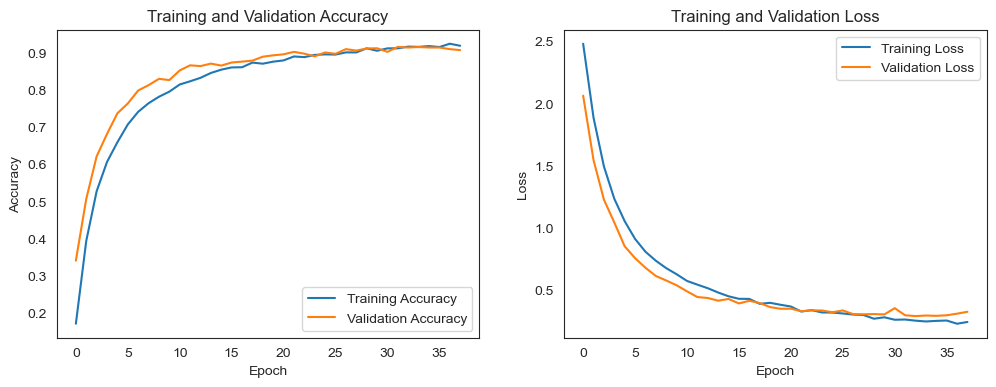

In [147]:
# Assuming model_RS_aug is your Keras model and you've trained it using the fit method
history = model_A.history  # Assign the correct history object

# Plot training and validation accuracy
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history['accuracy'], label='Training Accuracy')
plt.plot(history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

# Plot training and validation loss
plt.subplot(1, 2, 2)
plt.plot(history['loss'], label='Training Loss')
plt.plot(history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.show()

## Looking At Confusion Matrix & Classification Report
- Test Accuracy of __0.91__, not a huge increase from out __Improved baseline model__


57/94 [=================>............] - ETA: 0s

94/94 [==============================] - 0s 3ms/step


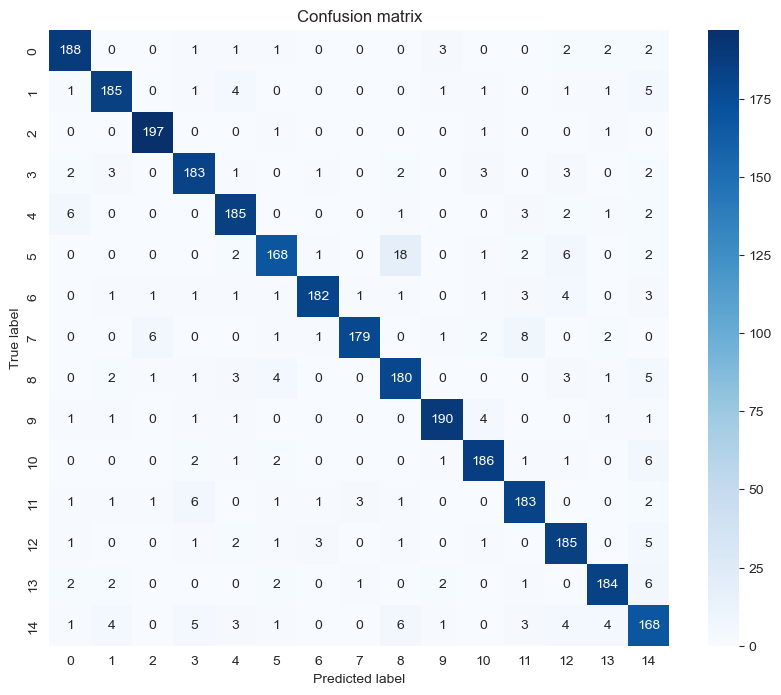

Classification Report
              precision    recall  f1-score   support

        Bean       0.93      0.94      0.93       200
Bitter_Gourd       0.93      0.93      0.93       200
Bottle_Gourd       0.96      0.98      0.97       200
     Brinjal       0.91      0.92      0.91       200
    Broccoli       0.91      0.93      0.92       200
     Cabbage       0.92      0.84      0.88       200
    Capsicum       0.96      0.91      0.94       200
      Carrot       0.97      0.90      0.93       200
 Cauliflower       0.86      0.90      0.88       200
    Cucumber       0.95      0.95      0.95       200
      Papaya       0.93      0.93      0.93       200
      Potato       0.90      0.92      0.91       200
     Pumpkin       0.88      0.93      0.90       200
      Radish       0.93      0.92      0.93       200
      Tomato       0.80      0.84      0.82       200

    accuracy                           0.91      3000
   macro avg       0.92      0.91      0.91      3000
weig

In [159]:
Confusion_Matrix_And_Report(model_a_best,images_a_test,labels_a_test)

## Analyzing Misclassifications

 1/94 [..............................] - ETA: 1s

94/94 [==============================] - 0s 4ms/step


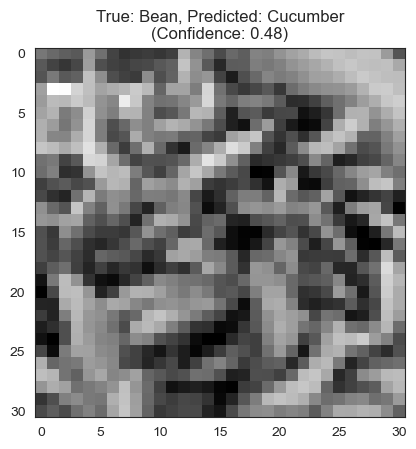

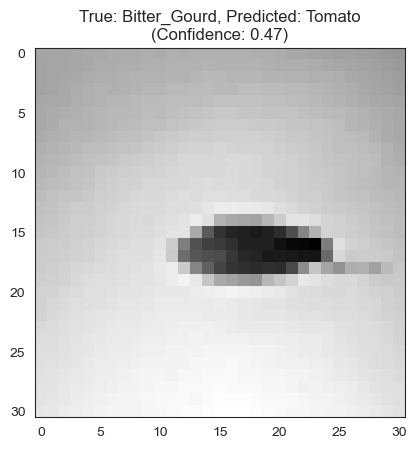

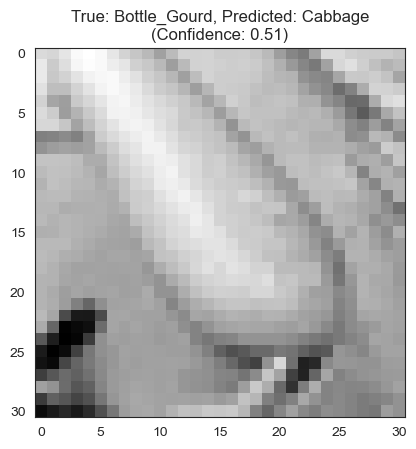

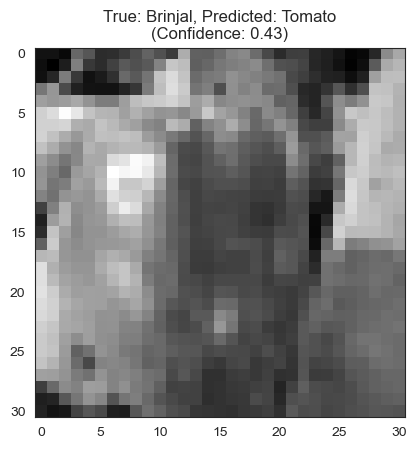

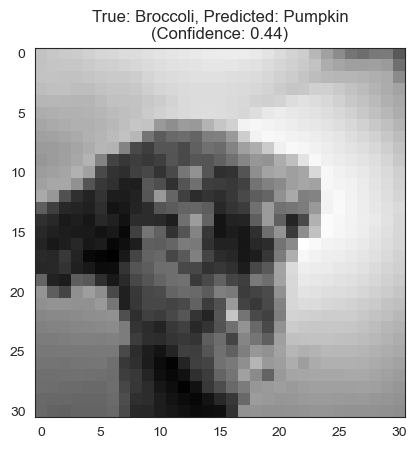

...

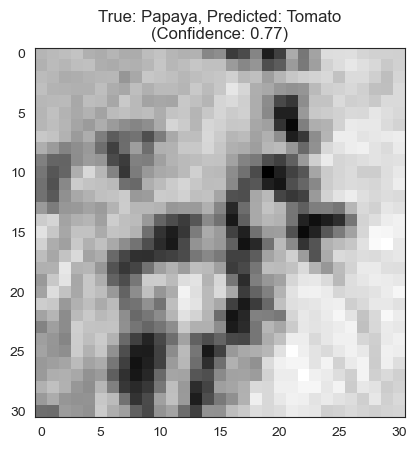

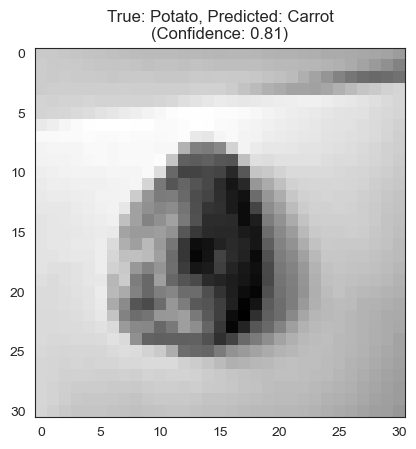

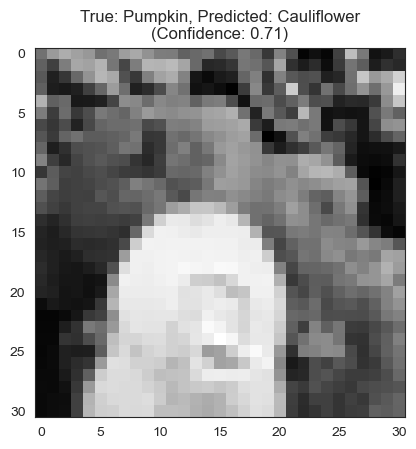

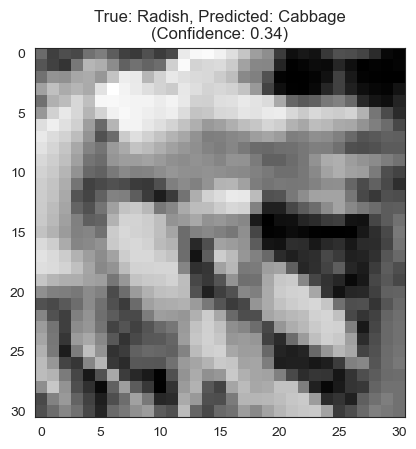

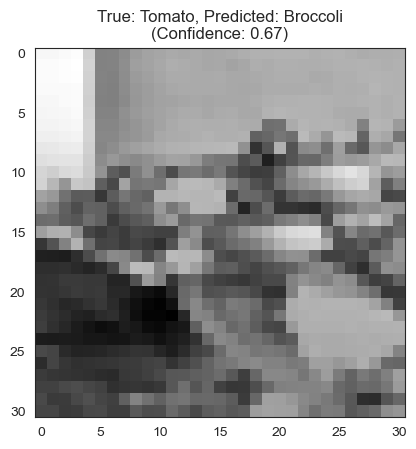

In [157]:
visualize_misclassifications(model_a_best,images_a_test,labels_a_test,31)

## Trying RandomSearch with Augmentation

In [99]:
def build_model_a_aug(hp):
    # Data augmentation parameters
    data_augmentation = hp.Boolean('data_augmentation', default=False)
    rotation_range = hp.Float('rotation_range', min_value=0.0, max_value=180.0, default=0.0)
    width_shift_range = hp.Float('width_shift_range', min_value=0.0, max_value=1.0, default=0.0)
    height_shift_range = hp.Float('height_shift_range', min_value=0.0, max_value=1.0, default=0.0)
    horizontal_flip = hp.Boolean('horizontal_flip', default=False)
    
    if data_augmentation:
        # Create an ImageDataGenerator with the specified augmentation parameters
        datagen = ImageDataGenerator(
            rotation_range=rotation_range,
            width_shift_range=width_shift_range,
            height_shift_range=height_shift_range,
            horizontal_flip=horizontal_flip
        )
    else:
        datagen = None
    
    model = Sequential()

    # Convolutional layers
    model.add(Conv2D(32, input_shape=(31,31, 1), kernel_size=(3, 3), activation=hp.Choice('activation', values=['relu', 'LeakyReLU'])))
    model.add(MaxPooling2D(pool_size=(2, 2)))
    
    # Tunable dropout rate
    dropout_rate_input = hp.Float('dropout_rate_input', min_value=0.1, max_value=0.4, step=0.1)
    model.add(Dropout(dropout_rate_input))
    
    nodes = 0

    # Additional convolutional layers based on the 'layers' parameter
    for i in range(hp.Int('num_layers', min_value=1, max_value=3, step=1)):
        nodes = hp.Int(f'layer_{i}_nodes', min_value=32, max_value=128, step=32)
        activation = hp.Choice('activation', values=['relu', 'LeakyReLU'])
        leaky_rate = hp.Float(f'leaky_rate_{i}', min_value=0.01, max_value=0.1, step=0.05)

        if activation == 'LeakyReLU':
            model.add(Conv2D(nodes, kernel_size=(3, 3)))
            model.add(LeakyReLU(alpha=leaky_rate))
        else:
            # Add a conditional statement to check spatial dimensions
            if model.output_shape[1] >= 3 and model.output_shape[2] >= 3:
                model.add(Conv2D(nodes, kernel_size=(3, 3), activation=activation))
                model.add(MaxPooling2D(pool_size=(2, 2)))
                # Tunable dropout rate for convolutional layers
                dropout_rate_conv = hp.Float(f'dropout_rate_conv_{i}', min_value=0.0, max_value=0.4, step=0.1)
                model.add(Dropout(dropout_rate_conv))
            else:
                break  # Stop adding layers if dimensions are too small

    # Flatten and fully connected layers
    model.add(Flatten())
    
    # Tunable dropout rate for fully connected layers
    dropout_rate_fc = hp.Float('dropout_rate_fc', min_value=0.0, max_value=0.4, step=0.1)
    model.add(Dropout(dropout_rate_fc))
    
    model.add(Dense(nodes, activation=hp.Choice('activation', values=['relu', 'LeakyReLU'])))
    
    # Tunable dropout rate before the output layer
    dropout_rate_output = hp.Float('dropout_rate_output', min_value=0.1, max_value=0.4, step=0.1)
    model.add(Dropout(dropout_rate_input))
    
    # Tunable learning rate
    learning_rate = hp.Choice('learning_rate', values=[1e-2, 1e-3, 1e-4])
    
    model.add(Dense(15, activation='softmax'))

    model.compile(
        optimizer=keras.optimizers.Adam(learning_rate=learning_rate),
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )

    return model

early_stopping = EarlyStopping(
    monitor='val_loss', 
    patience=5, 
    restore_best_weights=True
)
tuneraugA = RandomSearch(
    build_model_a_aug,
    objective='val_accuracy',
    max_trials=20,  # Adjust as needed
    directory='tuner_dir_augA',
    project_name='my_tuner_augA_3'
    callbacks=[early_stopping] 
)

tuneraugA.search(images_a_train_resampled, labels_a_train_resampled, validation_data=(images_a_val,labels_a_val), epochs=20)
best_modelaugA = tuneraugA.get_best_models(num_models=1)[0]

K.clear_session()


Trial 20 Complete [00h 00m 54s]
val_accuracy: 0.06666667014360428

Best val_accuracy So Far: 0.8933333158493042
Total elapsed time: 00h 16m 32s


In [100]:
tuneraugA.results_summary()

Results summary
Results in tuner_dir_augA\my_tuner_augA_3
Showing 10 best trials
Objective(name="val_accuracy", direction="max")

Trial 16 summary
Hyperparameters:
data_augmentation: True
rotation_range: 122.68160916707953
width_shift_range: 0.4834766812862441
height_shift_range: 0.4647995453554201
horizontal_flip: False
activation: relu
dropout_rate_input: 0.4
num_layers: 2
layer_0_nodes: 64
leaky_rate_0: 0.08
dropout_rate_conv_0: 0.1
dropout_rate_fc: 0.0
dropout_rate_output: 0.2
learning_rate: 0.001
layer_1_nodes: 128
leaky_rate_1: 0.04
dropout_rate_conv_1: 0.30000000000000004
layer_2_nodes: 32
leaky_rate_2: 0.05
Score: 0.8933333158493042

Trial 04 summary
Hyperparameters:
data_augmentation: False
rotation_range: 75.26457539121026
width_shift_range: 0.9652005732069636
height_shift_range: 0.06391871243817782
horizontal_flip: True
activation: LeakyReLU
dropout_rate_input: 0.2
num_layers: 3
layer_0_nodes: 64
leaky_rate_0: 0.06999999999999999
dropout_rate_conv_0: 0.1
dropout_rate_fc: 0.3

### Visualizing the Architecture of Best Model
- Total of abt __3 Convolution & Max Pooling__ layers, which is closely similar to when we tried improving the __Model A__ earlier __without RandomSearch__

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 29, 29, 32)        320       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 14, 14, 32)       0         
 )                                                               
                                                                 
 dropout (Dropout)           (None, 14, 14, 32)        0         
                                                                 
 conv2d_1 (Conv2D)           (None, 12, 12, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 6, 6, 64)         0         
 2D)                                                             
                                                                 
 dropout_1 (Dropout)         (None, 6, 6, 64)          0

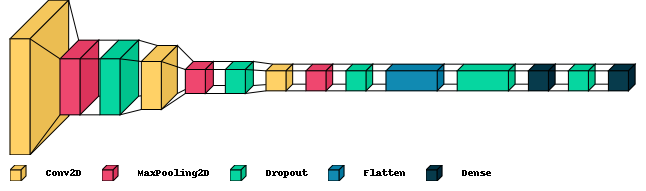

In [102]:
best_modelaugA.summary()

# Visualizing layers of Neural Network using plot_model
#display(plot_model(best_model3, show_shapes=True, show_layer_names=True))

# Using visualkeras

display(visualkeras.layered_view(best_modelaugA, spacing=20, legend=True))

### Evaluate On Test set

In [101]:
# Evaluate the best model on test data
test_loss, test_acc = best_modelaugA.evaluate(images_a_test, labels_a_test)
print(f'Test accuracy: {test_acc}')

94/94 [==============================] - 0s 3ms/step - loss: 0.3420 - accuracy: 0.8933
Test accuracy: 0.8933333158493042


## Conclusions for Hyperparameter Tunning 31 by 31 Input Size
- It's possible that when we performed __RandomSearch__ on __train set with augmentation__, there are too many possible values/ hyperparameters defined, making it hard to pinpoint a __decent model__
- Easier to stick with our __Model Architecture__ from the __Improved Baseline Model__, since it already deals with __overfitting__ well enough (convergence), which helps narrow down the no. of __hyperparameters & values__ to tune

## RandomSearch with Data Augmentation (128 by 128)
- Here, i wanted to try out:
    - __kernel Regularization (L1 & L2)__ instead of just using __Dropout layers__
    - __Number of Nodes__
    - __Activations__: relu, leakyrelu
    - __No. of Layers__


## Augmentation + Oversampled

In [160]:
def reg_wrapper(reg_type, reg_value):
    if reg_type == 'l1':
        return l1(reg_value)
    elif reg_type == 'l2':
        return l2(reg_value)
    else:
        return None

def build_model_b_aug_kernel_regularizer(hp):
    model = Sequential()
    model.add(Conv2D(32, input_shape=(128, 128, 1), kernel_size=(3, 3), activation=hp.Choice('activation', values=['relu', 'LeakyReLU'])))
    model.add(MaxPooling2D(pool_size=(2, 2)))
    # Convolutional layers
    for i in range(hp.Int('num_layers', min_value=1, max_value=3, step=1)):
        nodes = hp.Int(f'layer_{i}_nodes', min_value=32, max_value=128, step=32)
        kernel_size = hp.Int('kernel_size', min_value=3, max_value=5, step=2)
        
        # Use Boolean to indicate whether to use regularization or not
        use_regularization = hp.Boolean(f'use_regularization_{i}', default=False)

        if use_regularization:
            # Randomly choose a kernel regularizer type
            reg_type = hp.Choice(f'regularizer_{i}_type', values=['l1', 'l2'])
            # Randomly choose a kernel regularizer value
            reg_value = hp.Float(f'regularizer_{i}_value', min_value=1e-5, max_value=1e-2, sampling='log')
            
            regularizer = reg_wrapper(reg_type, reg_value)
        else:
            regularizer = None

        activation = hp.Choice(f'activation_{i}', values=['relu', 'LeakyReLU'])
        leaky_rate = hp.Float(f'leaky_rate_{i}', min_value=0.01, max_value=0.1, step=0.01)

        if activation == 'LeakyReLU':
            model.add(Conv2D(nodes, kernel_size=(kernel_size, kernel_size), kernel_regularizer=regularizer))
            model.add(LeakyReLU(alpha=leaky_rate))
        else:
            model.add(Conv2D(nodes, kernel_size=(kernel_size, kernel_size), activation=activation, kernel_regularizer=regularizer))

        model.add(MaxPooling2D(pool_size=(2, 2)))

    # Flatten and fully connected layers
    model.add(Flatten())
    
    # Fully connected layers with regularizers
    for i in range(hp.Int('num_fc_layers', min_value=1, max_value=3, step=1)):
        fc_nodes = hp.Int(f'fc_layer_{i}_nodes', min_value=32, max_value=128, step=32)
        
        # Use Boolean to indicate whether to use regularization or not for fully connected layers
        fc_use_regularization = hp.Boolean(f'fc_use_regularization_{i}', default=False)

        if fc_use_regularization:
            # Randomly choose a kernel regularizer type for fully connected layers
            fc_reg_type = hp.Choice(f'fc_regularizer_{i}_type', values=['l1', 'l2'])
            # Randomly choose a kernel regularizer value for fully connected layers
            fc_reg_value = hp.Float(f'fc_regularizer_{i}_value', min_value=1e-5, max_value=1e-2, sampling='log')
            
            fc_regularizer = reg_wrapper(fc_reg_type, fc_reg_value)
        else:
            fc_regularizer = None

        fc_activation = hp.Choice(f'fc_activation_{i}', values=['relu', 'LeakyReLU'])
        fc_leaky_rate = hp.Float(f'fc_leaky_rate_{i}', min_value=0.01, max_value=0.1, step=0.01)

        if fc_activation == 'LeakyReLU':
            model.add(Dense(fc_nodes, activation=None, kernel_regularizer=fc_regularizer))
            model.add(LeakyReLU(alpha=fc_leaky_rate))
        else:
            model.add(Dense(fc_nodes, activation=fc_activation, kernel_regularizer=fc_regularizer))

    # Output layer
    model.add(Dense(15, activation='softmax'))

    model.compile(
        optimizer=hp.Choice('optimizer', values=['adam']),
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )

    return model

# Callbacks
# Define the ModelCheckpoint callback
#checkpoint = ModelCheckpoint('Models/best_model_RS_aug.h5', monitor='val_accuracy', save_best_only=True, mode='max')

# Early stopping
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=5,
    restore_best_weights=True
)

tuneraug5 = RandomSearch(
    build_model_b_aug_kernel_regularizer,
    objective='val_accuracy',
    max_trials=30,  # Adjust as needed
    directory='Keras_Tunner_dir/tuner_diraug5',
    project_name='my_tuner_aug',
)

tuneraug5.search(train_generator_b_aug_resampled, validation_data=(val_generator_b), epochs=20, callbacks=[early_stopping])

best_modelaug5 = tuneraug5.get_best_models(num_models=1)[0]

K.clear_session()

Trial 17 Complete [00h 05m 48s]
val_accuracy: 0.8636666536331177

Best val_accuracy So Far: 0.937666654586792
Total elapsed time: 01h 31m 51s

Search: Running Trial #18

Value             |Best Value So Far |Hyperparameter
relu              |relu              |activation
2                 |2                 |num_layers
128               |96                |layer_0_nodes
5                 |3                 |kernel_size
False             |True              |use_regularization_0
relu              |relu              |activation_0
0.03              |0.06              |leaky_rate_0
3                 |1                 |num_fc_layers
64                |128               |fc_layer_0_nodes
True              |False             |fc_use_regularization_0
relu              |relu              |fc_activation_0
0.05              |0.06              |fc_leaky_rate_0
adam              |adam              |optimizer
64                |64                |layer_1_nodes
False             |False             |u

KeyboardInterrupt: 

## Retraining the Best Model 

In [164]:
tuneraug5.results_summary()

Results summary
Results in Keras_Tunner_dir/tuner_diraug5\my_tuner_aug
Showing 10 best trials
Objective(name="val_accuracy", direction="max")

Trial 08 summary
Hyperparameters:
activation: relu
num_layers: 2
layer_0_nodes: 96
kernel_size: 3
use_regularization_0: True
activation_0: relu
leaky_rate_0: 0.060000000000000005
num_fc_layers: 1
fc_layer_0_nodes: 128
fc_use_regularization_0: False
fc_activation_0: relu
fc_leaky_rate_0: 0.060000000000000005
optimizer: adam
layer_1_nodes: 64
use_regularization_1: False
activation_1: LeakyReLU
leaky_rate_1: 0.08
layer_2_nodes: 32
use_regularization_2: True
activation_2: LeakyReLU
leaky_rate_2: 0.06999999999999999
fc_layer_1_nodes: 128
fc_use_regularization_1: True
fc_activation_1: relu
fc_leaky_rate_1: 0.05
fc_layer_2_nodes: 96
fc_use_regularization_2: False
fc_activation_2: relu
fc_leaky_rate_2: 0.04
regularizer_0_type: l2
regularizer_0_value: 7.198385566226289e-05
fc_regularizer_1_type: l2
fc_regularizer_1_value: 0.003042866783260263
fc_regulari

In [161]:
best_hps = tuneraug5.get_best_hyperparameters(5)
model_aug_b_5 = build_model_b_aug_kernel_regularizer(best_hps[0])
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=5,
    restore_best_weights=True
)
checkpoint_aug_RS_b = ModelCheckpoint('Models/best_model_RS_aug_b.h5', monitor='val_accuracy', save_best_only=True, mode='max')


In [166]:
model_RS_aug = model_aug_b_5.fit(train_generator_b_aug_resampled,validation_data=(val_generator_b),epochs=40,callbacks=[early_stopping,checkpoint_aug_RS_b])

Epoch 1/40


448/448 [==============================] - 17s 37ms/step - loss: 2.1000 - accuracy: 0.3160 - val_loss: 2.2249 - val_accuracy: 0.3583
Epoch 2/40
448/448 [==============================] - 17s 38ms/step - loss: 1.3597 - accuracy: 0.5668 - val_loss: 1.4005 - val_accuracy: 0.5997
Epoch 3/40
448/448 [==============================] - 19s 43ms/step - loss: 0.9568 - accuracy: 0.6983 - val_loss: 1.5250 - val_accuracy: 0.6083
Epoch 4/40
448/448 [==============================] - 18s 40ms/step - loss: 0.7653 - accuracy: 0.7559 - val_loss: 0.8306 - val_accuracy: 0.7520
Epoch 5/40
448/448 [==============================] - 17s 39ms/step - loss: 0.6188 - accuracy: 0.8008 - val_loss: 0.9759 - val_accuracy: 0.7367
Epoch 6/40
448/448 [==============================] - 18s 39ms/step - loss: 0.5333 - accuracy: 0.8312 - val_loss: 0.8907 - val_accuracy: 0.7563
Epoch 7/40
448/448 [==============================] - 17s 38ms/step - loss: 0.4714 - accuracy: 0.8524 - val_loss: 0.9003 - val_accuracy: 0.7487
Epo

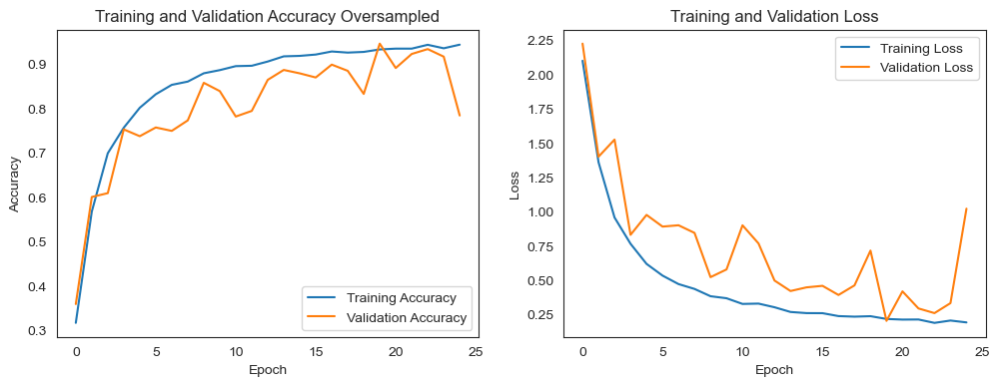

In [172]:

history = model_RS_aug.history  

# Plot training and validation accuracy
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history['accuracy'], label='Training Accuracy')
plt.plot(history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy Oversampled')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

# Plot training and validation loss
plt.subplot(1, 2, 2)
plt.plot(history['loss'], label='Training Loss')
plt.plot(history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.show()

### Loading Best Model from  RandomSearch

In [168]:
model_RS_aug_b = load_model('Models/best_model_RS_aug_b.h5')

In [170]:
# Evaluate the best model on test data
test_loss, test_acc = model_RS_aug_b.evaluate(images_b_test, labels_b_test)
print(f'Test accuracy: {test_acc}')

94/94 [==============================] - 1s 7ms/step - loss: 0.1428 - accuracy: 0.9613
Test accuracy: 0.9613333344459534


## Looking at Confusion Matrix & Classification Report
- Test accuracy of ~0.94, which is actually __very close / not an improvement__ to our previous model trained on __Oversampled train + Augmentation__ which also got around __0.95__ accuracy

94/94 [==============================] - 1s 6ms/step


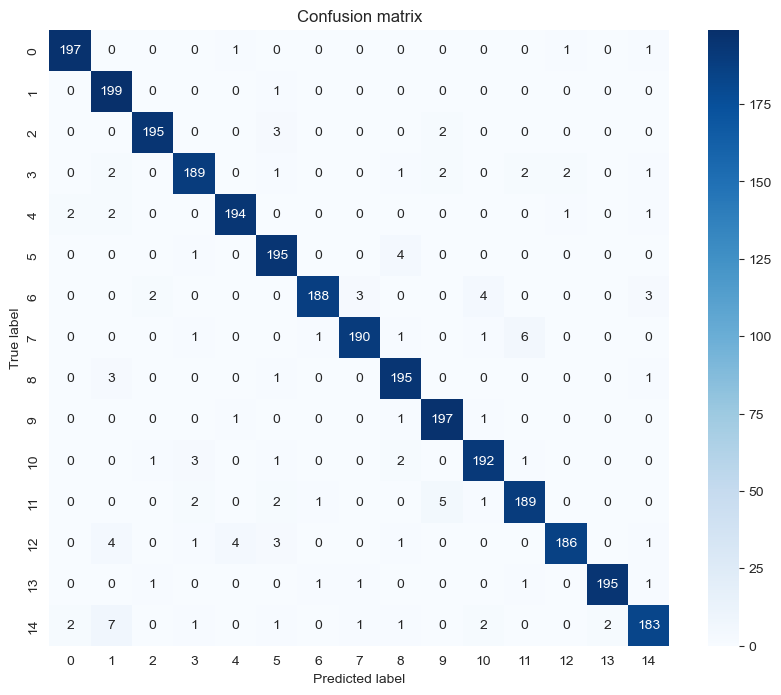

Classification Report
              precision    recall  f1-score   support

        Bean       0.98      0.98      0.98       200
Bitter_Gourd       0.92      0.99      0.95       200
Bottle_Gourd       0.98      0.97      0.98       200
     Brinjal       0.95      0.94      0.95       200
    Broccoli       0.97      0.97      0.97       200
     Cabbage       0.94      0.97      0.96       200
    Capsicum       0.98      0.94      0.96       200
      Carrot       0.97      0.95      0.96       200
 Cauliflower       0.95      0.97      0.96       200
    Cucumber       0.96      0.98      0.97       200
      Papaya       0.96      0.96      0.96       200
      Potato       0.95      0.94      0.95       200
     Pumpkin       0.98      0.93      0.95       200
      Radish       0.99      0.97      0.98       200
      Tomato       0.95      0.92      0.93       200

    accuracy                           0.96      3000
   macro avg       0.96      0.96      0.96      3000
weig

In [171]:
Confusion_Matrix_And_Report(model_RS_aug_b,images_b_test,labels_b_test)

## Augmentation without oversampling

In [15]:
def reg_wrapper(reg_type, reg_value):
    if reg_type == 'l1':
        return l1(reg_value)
    elif reg_type == 'l2':
        return l2(reg_value)
    else:
        return None

def build_model_b_aug_kernel_regularizer(hp):
    model = Sequential()
    model.add(Conv2D(32, input_shape=(128, 128, 1), kernel_size=(3, 3), activation=hp.Choice('activation', values=['relu', 'LeakyReLU'])))
    model.add(MaxPooling2D(pool_size=(2, 2)))
    # Convolutional layers
    for i in range(hp.Int('num_layers', min_value=1, max_value=3, step=1)):
        nodes = hp.Int(f'layer_{i}_nodes', min_value=32, max_value=128, step=32)
        kernel_size = hp.Int('kernel_size', min_value=3, max_value=5, step=2)
        
        # Use Boolean to indicate whether to use regularization or not
        use_regularization = hp.Boolean(f'use_regularization_{i}', default=False)

        if use_regularization:
            # Randomly choose a kernel regularizer type
            reg_type = hp.Choice(f'regularizer_{i}_type', values=['l1', 'l2'])
            # Randomly choose a kernel regularizer value
            reg_value = hp.Float(f'regularizer_{i}_value', min_value=1e-5, max_value=1e-2, sampling='log')
            
            regularizer = reg_wrapper(reg_type, reg_value)
        else:
            regularizer = None

        activation = hp.Choice(f'activation_{i}', values=['relu', 'LeakyReLU'])
        leaky_rate = hp.Float(f'leaky_rate_{i}', min_value=0.01, max_value=0.1, step=0.01)

        if activation == 'LeakyReLU':
            model.add(Conv2D(nodes, kernel_size=(kernel_size, kernel_size), kernel_regularizer=regularizer))
            model.add(LeakyReLU(alpha=leaky_rate))
        else:
            model.add(Conv2D(nodes, kernel_size=(kernel_size, kernel_size), activation=activation, kernel_regularizer=regularizer))

        model.add(MaxPooling2D(pool_size=(2, 2)))

    # Flatten and fully connected layers
    model.add(Flatten())
    
    # Fully connected layers with regularizers
    for i in range(hp.Int('num_fc_layers', min_value=1, max_value=3, step=1)):
        fc_nodes = hp.Int(f'fc_layer_{i}_nodes', min_value=32, max_value=128, step=32)
        
        # Use Boolean to indicate whether to use regularization or not for fully connected layers
        fc_use_regularization = hp.Boolean(f'fc_use_regularization_{i}', default=False)

        if fc_use_regularization:
            # Randomly choose a kernel regularizer type for fully connected layers
            fc_reg_type = hp.Choice(f'fc_regularizer_{i}_type', values=['l1', 'l2'])
            # Randomly choose a kernel regularizer value for fully connected layers
            fc_reg_value = hp.Float(f'fc_regularizer_{i}_value', min_value=1e-5, max_value=1e-2, sampling='log')
            
            fc_regularizer = reg_wrapper(fc_reg_type, fc_reg_value)
        else:
            fc_regularizer = None

        fc_activation = hp.Choice(f'fc_activation_{i}', values=['relu', 'LeakyReLU'])
        fc_leaky_rate = hp.Float(f'fc_leaky_rate_{i}', min_value=0.01, max_value=0.1, step=0.01)

        if fc_activation == 'LeakyReLU':
            model.add(Dense(fc_nodes, activation=None, kernel_regularizer=fc_regularizer))
            model.add(LeakyReLU(alpha=fc_leaky_rate))
        else:
            model.add(Dense(fc_nodes, activation=fc_activation, kernel_regularizer=fc_regularizer))

    # Output layer
    model.add(Dense(15, activation='softmax'))

    model.compile(
        optimizer=hp.Choice('optimizer', values=['adam']),
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )

    return model

# Callbacks
# Define the ModelCheckpoint callback
checkpoint = ModelCheckpoint('Models/best_model_RS_aug.h5', monitor='val_accuracy', save_best_only=True, mode='max')

# Early stopping
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=5,
    restore_best_weights=True
)

tuneraug4 = RandomSearch(
    build_model_b_aug_kernel_regularizer,
    objective='val_accuracy',
    max_trials=30,  # Adjust as needed
    directory='tuner_diraug6',
    project_name='my_tuner_aug',
)

tuneraug4.search(train_generator_b_aug, validation_data=(val_generator_b), epochs=20, callbacks=[early_stopping, checkpoint])

best_modelaug4 = tuneraug4.get_best_models(num_models=1)[0]

K.clear_session()


Trial 30 Complete [00h 07m 10s]
val_accuracy: 0.6346666812896729

Best val_accuracy So Far: 0.8980000019073486
Total elapsed time: 04h 07m 41s


### Model Architecture

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 126, 126, 32)      320       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 63, 63, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 61, 61, 128)       36992     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 30, 30, 128)      0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 28, 28, 96)        110688    
                                                                 
 leaky_re_lu_1 (LeakyReLU)   (None, 28, 28, 96)        0

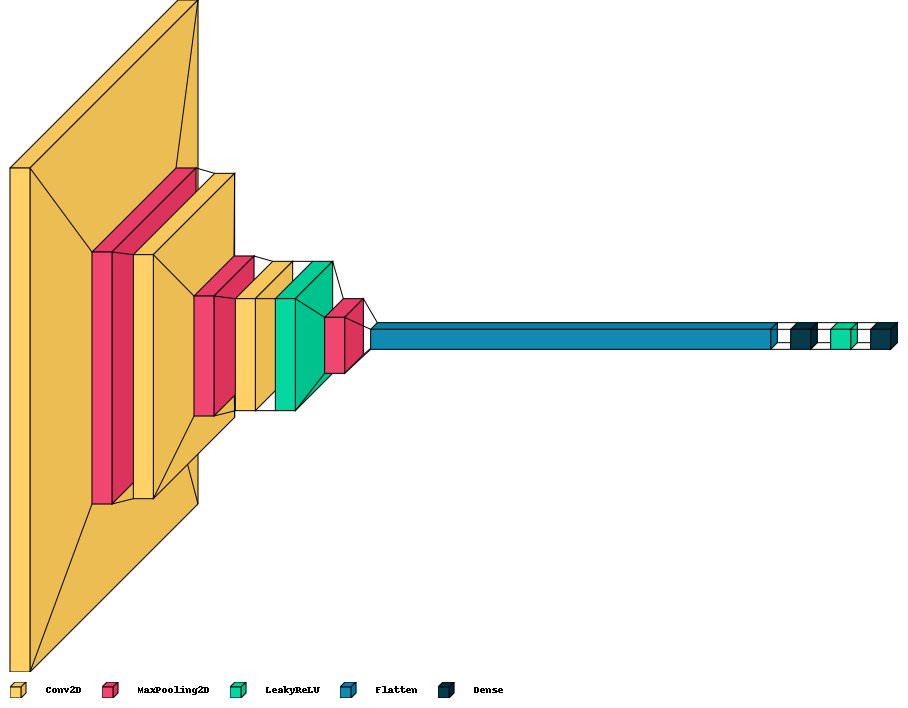

In [75]:
best_modelaug4.summary()

# Visualizing layers of Neural Network using plot_model
#display(plot_model(best_model3, show_shapes=True, show_layer_names=True))

# Using visualkeras

display(visualkeras.layered_view(best_modelaug4, spacing=20, legend=True))

### Get best hyperparams/configs of the best model

In [ ]:
# Get the best trial
best_trial = tuneraug4.oracle.get_best_trials(1)[0]

# Get the best hyperparameters from the best trial
best_hyperparameters2 = best_trial.hyperparameters.values
best_hyperparameters2

{'activation': 'LeakyReLU',
 'num_layers': 2,
 'layer_0_nodes': 128,
 'kernel_size': 3,
 'use_regularization_0': True,
 'activation_0': 'relu',
 'leaky_rate_0': 0.060000000000000005,
 'num_fc_layers': 1,
 'fc_layer_0_nodes': 32,
 'fc_use_regularization_0': True,
 'fc_activation_0': 'LeakyReLU',
 'fc_leaky_rate_0': 0.02,
 'optimizer': 'adam',
 'layer_1_nodes': 96,
 'use_regularization_1': False,
 'activation_1': 'LeakyReLU',
 'leaky_rate_1': 0.01,
 'regularizer_0_type': 'l2',
 'regularizer_0_value': 7.408586854291227e-05,
 'fc_regularizer_0_type': 'l2',
 'fc_regularizer_0_value': 0.0001494790018886696,
 'fc_layer_1_nodes': 32,
 'fc_use_regularization_1': False,
 'fc_activation_1': 'relu',
 'fc_leaky_rate_1': 0.03,
 'fc_regularizer_1_type': 'l2',
 'fc_regularizer_1_value': 0.00678176549630065,
 'fc_layer_2_nodes': 96,
 'fc_use_regularization_2': True,
 'fc_activation_2': 'LeakyReLU',
 'fc_leaky_rate_2': 0.08,
 'regularizer_1_type': 'l2',
 'regularizer_1_value': 0.00014667650517037235,
 '

## Retraining the Best Model 

In [69]:
best_hps = tuneraug4.get_best_hyperparameters(5)
model_aug = build_model_b_aug_kernel_regularizer(best_hps[0])
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=5,
    restore_best_weights=True
)
checkpoint_aug_RS = ModelCheckpoint('Models/best_model_RS_aug.h5', monitor='val_accuracy', save_best_only=True, mode='max')
checkpoint_aug_RS_cw = ModelCheckpoint('Models/best_model_RS_aug_cw.h5', monitor='val_accuracy', save_best_only=True, mode='max')


In [59]:
model_RS_aug = model_aug.fit(train_generator_b_aug,validation_data=(val_generator_b),epochs=40,callbacks=[early_stopping,checkpoint_aug_RS])

Epoch 1/20


283/283 [==============================] - 18s 63ms/step - loss: 2.2517 - accuracy: 0.2733 - val_loss: 2.0829 - val_accuracy: 0.3310
Epoch 2/20
283/283 [==============================] - 18s 63ms/step - loss: 1.6942 - accuracy: 0.4701 - val_loss: 1.7539 - val_accuracy: 0.4737
Epoch 3/20
283/283 [==============================] - 17s 59ms/step - loss: 1.3946 - accuracy: 0.5697 - val_loss: 1.1479 - val_accuracy: 0.6323
Epoch 4/20
283/283 [==============================] - 17s 59ms/step - loss: 1.2300 - accuracy: 0.6277 - val_loss: 1.1606 - val_accuracy: 0.6343
Epoch 5/20
283/283 [==============================] - 17s 61ms/step - loss: 1.1064 - accuracy: 0.6774 - val_loss: 1.3578 - val_accuracy: 0.6030
Epoch 6/20
283/283 [==============================] - 18s 63ms/step - loss: 0.9722 - accuracy: 0.7246 - val_loss: 0.7944 - val_accuracy: 0.7830
Epoch 7/20
283/283 [==============================] - 18s 64ms/step - loss: 0.9361 - accuracy: 0.7400 - val_loss: 0.9843 - val_accuracy: 0.7147
Epo

### With class weights

In [70]:
model_RS_aug_cw = model_aug.fit(train_generator_b_aug,validation_data=(val_generator_b),epochs=20,callbacks=[early_stopping,checkpoint_aug_RS_cw],class_weight=class_weights_dict)

Epoch 1/20
283/283 [==============================] - 20s 67ms/step - loss: 2.3445 - accuracy: 0.2364 - val_loss: 2.0182 - val_accuracy: 0.3603
Epoch 2/20
283/283 [==============================] - 17s 60ms/step - loss: 1.8873 - accuracy: 0.4008 - val_loss: 1.7233 - val_accuracy: 0.4440
Epoch 3/20
283/283 [==============================] - 17s 61ms/step - loss: 1.5599 - accuracy: 0.5208 - val_loss: 1.2431 - val_accuracy: 0.6057
Epoch 4/20
283/283 [==============================] - 18s 64ms/step - loss: 1.3022 - accuracy: 0.6008 - val_loss: 0.9483 - val_accuracy: 0.7113
Epoch 5/20
283/283 [==============================] - 18s 64ms/step - loss: 1.1655 - accuracy: 0.6486 - val_loss: 0.9349 - val_accuracy: 0.7263
Epoch 6/20
283/283 [==============================] - 18s 63ms/step - loss: 1.0511 - accuracy: 0.6852 - val_loss: 1.2851 - val_accuracy: 0.6050
Epoch 7/20
283/283 [==============================] - 18s 62ms/step - loss: 0.9387 - accuracy: 0.7190 - val_loss: 1.2465 - val_accuracy:

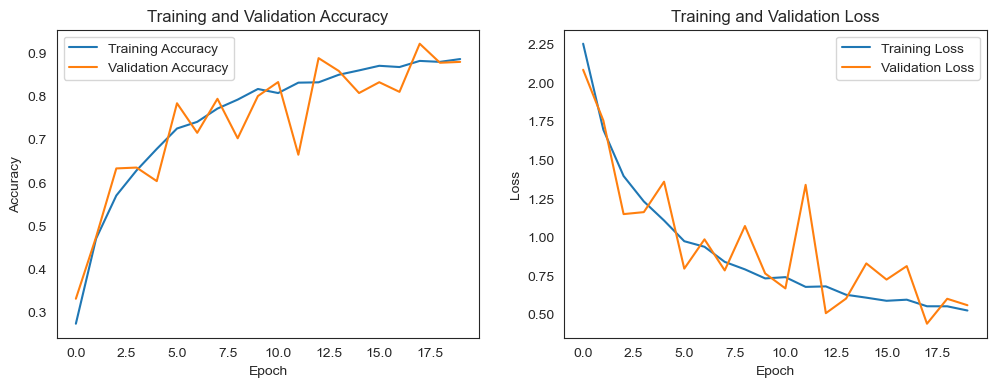

In [74]:

history = model_RS_aug.history  

# Plot training and validation accuracy
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history['accuracy'], label='Training Accuracy')
plt.plot(history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

# Plot training and validation loss
plt.subplot(1, 2, 2)
plt.plot(history['loss'], label='Training Loss')
plt.plot(history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.show()

### Loading Best Model from  RandomSearch

In [26]:
model_RS_aug = load_model('Models/best_model_RS_aug.h5')

In [27]:
# Evaluate the best model on test data
test_loss, test_acc = model_RS_aug.evaluate(images_b_test, labels_b_test)
print(f'Test accuracy: {test_acc}')

94/94 [==============================] - 1s 12ms/step - loss: 0.3864 - accuracy: 0.9357
Test accuracy: 0.9356666803359985


## Looking at Confusion Matrix & Classification Report
- Test accuracy of ~0.94, which is actually __very close / not an improvement__ to our previous model trained on __Oversampled train + Augmentation__ which also got around __0.95__ accuracy

94/94 [==============================] - 1s 10ms/step


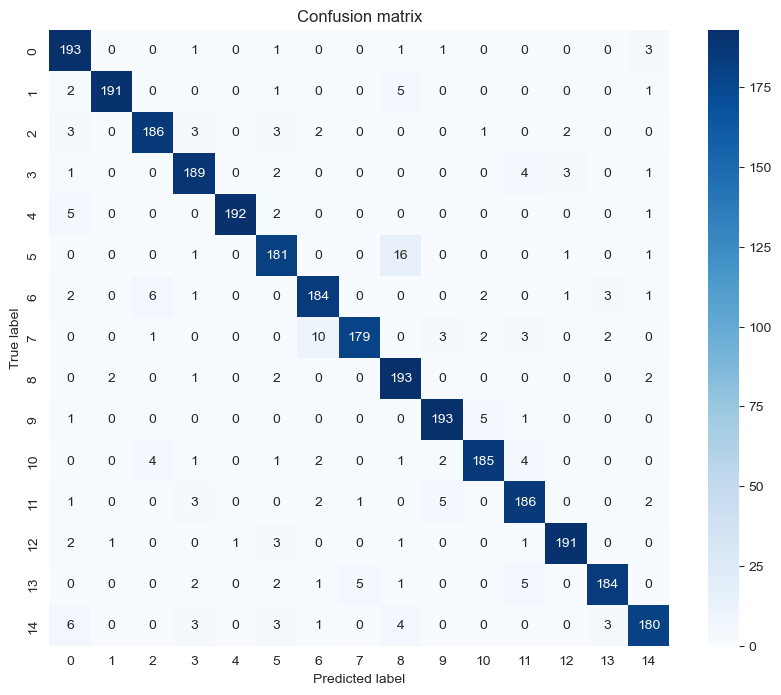

Classification Report
              precision    recall  f1-score   support

        Bean       0.89      0.96      0.93       200
Bitter_Gourd       0.98      0.95      0.97       200
Bottle_Gourd       0.94      0.93      0.94       200
     Brinjal       0.92      0.94      0.93       200
    Broccoli       0.99      0.96      0.98       200
     Cabbage       0.90      0.91      0.90       200
    Capsicum       0.91      0.92      0.92       200
      Carrot       0.97      0.90      0.93       200
 Cauliflower       0.87      0.96      0.91       200
    Cucumber       0.95      0.96      0.96       200
      Papaya       0.95      0.93      0.94       200
      Potato       0.91      0.93      0.92       200
     Pumpkin       0.96      0.95      0.96       200
      Radish       0.96      0.92      0.94       200
      Tomato       0.94      0.90      0.92       200

    accuracy                           0.94      3000
   macro avg       0.94      0.94      0.94      3000
weig

In [28]:
Confusion_Matrix_And_Report(model_RS_aug,images_b_test,labels_b_test)

## Analyze Misclassifications

94/94 [==============================] - 1s 10ms/step


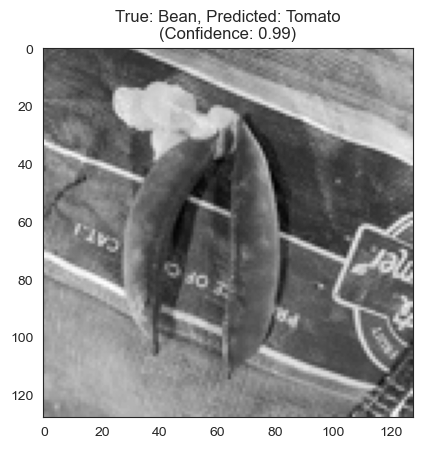

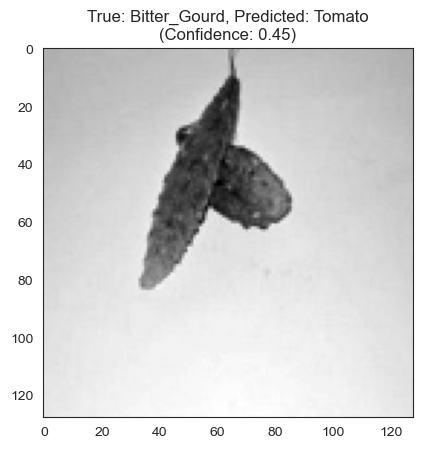

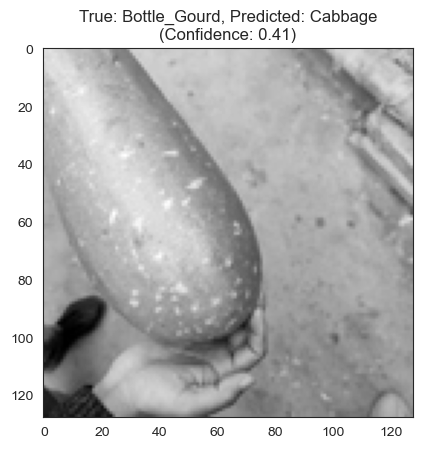

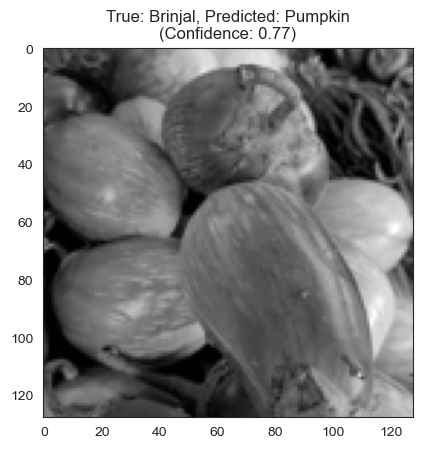

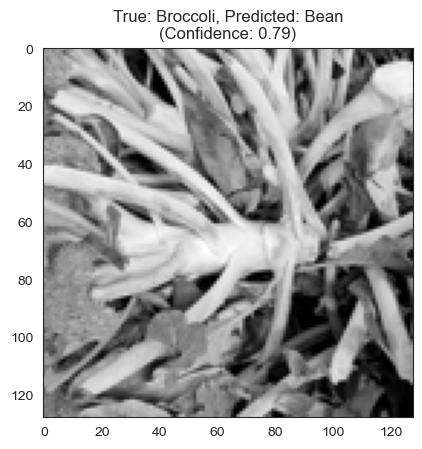

...

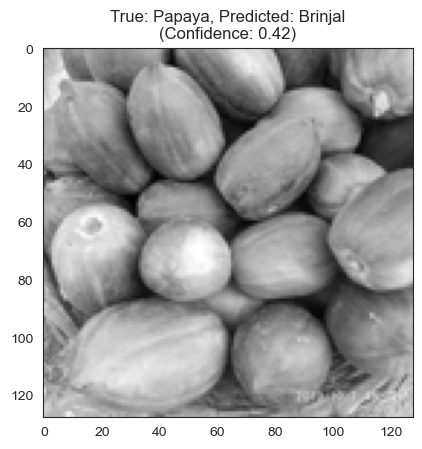

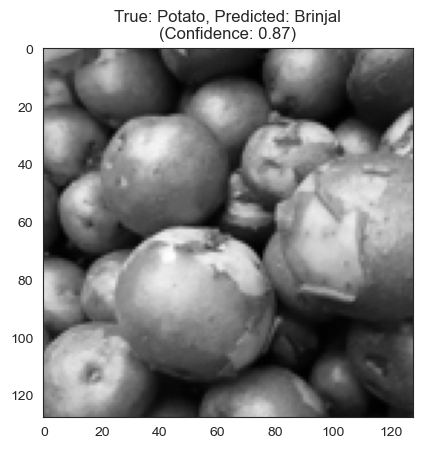

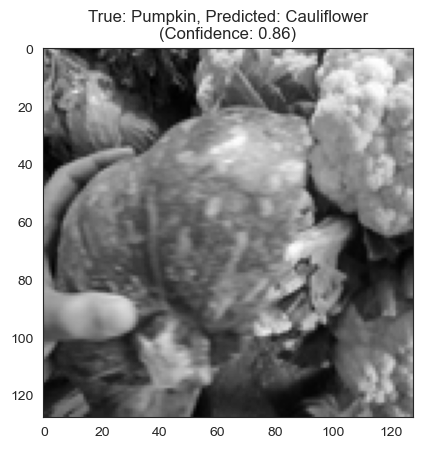

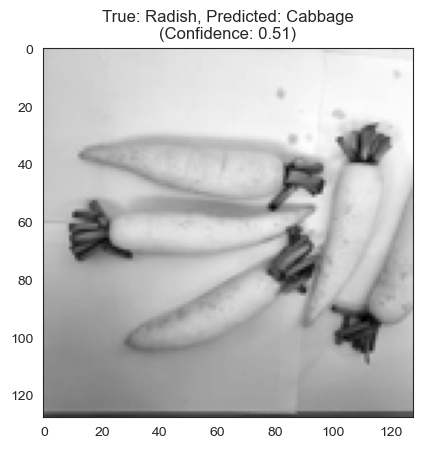

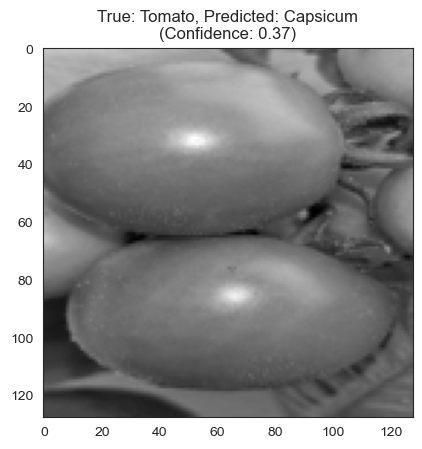

In [29]:
visualize_misclassifications(model_RS_aug,images_b_test,labels_b_test)

## RandomSearch 128 by 128 Input (Resampled Train + Augmentation)
- I'll be using reusing most of the model architecture from previously, while tunning mainly on:
    - __Regularizer__ : L2 as well as Dropout layers 
    - __Learning Rate__: [0.0005,0.001,0.003,0.005,0.01] , trying a few values mainly closer to 0.001
    

In [ ]:
model_b_aug = Sequential([
    Conv2D(32, kernel_size=(3, 3), activation="relu", input_shape=(128, 128, 1), kernel_regularizer=l2(0.001)),
    MaxPooling2D(pool_size=(2, 2)),
    Dropout(0.3),
    Conv2D(64, kernel_size=(3, 3), activation='relu', kernel_regularizer=l2(0.001)),
    MaxPooling2D(pool_size=(2, 2)),
    Dropout(0.3),
    Conv2D(128, kernel_size=(3, 3), activation='relu'),
    MaxPooling2D(pool_size=(2, 2)),
    Dropout(0.3),
    Conv2D(256, kernel_size=(3, 3), activation='relu'),
    MaxPooling2D(pool_size=(2, 2)),
    Dropout(0.2),
    Flatten(),
    Dense(512, activation='relu'),

    Dense(num_classes, activation="softmax")
])

In [49]:
def build_model_b_aug_kernel_regularizer(hp):
    # Data augmentation parameters
    data_augmentation = hp.Boolean('data_augmentation', default=False)
    rotation_range = hp.Float('rotation_range', min_value=0.0, max_value=180.0, default=0.0)
    width_shift_range = hp.Float('width_shift_range', min_value=0.0, max_value=1.0, default=0.0)
    height_shift_range = hp.Float('height_shift_range', min_value=0.0, max_value=1.0, default=0.0)
    horizontal_flip = hp.Boolean('horizontal_flip', default=False)
    
    if data_augmentation:
        # Create an ImageDataGenerator with the specified augmentation parameters
        datagen = ImageDataGenerator(
            rotation_range=rotation_range,
            width_shift_range=width_shift_range,
            height_shift_range=height_shift_range,
            horizontal_flip=horizontal_flip
        )
    else:
        datagen = None
    model = Sequential()
    model.add(Conv2D(32, kernel_size=(3, 3), activation="relu", input_shape=(128, 128, 1), kernel_regularizer=l2(hp.Float('kernel_regularizer_32', min_value=1e-5, max_value=1e-2, sampling='log'))))
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(hp.Float('dropout_128', min_value=0.0, max_value=0.4, step=0.1)))

    model.add(Conv2D(64, kernel_size=(3, 3), activation='relu', kernel_regularizer=l2(hp.Float('kernel_regularizer_64', min_value=1e-5, max_value=1e-2, sampling='log'))))
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(hp.Float('dropout_128', min_value=0.0, max_value=0.4, step=0.1)))

    model.add(Conv2D(128, kernel_size=(3, 3), activation='relu'))
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(hp.Float('dropout_128', min_value=0.0, max_value=0.4, step=0.1)))

    model.add(Conv2D(256,  kernel_size=(3, 3), activation='relu'))
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(hp.Float('dropout_256', min_value=0.0, max_value=0.4, step=0.1)))

    model.add(Flatten())
    model.add(Dense(512, activation='relu'))
    
    model.add(Dropout(hp.Float('dropout_256', min_value=0.0, max_value=0.4, step=0.1)))
    
    model.add(Dense(num_classes, activation="softmax"))

    # Define optimizer with tunable learning rate
    optimizer = Adam(learning_rate=hp.Choice('learning_rate', values=[0.0005,0.001,0.003,0.005,0.01]))

    model.compile(
        optimizer=optimizer,
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )

    return model

# Instantiate the tuner
tuneraug_b2 = RandomSearch(
    build_model_b_aug_kernel_regularizer,
    objective='val_accuracy',
    max_trials=30,  # Adjust as needed
    directory='KerasTunner_dir/tuner_diraug23',
    project_name='my_tuner_aug_resampled',
)
# Early stopping
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=5,
    restore_best_weights=True
)



tuneraug_b2.search(images_b_train_resampled,labels_b_train_resampled, validation_data=(images_b_val,labels_b_val), epochs=20, callbacks=[early_stopping])



K.clear_session()

Trial 30 Complete [00h 03m 38s]
val_accuracy: 0.06666667014360428

Best val_accuracy So Far: 0.9336666464805603
Total elapsed time: 01h 27m 25s


In [55]:
tuneraug_b2.results_summary()

Results summary
Results in KerasTunner_dir/tuner_diraug23\my_tuner_aug_resampled
Showing 10 best trials
Objective(name="val_accuracy", direction="max")

Trial 13 summary
Hyperparameters:
data_augmentation: True
rotation_range: 18.280542454856125
width_shift_range: 0.5264771169718809
height_shift_range: 0.8360636537559458
horizontal_flip: True
kernel_regularizer_32: 6.836054604862777e-05
dropout_128: 0.30000000000000004
kernel_regularizer_64: 5.0763201998100845e-05
dropout_256: 0.4
learning_rate: 0.0005
Score: 0.9336666464805603

Trial 16 summary
Hyperparameters:
data_augmentation: False
rotation_range: 112.8311097114412
width_shift_range: 0.24037559771447325
height_shift_range: 0.14336977551975227
horizontal_flip: False
kernel_regularizer_32: 0.0008993130874557861
dropout_128: 0.1
kernel_regularizer_64: 0.006879529077043188
dropout_256: 0.4
learning_rate: 0.0005
Score: 0.9326666593551636

Trial 27 summary
Hyperparameters:
data_augmentation: True
rotation_range: 169.50260559195584
width

### Looking at Model Architecture

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 126, 126, 32)      320       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 63, 63, 32)       0         
 )                                                               
                                                                 
 dropout (Dropout)           (None, 63, 63, 32)        0         
                                                                 
 conv2d_1 (Conv2D)           (None, 61, 61, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 30, 30, 64)       0         
 2D)                                                             
                                                                 
 dropout_1 (Dropout)         (None, 30, 30, 64)        0

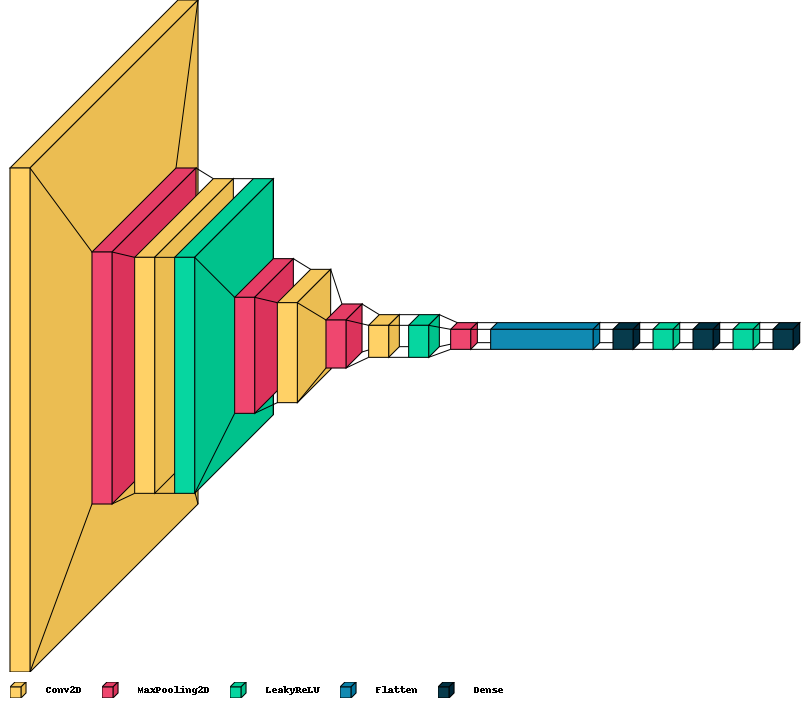

In [67]:
best_modelaugB_resampled.summary()

# Visualizing layers of Neural Network using plot_model
#display(plot_model(best_model3, show_shapes=True, show_layer_names=True))

# Using visualkeras

display(visualkeras.layered_view(best_modelaug4, spacing=20, legend=True))

## Retraining the Best Model(s)
- We can try to narrow down the search to the __top 10__ models from the __RandomSearch__, as just picking the first model does not guarantee best fit

### Best Hyperparams 

In [70]:
# Get the best trial
best_trial_aug = tuneraug_b2.oracle.get_best_trials(1)[0]

# Get the best hyperparameters from the best trial
best_hyperparameters = best_trial_aug.hyperparameters.values
best_hyperparameters

{'data_augmentation': True,
 'rotation_range': 18.280542454856125,
 'width_shift_range': 0.5264771169718809,
 'height_shift_range': 0.8360636537559458,
 'horizontal_flip': True,
 'kernel_regularizer_32': 6.836054604862777e-05,
 'dropout_128': 0.30000000000000004,
 'kernel_regularizer_64': 5.0763201998100845e-05,
 'dropout_256': 0.4,
 'learning_rate': 0.0005}

### Fit with best params
- here, we would retrain our __best model__ from the hyperparameter tunning on more epochs, while using __early stopping__ to ensure __no over-fitting__


In [78]:
import gc
models_top_5 = []
histories_top_5 = []

# Get the top 5 hyperparameter configurations
best_hps = tuneraug_b2.get_best_hyperparameters(5)

for i, best_hp in enumerate(best_hps):
    model_aug = build_model_b_aug_kernel_regularizer(best_hp)
    
    # Add any additional callbacks as needed
    callbacks = [
        early_stopping,
        ModelCheckpoint(f'Models/best_model_RS_aug_resampled_{i+1}.h5', monitor='val_accuracy', save_best_only=True, mode='max')
    ]
    
    # Compile the model
    model_aug.compile(
        optimizer=Adam(learning_rate=best_hp.get('learning_rate')),
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )
    
    # Train the model and store the history
    history = model_aug.fit(images_b_train_resampled, labels_b_train_resampled, validation_data=(images_b_val, labels_b_val), epochs=20, callbacks=callbacks)
    
    # Clear TensorFlow session and perform garbage collection
    K.clear_session()
    gc.collect()
    
    models_top_5.append(model_aug)
    histories_top_5.append(history)



Epoch 1/20
448/448 [==============================] - 11s 24ms/step - loss: 2.3581 - accuracy: 0.2110 - val_loss: 2.3010 - val_accuracy: 0.2637
Epoch 2/20
448/448 [==============================] - 10s 23ms/step - loss: 1.3447 - accuracy: 0.5661 - val_loss: 1.4736 - val_accuracy: 0.5123
Epoch 3/20
448/448 [==============================] - 10s 23ms/step - loss: 0.8067 - accuracy: 0.7454 - val_loss: 0.8198 - val_accuracy: 0.7343
Epoch 4/20
448/448 [==============================] - 10s 23ms/step - loss: 0.5177 - accuracy: 0.8341 - val_loss: 1.2017 - val_accuracy: 0.6477
Epoch 5/20
448/448 [==============================] - 10s 23ms/step - loss: 0.3617 - accuracy: 0.8858 - val_loss: 0.7331 - val_accuracy: 0.7823
Epoch 6/20
448/448 [==============================] - 10s 23ms/step - loss: 0.2830 - accuracy: 0.9099 - val_loss: 0.3623 - val_accuracy: 0.8920
Epoch 7/20
448/448 [==============================] - 10s 23ms/step - loss: 0.2268 - accuracy: 0.9290 - val_loss: 0.3504 - val_accuracy:

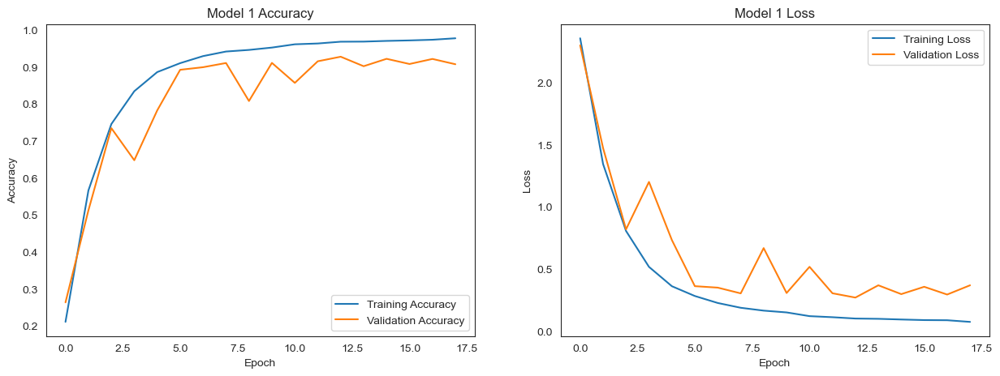

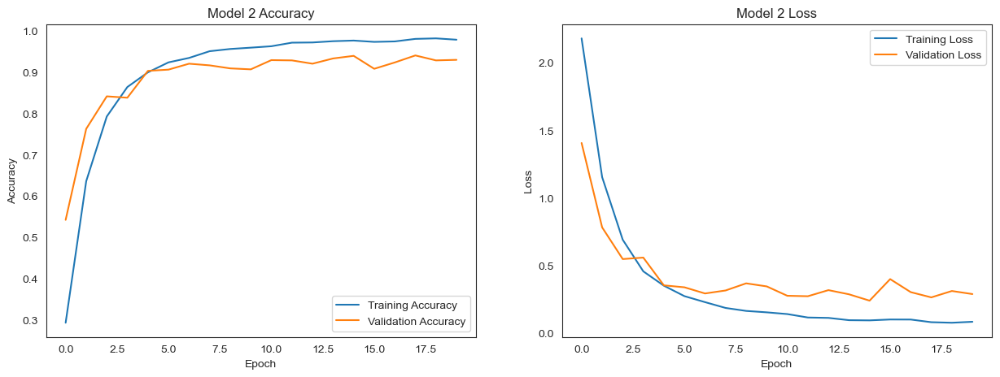

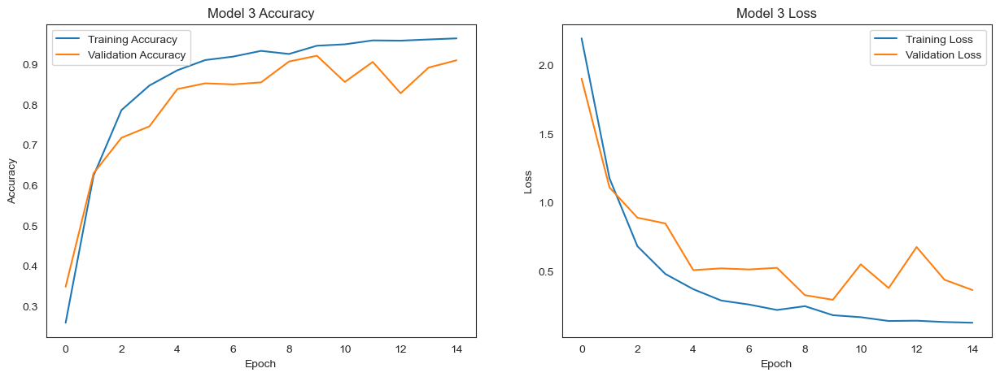

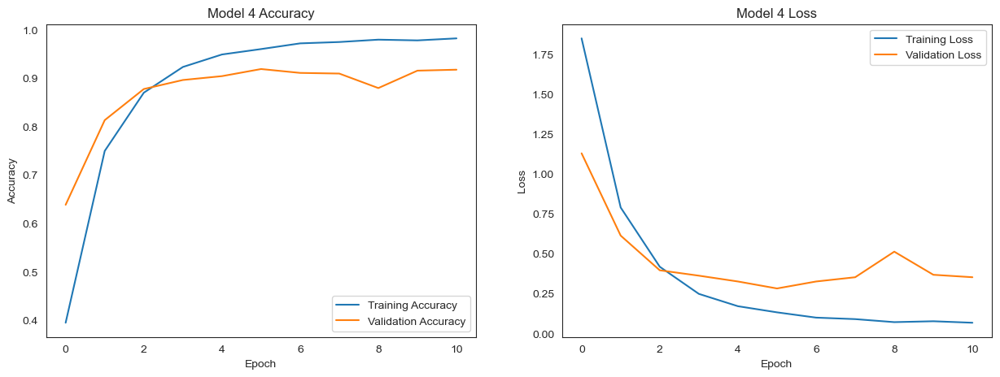

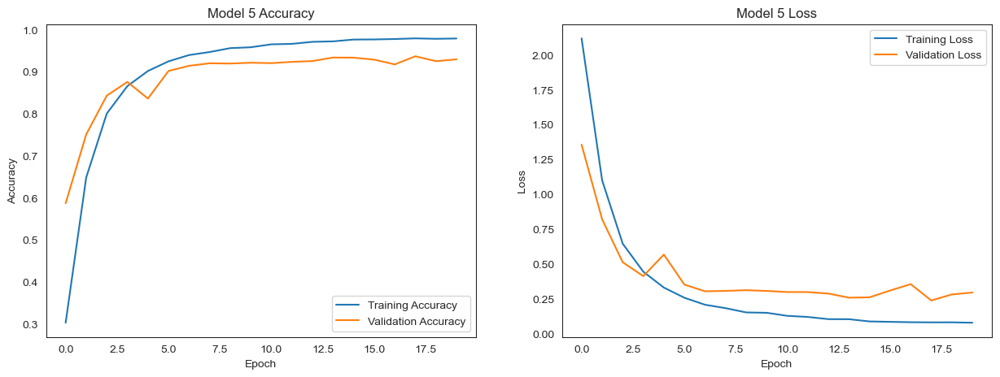

In [82]:

# Assuming you've already run the loop to obtain histories_top_5

for i, history in enumerate(histories_top_5):
    plt.figure(figsize=(15, 5))

    # Plot Training and Validation Accuracy
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Training Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title(f'Model {i+1} Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()

    # Plot Training and Validation Loss
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title(f'Model {i+1} Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()

    plt.show()



# Testing on pre-trained model ResNet50 / Transfer Learning

The image below shows the classification accuracies of __pre-trained CNN Models__ 

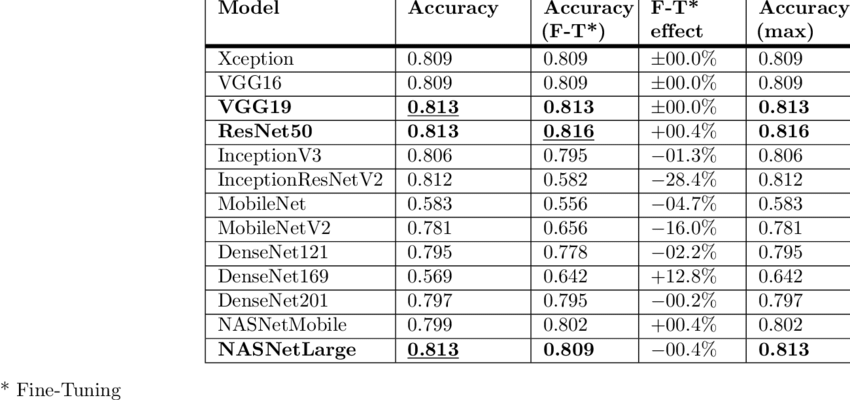

_source: https://www.researchgate.net/figure/The-accuracy-comparison-of-pre-trained-CNN-models_tbl2_335717881_

- I would be using the __ResNet50__ since __VGG19__ seems to take a longer __training time__

## For 128 by 128 pixels input dataset


In [ ]:
resnet50_B = keras.applications.ResNet50(
    weights=None, input_shape=(128, 128, 1), classes=15)
resnet50_B.compile(
    optimizer='adam', loss='categorical_crossentropy', metrics=["accuracy"])
resnet50_history = resnet50_B.fit(images_b_train_resampled, labels_b_train_resampled, epochs=10, validation_data=(
    images_b_val, labels_b_val), validation_split=0.5, batch_size=32)

Epoch 1/10
1791/1791 [==============================] - 89s 47ms/step - loss: 1.8654 - accuracy: 0.4744 - val_loss: 1.9459 - val_accuracy: 0.5433
Epoch 2/10
1791/1791 [==============================] - 82s 46ms/step - loss: 0.9284 - accuracy: 0.7128 - val_loss: 1.1680 - val_accuracy: 0.6707
Epoch 3/10
1791/1791 [==============================] - 82s 46ms/step - loss: 0.6113 - accuracy: 0.8092 - val_loss: 0.9567 - val_accuracy: 0.7317
Epoch 4/10
1791/1791 [==============================] - 82s 46ms/step - loss: 0.4156 - accuracy: 0.8703 - val_loss: 0.6338 - val_accuracy: 0.8130
Epoch 5/10
1791/1791 [==============================] - 82s 46ms/step - loss: 0.3035 - accuracy: 0.9047 - val_loss: 0.6952 - val_accuracy: 0.8177
Epoch 6/10
1791/1791 [==============================] - 81s 45ms/step - loss: 0.2202 - accuracy: 0.9306 - val_loss: 2.0957 - val_accuracy: 0.6007
Epoch 7/10
1791/1791 [==============================] - 81s 45ms/step - loss: 0.1690 - accuracy: 0.9472 - val_loss: 3.3564 -

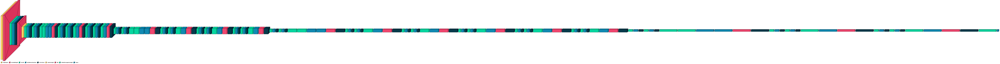

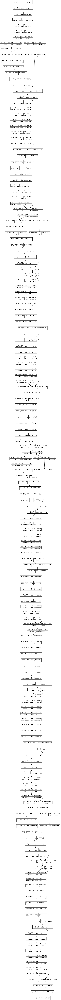

In [ ]:
# Resnet50 layers visualized
display(visualkeras.layered_view(resnet50_B, spacing=10, legend=True))
display(plot_model(resnet50_B, show_shapes=True, show_layer_names=True))

### Evaluate Performance


In [ ]:
score_resnet50_B = resnet50_B.evaluate(test_generator_b, verbose=0)
print("Test loss:", score_resnet50_B[0])
print("Test accuracy:", score_resnet50_B[1])

Test loss: 0.388924777507782
Test accuracy: 0.9049999713897705
